# Setup environment

In [1]:
import os
import numpy as np
import pandas as pd
pd.set_option('display.precision', 10)
import matplotlib.pyplot as plt
from datetime import datetime
from pytz import timezone
import copy
import pathlib
import pickle

from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

from src.lightgbm_wrapper.feature_engineer import add_time_features, add_lag_features, add_rolling_features
from src.lightgbm_wrapper.station_embedding import learn_station_embeddings, attach_station_embedding
from src.lightgbm_wrapper.plot import plot_1_data, plot_2_data
from src.lightgbm_wrapper.model import build_supervised_for_horizon, train_test_validation_split, train_lgbm_for_horizon, plot_timeseries_example

try:
    import lightgbm as lgb
except:
    print("lightgbm is not installed")

DATA_DIR = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"
STATION_IDS = [211, 212, 213, 214, 215, 216]

BASE_FEATURE_COLS = [
    "NO2_quantrac",
    "PM25_quantrac",
    "O3_quantrac",
    "CO_quantrac",
    "Temperature_quantrac",
    "Humid_quantrac",
]

# Define lag and rolling windows for feature engineering
LAG_STEPS = [3, 6, 12, 24, 48, 72]
ROLL_WINDOWS = [3, 6, 12, 24, 48, 72]

# Define horizon (= n_past = n_future)
HORIZONS = [1, 24, 48, 72]

'''
# Directory to save the results and meta data
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")
'''

# Store the results in one directory only, for testing API purpose
LIGHTGBM_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model"
if os.path.isdir(LIGHTGBM_DIR):
    import shutil
    shutil.rmtree(LIGHTGBM_DIR)
pathlib.Path(LIGHTGBM_DIR).mkdir(parents=True, exist_ok=True)
print(LIGHTGBM_DIR)
with open(os.path.join(LIGHTGBM_DIR, "CONFIGURATIONS.txt"), "w") as f:
    f.write(f"BASE_FEATURE_COLS: {BASE_FEATURE_COLS}\n")
    f.write(f"LAG_STEPS: {LAG_STEPS}\n")
    f.write(f"ROLL_WINDOWS: {ROLL_WINDOWS}\n")
    f.write(f"HORIZONS: {HORIZONS}\n")

/le_thanh_van_118/workspace/hiep_workspace/lightgbm_results/no2_o3_co_testing_model


# Load dataset

In [2]:
def load_station_csv(station_id, data_dir=DATA_DIR):
    csv_path = os.path.join(data_dir, f"{station_id}.csv")
    df = pd.read_csv(csv_path)

    # Convert to datetime
    df["date"] = pd.to_datetime(df["date"])
    df = df.sort_values("date").reset_index(drop=True)

    # Remove unncessary column
    if "Unnamed: 0" in df.columns:
        df = df.drop(columns=["Unnamed: 0"])

    # Add station_id column
    df["station_id"] = station_id
    return df

# Load dataset
dfs = []
for sid in STATION_IDS:
    df_sid = load_station_csv(sid, DATA_DIR)
    dfs.append(df_sid)
df_all = pd.concat(dfs, ignore_index=True)

# Sort data by station then date
df_all = df_all.sort_values(["station_id", "date"]).reset_index(drop=True)

# Remove uncessary features
df_all = df_all.loc[:, ["date"] + BASE_FEATURE_COLS + ["station_id"]]

print(df_all.shape)
print(df_all.columns)
df_all

(92966, 8)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id'],
      dtype='object')


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
92961,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
92962,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
92963,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
92964,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


In [3]:
df_all.isnull().sum()

date                        0
NO2_quantrac            43684
PM25_quantrac           43043
O3_quantrac             47797
CO_quantrac             43760
Temperature_quantrac    52890
Humid_quantrac          52890
station_id                  0
dtype: int64

# Data preparation

## Drop missing

Output: df_dropped

In [4]:
df_dropped_na = df_all.dropna().reset_index(drop=True)

df_dropped = df_dropped_na.reset_index(drop=True)
df_dropped

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,0.0882333333,41.4500000000,75.9166666667,2.0871666667,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,0.0832166667,50.5300000000,66.1166666667,2.0065000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,0.0843000000,55.0550000000,55.1333333333,2.4188333333,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,0.0666500000,26.0783333333,46.7500000000,1.4815000000,27.0366666667,63.3616666667,216


## Visualization

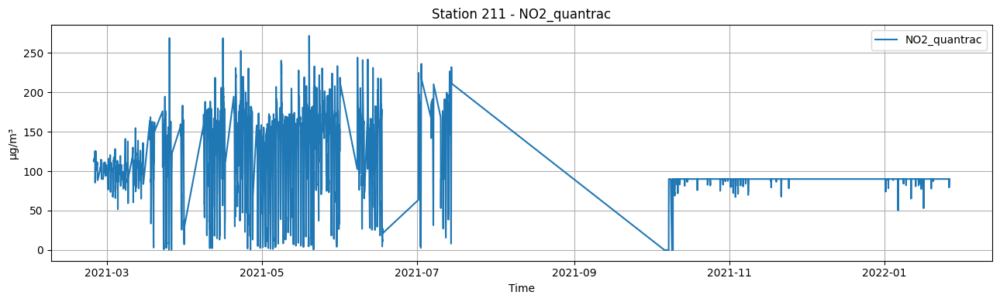

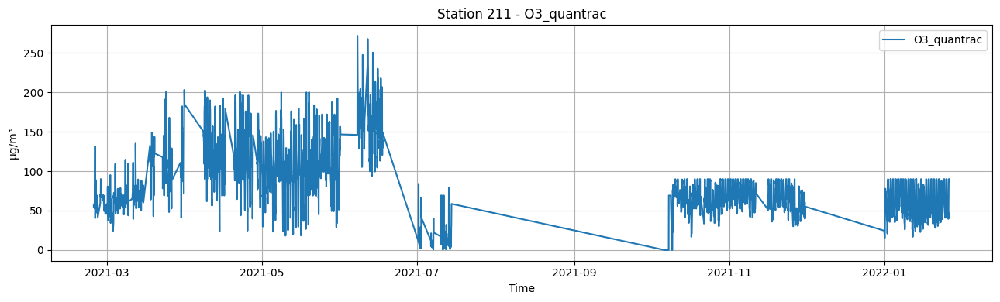

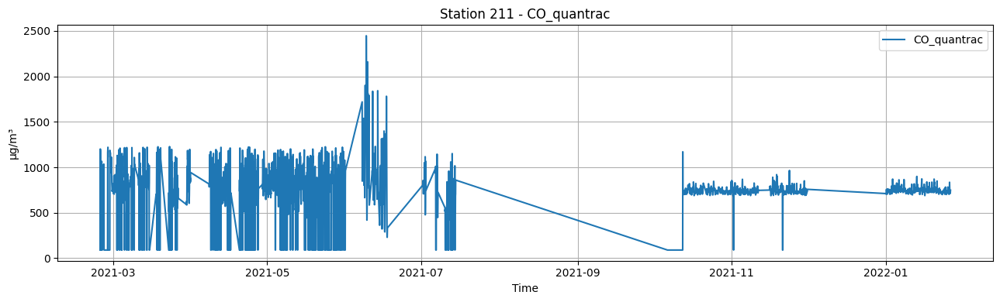

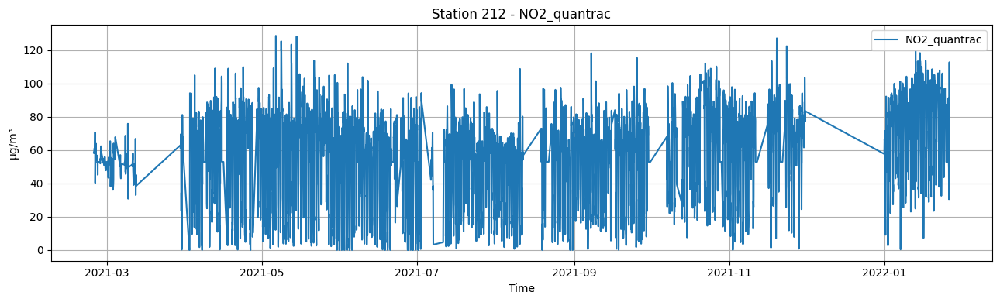

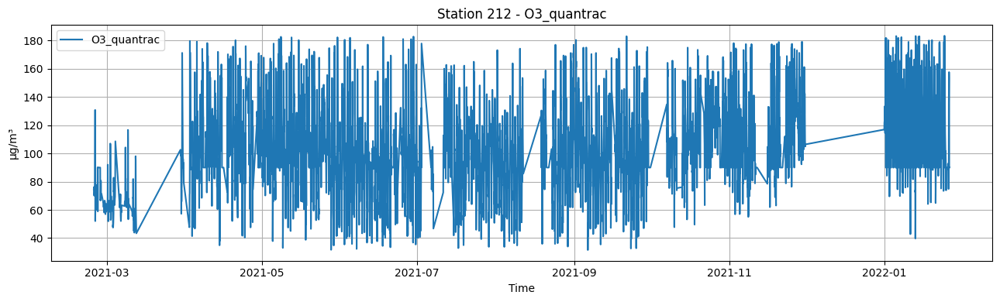

...

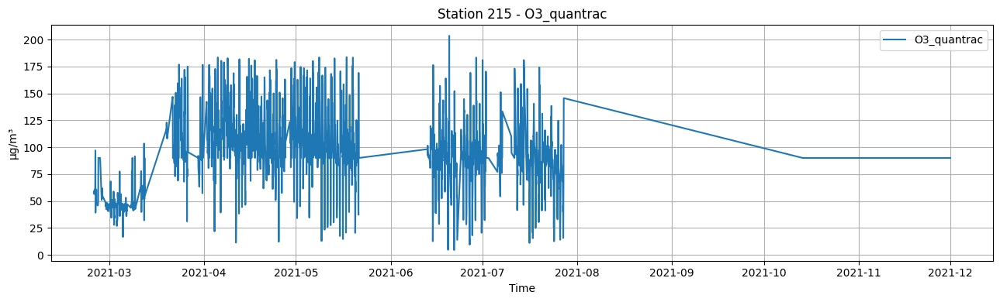

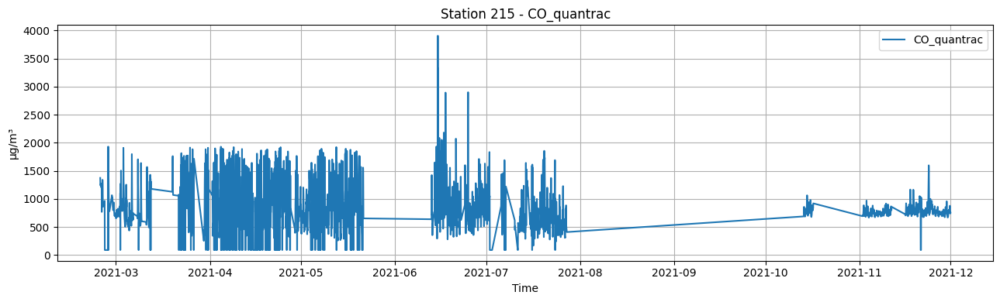

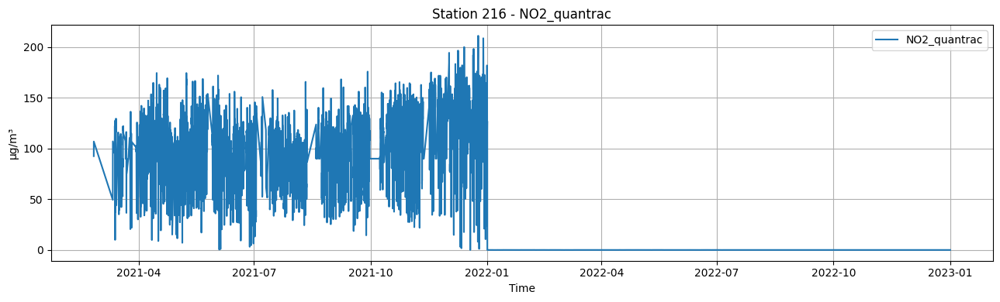

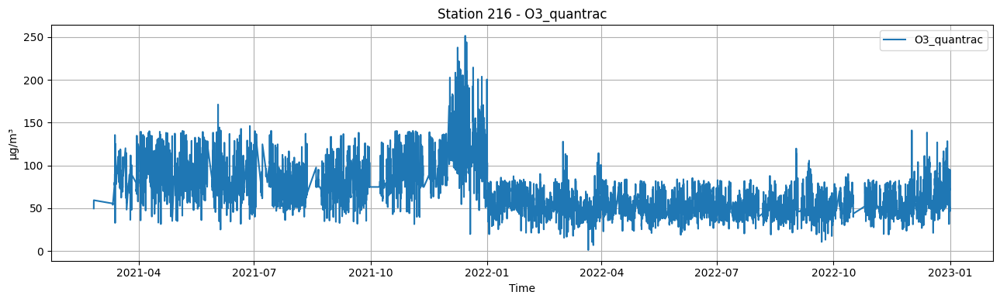

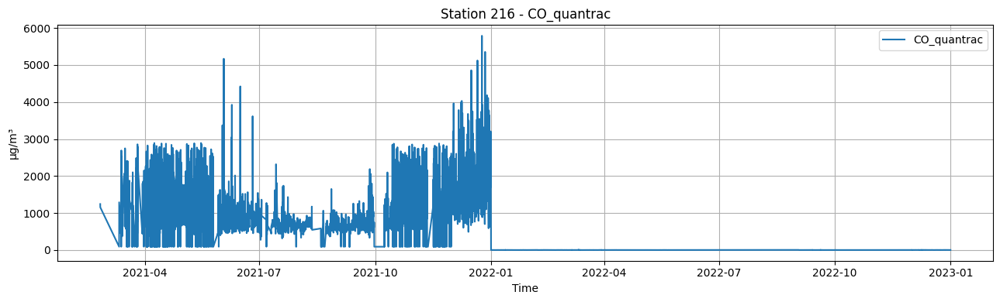

In [5]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, target_col, df_station["date"], f"Station {station} - {target_col}")
            #plot_1_data(df_station, target_col, target_col, df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Convert ppm to ug/m3

Apply only to station 216, year 2022 on NO2, CO columns

Output: df_converted

In [6]:
df_converted = copy.deepcopy(df_dropped)
mask = (df_converted["station_id"] == 216) & (df_converted["date"] >= "2022-01-01")
df_converted.loc[mask, "NO2_quantrac"] = df_converted.loc[mask, "NO2_quantrac"].apply(lambda x: x * 1883.2)
df_converted.loc[mask, "CO_quantrac"] = df_converted.loc[mask, "CO_quantrac"].apply(lambda x: x * 1146.8)
df_converted

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211
...,...,...,...,...,...,...,...,...
38704,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216
38705,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216
38706,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216
38707,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216


## Visualization after converting unit

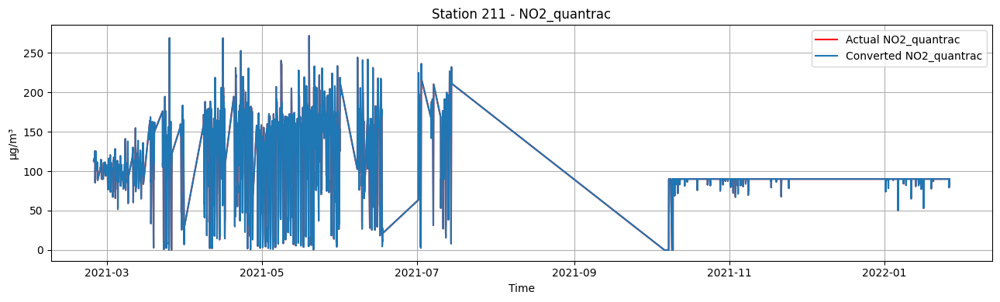

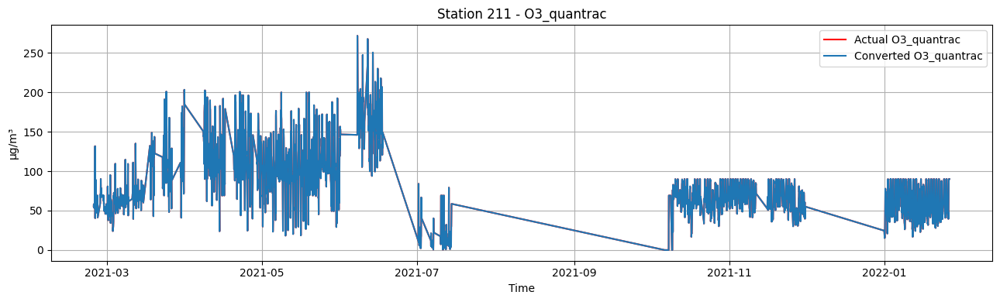

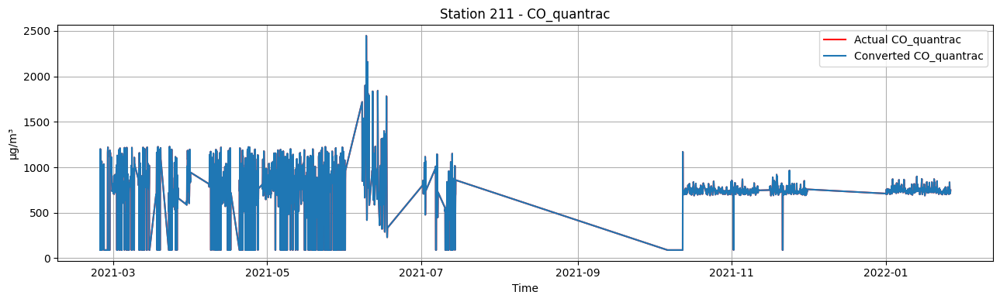

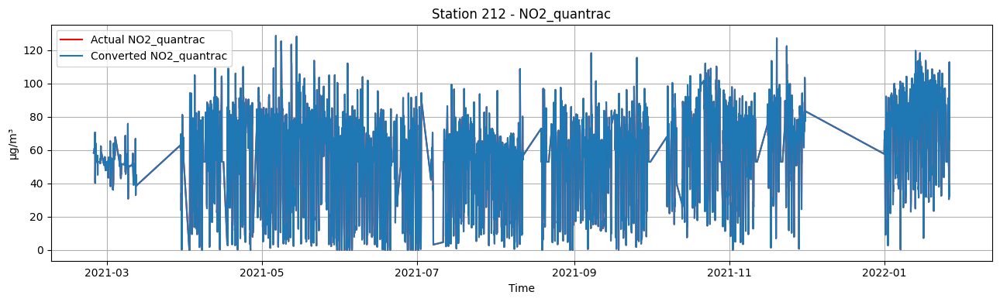

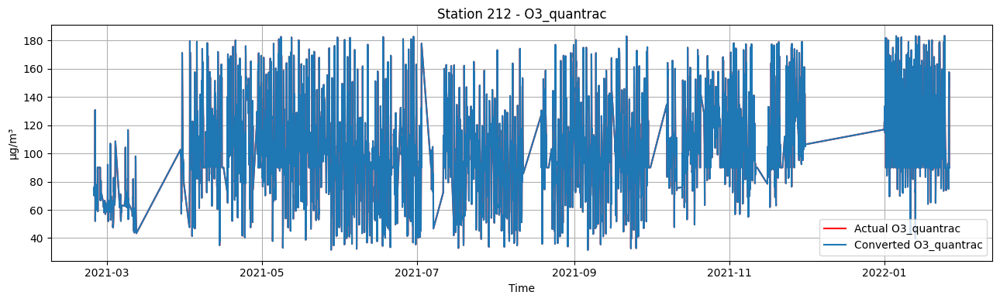

...

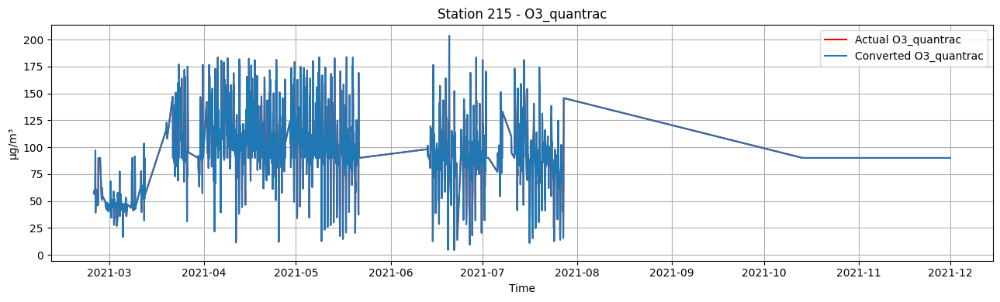

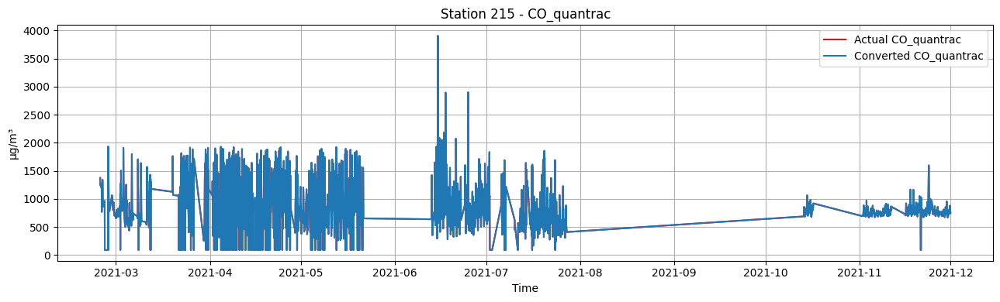

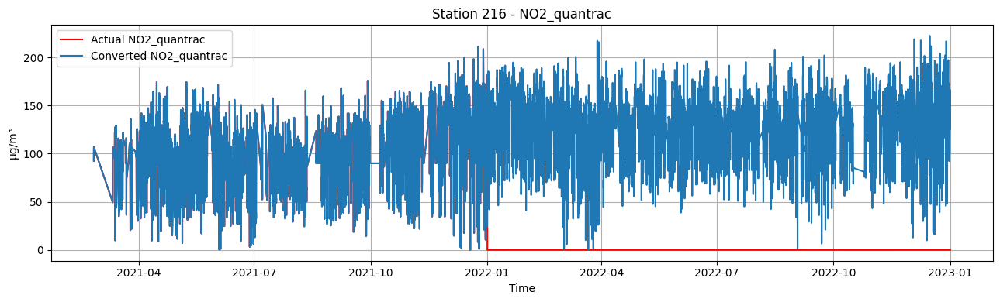

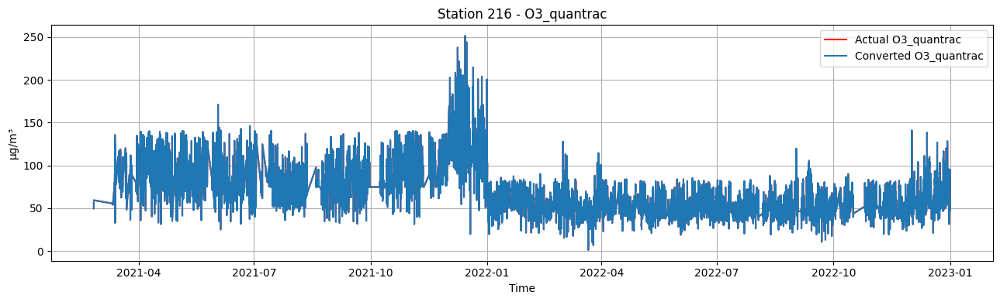

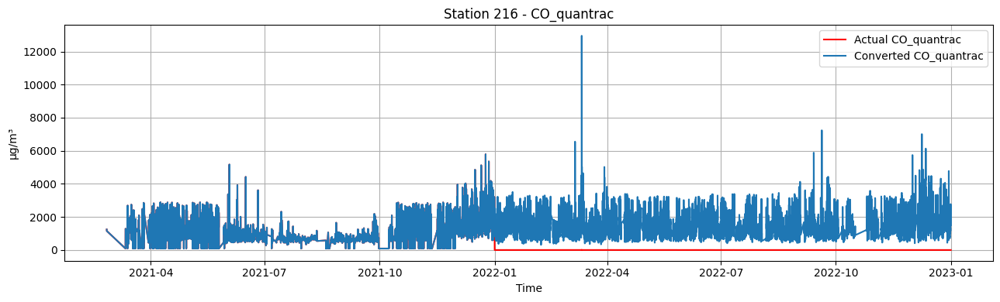

In [7]:
for station in STATION_IDS:
    df_station = df_dropped[df_dropped["station_id"] == station]
    df_station_converted = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_2_data(df_station, target_col, f"Actual {target_col}",
                        df_station_converted, target_col, f"Converted {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Ugly hack to remove outliers

In [8]:
test = copy.deepcopy(df_converted)

lenbefore = len(test)
print(f"Before: {lenbefore} records")

# 212 CO quantrac
test212 = test[test["station_id"] == 212]
test = test.drop(index=test212[test212["CO_quantrac"] > 4000].index)

# 213 CO quantrac
test213 = test[test["station_id"] == 213]
test = test.drop(index=test213[test213["CO_quantrac"] > 4000].index)

# 214 CO quantrac
test214 = test[test["station_id"] == 214]
test = test.drop(index=test214[test214["CO_quantrac"] > 4000].index)

# 215 NO2 quantrac
# 215 CO quantrac
test215 = test[test["station_id"] == 215]
test = test.drop(index=test215[test215["NO2_quantrac"] > 140].index)
test = test.drop(index=test215[test215["CO_quantrac"] > 2500].index)

# 216 CO quantrac
test216 = test[test["station_id"] == 216]
test = test.drop(index=test216[test216["CO_quantrac"] > 10000].index)

lenafter = len(test)
print(f"After: {lenafter} records")
print(f"Removed {lenbefore - lenafter} records")

df_converted = test.reset_index(drop=True)

Before: 38709 records
After: 38692 records
Removed 17 records


## Visualization after removing outliers

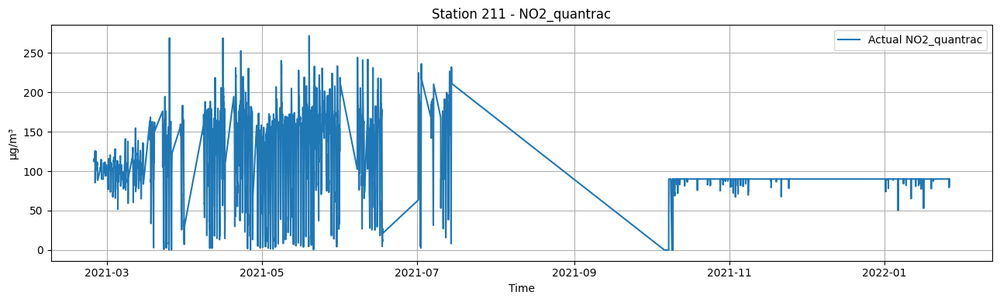

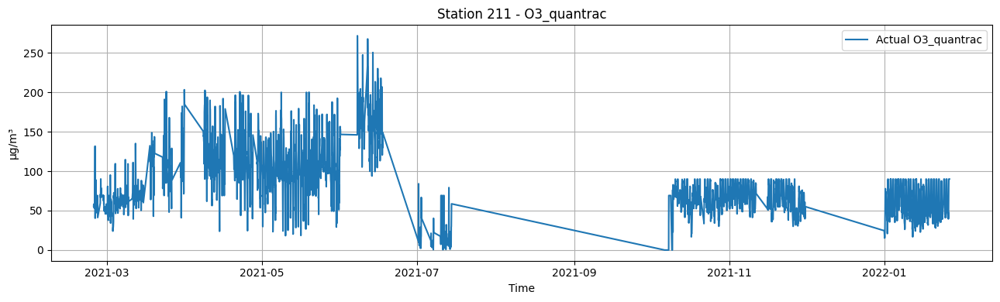

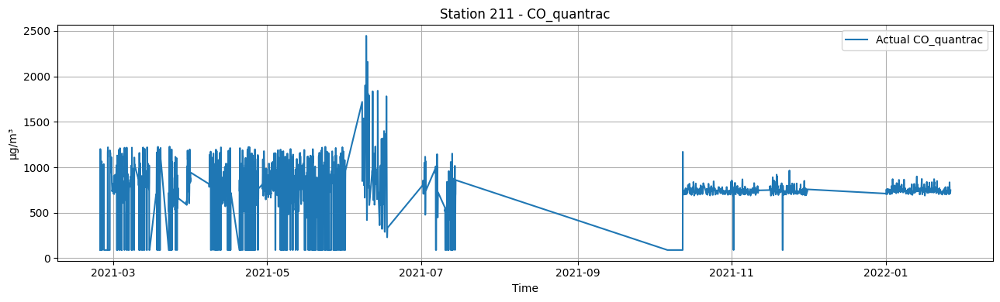

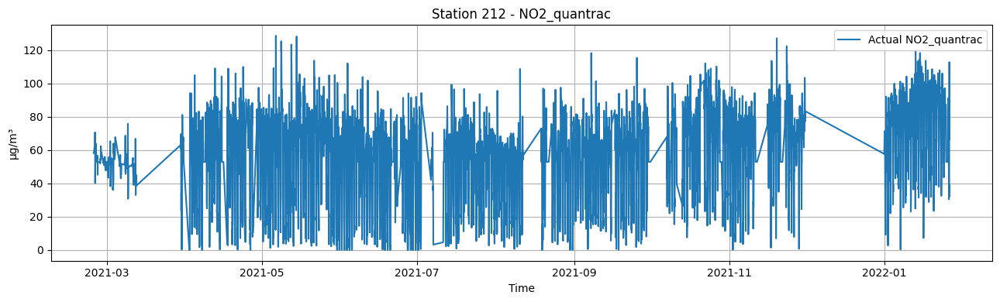

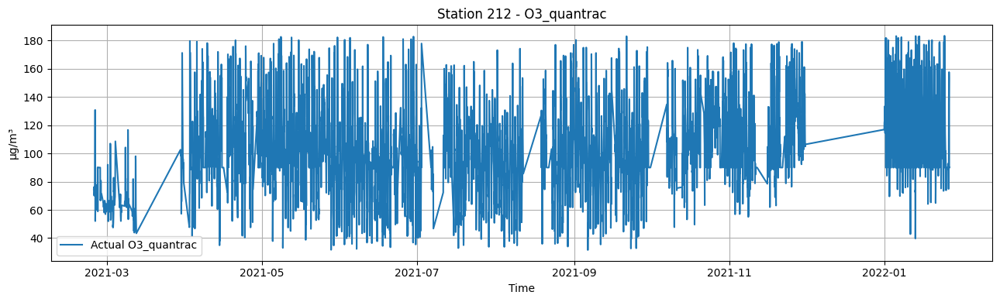

...

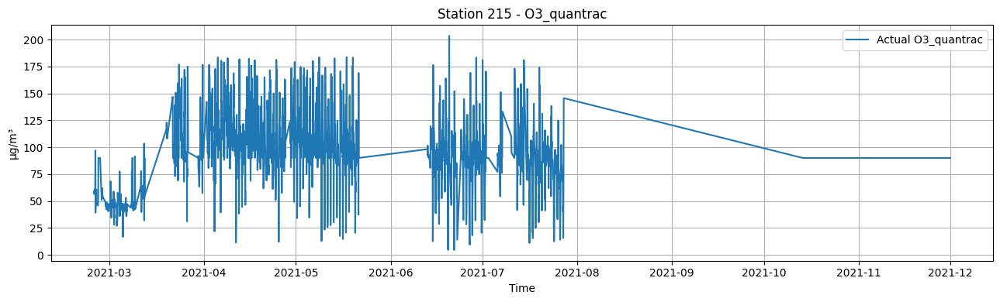

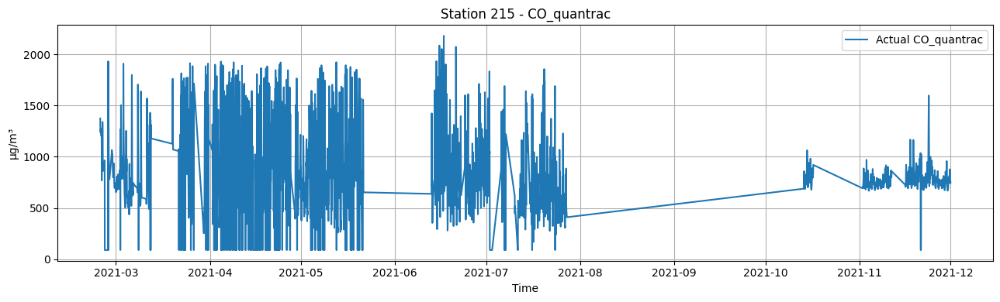

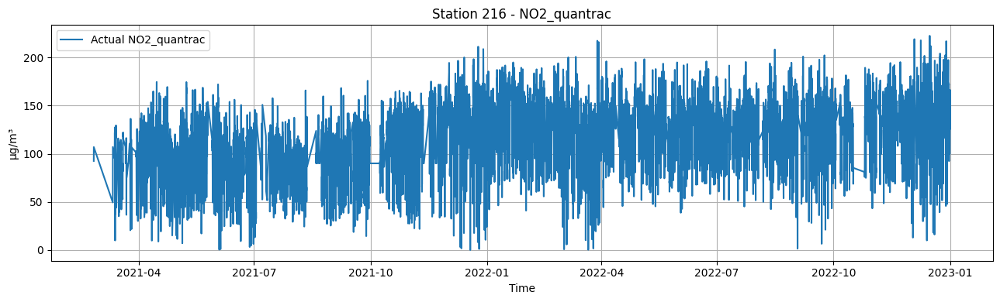

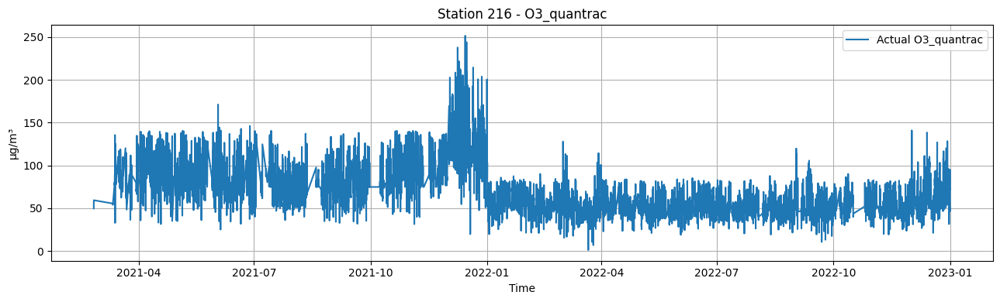

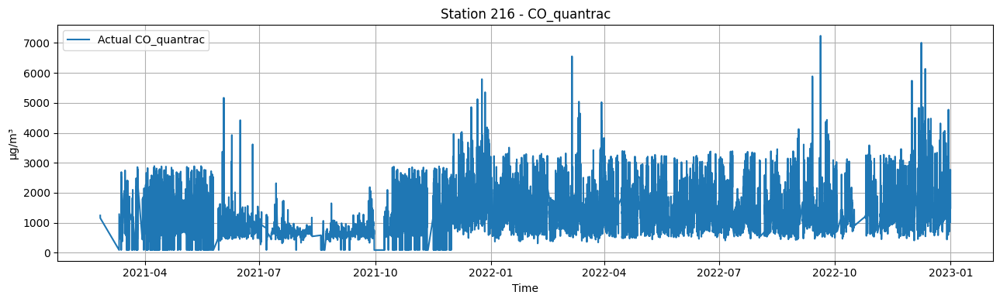

In [9]:
for station in STATION_IDS:
    df_station = df_converted[df_converted["station_id"] == station]
    for target_col in df_station.columns:
        if target_col not in ["date", "station_id", "Temperature_quantrac", "Humid_quantrac", "PM25_quantrac"]:
            plot_1_data(df_station, target_col, f"Actual {target_col}",
                        df_station["date"], f"Station {station} - {target_col}")
                        #df_station.index, f"Station {station} - {target_col}")
    print("\n" + "=" * 150 + "\n")

## Feature engineering

### Time features

In [10]:
# Add time features and lag feature for all gases
dftestno2 = add_time_features(df_converted)
dftestno2 = add_lag_features(dftestno2, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=[3, 6, 12, 24])
dftestno2 = add_rolling_features(dftestno2, group_col="station_id", target_cols=["NO2_quantrac"], windows=[3, 6, 12, 24])
print(dftestno2.shape)
print(dftestno2.columns)
dftestno2

(38692, 43)
Index(['date', 'NO2_quantrac', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'station_id', 'hour',
       'dayofweek', 'month', 'NO2_quantrac_lag3', 'NO2_quantrac_lag6',
       'NO2_quantrac_lag12', 'NO2_quantrac_lag24', 'PM25_quantrac_lag3',
       'PM25_quantrac_lag6', 'PM25_quantrac_lag12', 'PM25_quantrac_lag24',
       'O3_quantrac_lag3', 'O3_quantrac_lag6', 'O3_quantrac_lag12',
       'O3_quantrac_lag24', 'CO_quantrac_lag3', 'CO_quantrac_lag6',
       'CO_quantrac_lag12', 'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_quantrac

,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,Humid_quantrac_lag12,Humid_quantrac_lag24,NO2_quantrac_roll3_mean,NO2_quantrac_roll3_std,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,NaN,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,NaN,NaN,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,NaN,NaN,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,NaN,NaN,112.5159235333,0.1697189071,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,68.0600000000,71.9266666667,147.2034666667,18.8622115885,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,66.5483333333,72.9183333333,160.5741866667,6.5995644704,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.6833333333,78.1200000000,161.7145688889,4.7480395477,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,61.6400000000,82.1033333333,160.5428000000,4.9712952838,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334


### Station embedding

In [11]:
test_station_to_embedding, _ = learn_station_embeddings(dftestno2, target_col="NO2_quantrac", station_col="station_id", embed_dim=4)
print(test_station_to_embedding)

dftestno2, _ = attach_station_embedding(dftestno2, test_station_to_embedding, station_col="station_id")
display(dftestno2)

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,153.8731333333,14.3380635114,135.2451466667,23.8597941057,135.8343141013,22.5466882334,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


## Build supervised from time-series

In [12]:
# Example
Xdummy, ydummy = build_supervised_for_horizon(dftestno2, horizon_h=1, target_col="NO2_quantrac")
print("Horizon 1h:", Xdummy.shape, ydummy.shape)
print(Xdummy.columns)
print(ydummy.columns)
display(Xdummy)
display(ydummy)

Horizon 1h: (38542, 46) (38542, 3)
Index(['date', 'station_id', 'PM25_quantrac', 'O3_quantrac', 'CO_quantrac',
       'Temperature_quantrac', 'Humid_quantrac', 'hour', 'dayofweek', 'month',
       'NO2_quantrac_lag3', 'NO2_quantrac_lag6', 'NO2_quantrac_lag12',
       'NO2_quantrac_lag24', 'PM25_quantrac_lag3', 'PM25_quantrac_lag6',
       'PM25_quantrac_lag12', 'PM25_quantrac_lag24', 'O3_quantrac_lag3',
       'O3_quantrac_lag6', 'O3_quantrac_lag12', 'O3_quantrac_lag24',
       'CO_quantrac_lag3', 'CO_quantrac_lag6', 'CO_quantrac_lag12',
       'CO_quantrac_lag24', 'Temperature_quantrac_lag3',
       'Temperature_quantrac_lag6', 'Temperature_quantrac_lag12',
       'Temperature_quantrac_lag24', 'Humid_quantrac_lag3',
       'Humid_quantrac_lag6', 'Humid_quantrac_lag12', 'Humid_quantrac_lag24',
       'NO2_quantrac_roll3_mean', 'NO2_quantrac_roll3_std',
       'NO2_quantrac_roll6_mean', 'NO2_quantrac_roll6_std',
       'NO2_quantrac_roll12_mean', 'NO2_quantrac_roll12_std',
       'NO2_q

,date,station_id,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-24 21:00:00,211,15.7116666700,55.9127833300,896.5540000000,27.8000000000,66.0550000000,21,2,2,...,110.9782539833,8.7910802916,108.7458061667,11.6703996987,111.2911683250,8.5276176290,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-24 22:00:00,211,15.6533333300,53.4917500000,931.1250000000,27.8000000000,66.2716666700,22,2,2,...,112.9722778000,7.1361384153,108.1629089417,11.2547508374,111.2790324125,8.5256720042,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-24 23:00:00,211,15.5950000000,50.6454000000,934.5630000000,27.8000000000,66.2166666700,23,2,2,...,114.2321722333,5.4976888124,106.9186978250,9.9132556170,111.2027683583,8.5237078586,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-25 00:00:00,211,15.1866666700,51.4960333300,1004.0870000000,27.7966666700,66.3783333300,0,3,2,...,111.8796722333,1.2625489371,109.0581658833,7.2617421674,111.1348072500,8.5177478315,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-25 01:00:00,211,15.3450000000,51.6269000000,1024.5240000000,27.7800000000,66.4683333300,1,3,2,...,111.4353111167,1.4959850529,110.0305325500,6.3819593962,111.0197961375,8.5174176826,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,2022-12-31 18:00:00,216,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,2022-12-31 19:00:00,216,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,2022-12-31 20:00:00,216,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,2022-12-31 21:00:00,216,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,date,station_id,NO2_quantrac_t_plus_1h
0,2021-02-24 21:00:00,211,110.5361333000
1,2021-02-24 22:00:00,211,111.0693667000
2,2021-02-24 23:00:00,211,109.7206000000
3,2021-02-25 00:00:00,211,108.5600333000
4,2021-02-25 01:00:00,211,110.3479333000
...,...,...,...
38537,2022-12-31 18:00:00,216,166.1610133333
38538,2022-12-31 19:00:00,216,156.7136266667
38539,2022-12-31 20:00:00,216,158.7537600000
38540,2022-12-31 21:00:00,216,125.5152800000


## Split train/validation/test for each station

In [13]:
# Example
(X_train_dummy, y_train_dummy, meta_train_dummy,
 X_val_dummy, y_val_dummy, meta_val_dummy,
 X_test_dummy, y_test_dummy, meta_test_dummy) = train_test_validation_split(Xdummy, ydummy)
display(X_test_dummy)
display(y_test_dummy)

,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,hour,dayofweek,month,NO2_quantrac_lag3,NO2_quantrac_lag6,...,NO2_quantrac_roll6_mean,NO2_quantrac_roll6_std,NO2_quantrac_roll12_mean,NO2_quantrac_roll12_std,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
3329,26.1833333300,35.8462000004,741.5384000000,24.0700000000,81.9216666700,4,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,89.4493298596,1.9075773226,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3330,14.0833333300,20.8097354148,725.9719000000,23.6400000000,80.2966666700,5,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3331,15.4000000000,21.1161272138,738.6734000000,23.5500000000,79.6700000000,6,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3332,20.7166666700,30.0598503566,757.8498000000,23.9883333300,80.2866666700,7,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3333,21.9166666700,51.8978718504,749.9997000000,26.6766666700,72.2516666700,8,6,1,90.0000000000,90.0000000000,...,90.0000000000,0.0000000000,90.0000000000,0.0000000000,86.8322370720,5.8590313167,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38537,36.6416666667,85.6000000000,1687.5162000000,28.1816666667,64.2983333333,18,5,12,112.6153600000,111.9562400000,...,118.6259066667,19.0129302674,128.6670244444,17.1541920845,136.7144485457,23.9144727000,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38538,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,19,5,12,126.0488533333,99.5898933333,...,127.0113777778,25.4786255264,130.9242488889,19.6848721122,137.2270974346,24.3389891274,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38539,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,20,5,12,153.2924800000,108.2526133333,...,138.1065644444,25.6434745913,132.8885311111,21.9952138696,137.0636252124,24.1209076873,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38540,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,21,5,12,162.2690666667,112.6153600000,...,146.1834000000,21.6863628929,133.9504466667,22.8691412366,136.3835807679,23.2780210582,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657


,NO2_quantrac_t_plus_1h
3329,90.0000000000
3330,90.0000000000
3331,90.0000000000
3332,90.0000000000
3333,90.0000000000
...,...
38537,166.1610133333
38538,156.7136266667
38539,158.7537600000
38540,125.5152800000


# LightGBM model

## Add time and lags features

In [14]:
# Add time features and lag feature for all gases
df_time_feats = add_time_features(df_converted)
df_lag_feats = add_lag_features(df_time_feats, group_col="station_id", target_cols=BASE_FEATURE_COLS, lag_steps=LAG_STEPS)

## Training for NO2

In [15]:
label = "NO2_quantrac"

# Add rolling features for LABEL
df_no2 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
no2_station_to_embedding, _ = learn_station_embeddings(df_no2, target_col=label, station_col="station_id", embed_dim=4)
df_no2, _ = attach_station_embedding(df_no2, no2_station_to_embedding, station_col="station_id")
print(no2_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as no2_emb_file:
    pickle.dump(no2_station_to_embedding, no2_emb_file)

# Print dataset
display(df_no2)

# Start running model
no2_all_metrics = []
no2_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_no2, horizon_h=h, target_col=label)
    no2_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    no2_all_metrics.append(metrics_by_station)

# Metrics table
no2_df_metrics_all = pd.concat(no2_all_metrics, ignore_index=True)
no2_df_metrics_all = no2_df_metrics_all.sort_values(["station", "horizon_h"]).reset_index(drop=True)
no2_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
no2_df_metrics_all

[Embed] epoch 001 | train MSE=8945.3569 | val MSE=8836.1859
[Embed] epoch 010 | train MSE=6346.3705 | val MSE=5962.2047
[Embed] epoch 020 | train MSE=1944.6327 | val MSE=1794.4738
[Embed] epoch 030 | train MSE=1023.6253 | val MSE=1017.0699
[Embed] epoch 040 | train MSE=974.4662 | val MSE=987.2691
[Embed] epoch 050 | train MSE=974.0785 | val MSE=987.6006
{211: [7.782829, -4.09747, -4.5961213, 3.8078797], 212: [3.5855365, -3.9908829, -2.4162335, 1.0250082], 213: [2.9658248, -3.1664917, -2.539614, 2.5171337], 214: [1.5897979, -2.4742687, -4.4660373, 2.1730874], 215: [2.984351, -3.522223, -1.998513, 2.4715588], 216: [5.107183, -5.4918914, -6.1699085, 6.0908666]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,NO2_quantrac_roll24_mean,NO2_quantrac_roll24_std,NO2_quantrac_roll48_mean,NO2_quantrac_roll48_std,NO2_quantrac_roll72_mean,NO2_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,112.7407619000,NaN,112.7407619000,NaN,112.7407619000,NaN,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,112.5536162500,0.2646639164,112.5536162500,0.2646639164,112.5536162500,0.2646639164,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,112.6025552667,0.2054472593,112.6025552667,0.2054472593,112.6025552667,0.2054472593,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,112.5721331250,0.1784406841,112.5721331250,0.1784406841,112.5721331250,0.1784406841,7.7828288078,-4.0974698067,-4.5961213112,3.8078796864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,137.2270974346,24.3389891274,149.0162092153,26.2871324723,150.0269925480,33.5195438146,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,137.0636252124,24.1209076873,148.8579681042,26.1575760067,149.8578532887,33.4051994474,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,136.3835807679,23.2780210582,148.3289719931,25.7240543085,149.0230551405,32.4454992401,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,135.8343141013,22.5466882334,147.7620503264,25.1708505476,148.2789295850,31.5758393774,5.1071829796,-5.4918913841,-6.1699085236,6.0908665657



===== Training LightGBM for horizon = 1h, target_col = NO2_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
NO2_quant

,date,target
0,2022-01-02,88.7008178222
1,2022-01-03,90.0000000000
2,2022-01-04,89.9384786957
3,2022-01-05,90.0000000000
4,2022-01-06,88.2903867585
5,2022-01-07,90.0000000000
6,2022-01-08,89.5619537858
7,2022-01-09,89.3604280386
8,2022-01-10,90.0000000000
9,2022-01-11,87.7334059784


,date,target
0,2022-01-02,90.2164299325
1,2022-01-03,91.8188416910
2,2022-01-04,91.9271557893
3,2022-01-05,92.3133082346
4,2022-01-06,92.4782674229
5,2022-01-07,91.4158017385
6,2022-01-08,91.2661598073
7,2022-01-09,90.0603620390
8,2022-01-10,93.2689275930
9,2022-01-11,90.3579164435


sid = 212, grp =                     date  station_id          y_true         y_pred
8781 2021-11-19 17:00:00         212   96.4211333300  82.5760932816
8782 2021-11-19 18:00:00         212   71.0141333300  95.9038942954
8783 2021-11-19 19:00:00         212   71.1082333300  86.7058814026
8784 2021-11-19 20:00:00         212   71.2023333300  86.6499312839
8785 2021-11-19 21:00:00         212   84.1881333300  80.4479518958
...                  ...         ...             ...            ...
9643 2022-01-26 11:00:00         212   39.4906333300  30.7686522899
9644 2022-01-26 12:00:00         212   32.0881000000  32.9347259409
9645 2022-01-26 13:00:00         212   55.1739666700  37.8752401297
9646 2022-01-26 14:00:00         212  112.7631667000  45.0348437614
9647 2022-01-26 15:00:00         212   66.4261521997  93.6099376103

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(

,date,target
0,2021-11-20,80.6267998571
1,2021-11-21,56.9423845343
2,2021-11-23,76.9806051246
3,2021-11-24,67.7291059379
4,2021-11-25,67.7936699283
5,2021-11-26,54.1290871168
6,2021-11-27,64.9021400388
7,2021-11-28,62.9656089087
8,2021-11-29,69.5948367342
9,2021-11-30,76.3476834750


,date,target
0,2021-11-20,71.5705666856
1,2021-11-21,61.1372843679
2,2021-11-23,69.9403299705
3,2021-11-24,63.2994437512
4,2021-11-25,64.4822405958
5,2021-11-26,63.4696165481
6,2021-11-27,64.5022656838
7,2021-11-28,63.2467605753
8,2021-11-29,65.8415609148
9,2021-11-30,68.4986282642


sid = 213, grp =                      date  station_id         y_true         y_pred
14631 2021-12-20 20:00:00         213   79.451766670  81.8087166028
14632 2021-12-20 21:00:00         213   79.294933330  85.2688809325
14633 2021-12-20 22:00:00         213   89.928233330  76.4461327182
14634 2021-12-20 23:00:00         213  102.976766700  76.1411967375
14635 2021-12-21 00:00:00         213  139.268000000  89.2769725026
...                   ...         ...            ...            ...
15506 2022-01-26 11:00:00         213   12.515300000  25.4857854265
15507 2022-01-26 12:00:00         213    8.249433333  22.4065476277
15508 2022-01-26 13:00:00         213   10.100066670  31.3856818327
15509 2022-01-26 14:00:00         213   52.727366670  42.6180553065
15510 2022-01-26 15:00:00         213   81.060428570  74.0568624307

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-21,71.0710407932
1,2021-12-22,74.7910255633
2,2021-12-23,52.4447122413
3,2021-12-24,60.1148074675
4,2021-12-25,69.1498324612
5,2021-12-26,63.1175085451
6,2021-12-27,70.2495448313
7,2021-12-28,83.7546399952
8,2021-12-29,69.7778303471
9,2021-12-30,46.9945102408


,date,target
0,2021-12-21,64.9612034139
1,2021-12-22,72.4577784828
2,2021-12-23,59.7741323880
3,2021-12-24,58.6282698565
4,2021-12-25,62.7727361423
5,2021-12-26,64.7889158297
6,2021-12-27,65.1889641946
7,2021-12-28,74.2334336061
8,2021-12-29,74.7904330526
9,2021-12-30,56.8505754395


sid = 214, grp =                      date  station_id          y_true          y_pred
20640 2021-11-23 16:00:00         214  121.1743860000   99.7723248069
20641 2021-11-23 17:00:00         214  125.3412000000   97.8672018569
20642 2021-11-23 18:00:00         214   74.8802630052  102.1725583685
20643 2021-11-23 19:00:00         214  132.6496333000  100.4268239826
20644 2021-11-23 20:00:00         214  123.3337333000   98.6974400140
...                   ...         ...             ...             ...
21541 2021-12-31 18:00:00         214  121.6713000000   86.6184218553
21542 2021-12-31 19:00:00         214  106.3016333000   91.5518457639
21543 2021-12-31 20:00:00         214   53.2187777800   92.9585181628
21544 2021-12-31 21:00:00         214   62.2628333300   66.6257713637
21545 2021-12-31 22:00:00         214   69.4771666700   66.0873612224

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021,

,date,target
0,2021-11-24,72.2917524911
1,2021-11-25,64.5454832237
2,2021-11-26,60.9871078221
3,2021-11-27,68.8999328696
4,2021-11-28,68.1493118003
5,2021-11-29,71.4217673629
6,2021-11-30,74.2305357700
7,2021-12-01,62.9133549792
8,2021-12-02,64.5000287675
9,2021-12-03,61.9790598150


,date,target
0,2021-11-24,73.5825639465
1,2021-11-25,69.0600666219
2,2021-11-26,70.1326796109
3,2021-11-27,64.9037335240
4,2021-11-28,67.2419053918
5,2021-11-29,64.4725228725
6,2021-11-30,65.5008340217
7,2021-12-01,71.5040762203
8,2021-12-02,72.5959868486
9,2021-12-03,70.9050349765


sid = 215, grp =                      date  station_id         y_true         y_pred
24155 2021-11-07 08:00:00         215  64.6299022253  49.2348110733
24156 2021-11-07 09:00:00         215  63.8320549371  51.0515706116
24157 2021-11-07 10:00:00         215  63.4028000782  53.6734649572
24158 2021-11-07 11:00:00         215  62.4885461009  55.9972363738
24159 2021-11-07 12:00:00         215  67.0863711014  56.3349593682
...                   ...         ...            ...            ...
24611 2021-11-30 18:00:00         215  67.9829827990  58.4563799249
24612 2021-11-30 19:00:00         215  67.3664108942  60.5745599098
24613 2021-11-30 20:00:00         215  66.0977312824  60.5645031006
24614 2021-11-30 21:00:00         215  66.7957677654  62.6917130544
24615 2021-11-30 22:00:00         215  67.7804241541  63.4177355638

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-07,65.0532398747
1,2021-11-08,65.4881208563
2,2021-11-09,63.8976724264
3,2021-11-10,65.2324574804
4,2021-11-11,63.0959230662
5,2021-11-16,64.9591587684
6,2021-11-17,64.1010187020
7,2021-11-18,63.3239395393
8,2021-11-19,63.5505831102
9,2021-11-20,64.1393349319


,date,target
0,2021-11-07,57.6759785594
1,2021-11-08,61.6522660447
2,2021-11-09,59.6594643837
3,2021-11-10,61.1973111209
4,2021-11-11,59.1949715857
5,2021-11-16,61.1442272176
6,2021-11-17,59.4202574391
7,2021-11-18,60.0466401288
8,2021-11-19,60.3950067968
9,2021-11-20,59.8283719519


sid = 216, grp =                      date  station_id          y_true          y_pred
36208 2022-09-20 19:00:00         216  141.8049600000  146.9724802616
36209 2022-09-20 20:00:00         216  168.6091733333  137.4432557368
36210 2022-09-20 21:00:00         216  154.4851733333  141.4372748969
36211 2022-09-20 22:00:00         216  136.0612000000  149.4879677231
36212 2022-09-20 23:00:00         216  124.6533538462  138.6085661148
...                   ...         ...             ...             ...
38249 2022-12-31 18:00:00         216  166.1610133333  150.7111918742
38250 2022-12-31 19:00:00         216  156.7136266667  152.2271742770
38251 2022-12-31 20:00:00         216  158.7537600000  155.8686781685
38252 2022-12-31 21:00:00         216  125.5152800000  155.8909171553
38253 2022-12-31 22:00:00         216  127.6495733333  146.8212470478

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9

,date,target
0,2022-09-21,116.7549208176
1,2022-09-22,124.7667622851
2,2022-09-23,124.1672665055
3,2022-09-24,118.7239599361
4,2022-09-25,131.5193690521
...,...,...
82,2022-12-27,161.2478151337
83,2022-12-28,157.7714464888
84,2022-12-29,149.2760703243
85,2022-12-30,157.1997776627


,date,target
0,2022-09-21,120.9366312930
1,2022-09-22,121.4553463128
2,2022-09-23,123.4342567791
3,2022-09-24,120.1397048982
4,2022-09-25,126.1721179279
...,...,...
82,2022-12-27,153.1308192095
83,2022-12-28,149.4187428825
84,2022-12-29,140.4958185373
85,2022-12-30,145.2335189820


Overall test metrics: {'rmse': 15.29, 'mae': 11.17, 'mape': 44.46, 'mnbe': -31.76, 'r': 0.93, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = NO2_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2022-01-02,90.0000000000
1,2022-01-03,89.9384786957
2,2022-01-04,90.0000000000
3,2022-01-05,88.2903867585
4,2022-01-06,90.0000000000
5,2022-01-07,89.5619537858
6,2022-01-08,89.3604280386
7,2022-01-09,90.0000000000
8,2022-01-10,87.7334059784
9,2022-01-11,90.0000000000


,date,target
0,2022-01-02,88.6937889744
1,2022-01-03,90.7534546092
2,2022-01-04,90.9180565568
3,2022-01-05,91.6816011965
4,2022-01-06,91.3550112424
5,2022-01-07,90.4797118345
6,2022-01-08,89.3769885492
7,2022-01-09,89.5186078952
8,2022-01-10,91.4712825682
9,2022-01-11,91.0732896390


sid = 212, grp =                     date  station_id          y_true         y_pred
8738 2021-11-18 21:00:00         212   71.2023333300  77.7637896731
8739 2021-11-18 22:00:00         212   84.1881333300  77.7050334944
8740 2021-11-18 23:00:00         212   84.2195000000  77.0028096948
8741 2021-11-19 00:00:00         212   85.8192000000  74.0909073649
8742 2021-11-19 01:00:00         212   81.9318965500  73.0859355257
...                  ...         ...             ...            ...
9597 2022-01-25 12:00:00         212   39.4906333300  47.8772873743
9598 2022-01-25 13:00:00         212   32.0881000000  53.7976913847
9599 2022-01-25 14:00:00         212   55.1739666700  57.8724382890
9600 2022-01-25 15:00:00         212  112.7631667000  63.0622725392
9601 2022-01-25 16:00:00         212   66.4261521997  67.0816884225

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-19,80.3810943017
1,2021-11-20,57.7121748118
2,2021-11-21,74.6385606804
3,2021-11-23,67.5160739937
4,2021-11-24,68.7555810392
5,2021-11-25,54.3983176726
6,2021-11-26,64.1820136496
7,2021-11-27,63.3772964087
8,2021-11-28,69.6497284008
9,2021-11-29,76.7410737529


,date,target
0,2021-11-19,62.0931584263
1,2021-11-20,63.4764708354
2,2021-11-21,66.5441152986
3,2021-11-23,62.3682405326
4,2021-11-24,63.2336071564
5,2021-11-25,62.5872380367
6,2021-11-26,61.0673857839
7,2021-11-27,57.9699118560
8,2021-11-28,58.8597407770
9,2021-11-29,62.1710819877


sid = 213, grp =                      date  station_id         y_true         y_pred
14566 2021-12-20 01:00:00         213  139.268000000  62.6611491100
14567 2021-12-20 02:00:00         213   57.480745760  68.0615162984
14568 2021-12-20 03:00:00         213   80.267300000  70.6263547519
14569 2021-12-20 04:00:00         213   61.259100000  73.1964938460
14570 2021-12-20 05:00:00         213   93.786333330  72.6546079836
...                   ...         ...            ...            ...
15437 2022-01-25 12:00:00         213   12.515300000  33.3477657020
15438 2022-01-25 13:00:00         213    8.249433333  32.4605812449
15439 2022-01-25 14:00:00         213   10.100066670  44.9922885365
15440 2022-01-25 15:00:00         213   52.727366670  54.7448437480
15441 2022-01-25 16:00:00         213   81.060428570  68.1252799468

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,70.4475454655
1,2021-12-21,74.8681352854
2,2021-12-22,53.4589011300
3,2021-12-23,61.3699786911
4,2021-12-24,66.5046312791
5,2021-12-25,64.0624293772
6,2021-12-26,70.7675860188
7,2021-12-27,83.7546399952
8,2021-12-28,70.4127809417
9,2021-12-29,47.8636282967


,date,target
0,2021-12-20,57.1160416711
1,2021-12-21,62.2906900210
2,2021-12-22,67.0458520575
3,2021-12-23,62.3257099035
4,2021-12-24,57.8677999724
5,2021-12-25,62.1296296076
6,2021-12-26,64.3400004279
7,2021-12-27,65.4430004197
8,2021-12-28,69.1717789314
9,2021-12-29,72.3543422433


sid = 214, grp =                      date  station_id        y_true         y_pred
20552 2021-11-22 21:00:00         214  123.33373330  80.0076580509
20553 2021-11-22 22:00:00         214  104.43324530  77.4027624292
20554 2021-11-22 23:00:00         214   88.58842857  77.9284545938
20555 2021-11-23 00:00:00         214   77.38156667  73.1802769147
20556 2021-11-23 01:00:00         214   78.76170000  74.1024723574
...                   ...         ...           ...            ...
21449 2021-12-30 19:00:00         214  121.67130000  76.1072957027
21450 2021-12-30 20:00:00         214  106.30163330  76.3288628707
21451 2021-12-30 21:00:00         214   53.21877778  72.3803946666
21452 2021-12-30 22:00:00         214   62.26283333  70.7876323059
21453 2021-12-30 23:00:00         214   69.47716667  70.7453590866

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,71.5062788803
1,2021-11-24,65.4799485013
2,2021-11-25,61.5869953221
3,2021-11-26,68.1745787029
4,2021-11-27,68.0996479116
5,2021-11-28,71.9641493075
6,2021-11-29,73.3548829921
7,2021-11-30,63.5981938679
8,2021-12-01,64.0012786608
9,2021-12-02,62.3183626996


,date,target
0,2021-11-23,65.9935391695
1,2021-11-24,66.7444840258
2,2021-11-25,65.0097951913
3,2021-11-26,63.8546681112
4,2021-11-27,59.8283561580
5,2021-11-28,60.7016907752
6,2021-11-29,63.9832247818
7,2021-11-30,66.1019549167
8,2021-12-01,63.2049947338
9,2021-12-02,61.2207586502


sid = 215, grp =                      date  station_id         y_true         y_pred
24043 2021-11-06 12:00:00         215  62.4885461009  59.2937975088
24044 2021-11-06 13:00:00         215  67.0863711014  57.7079640496
24045 2021-11-06 14:00:00         215  66.7117714249  58.9987374925
24046 2021-11-06 15:00:00         215  65.9195778251  61.3699641879
24047 2021-11-06 16:00:00         215  64.5835429055  62.3149324820
...                   ...         ...            ...            ...
24496 2021-11-29 19:00:00         215  67.9829827990  73.2053198167
24497 2021-11-29 20:00:00         215  67.3664108942  73.0786551795
24498 2021-11-29 21:00:00         215  66.0977312824  72.9136881627
24499 2021-11-29 22:00:00         215  66.7957677654  72.8061828978
24500 2021-11-29 23:00:00         215  67.7804241541  72.9586461472

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021

,date,target
0,2021-11-06,65.3056135835
1,2021-11-07,65.4730827661
2,2021-11-08,63.9807921809
3,2021-11-09,65.1698627819
4,2021-11-10,63.5588413339
5,2021-11-11,65.3775538865
6,2021-11-16,64.1816792372
7,2021-11-17,63.7908146387
8,2021-11-18,62.9755479676
9,2021-11-19,64.1848282632


,date,target
0,2021-11-06,66.0232638242
1,2021-11-07,64.6985079412
2,2021-11-08,67.3474022342
3,2021-11-09,65.6945279963
4,2021-11-10,66.3595683406
5,2021-11-11,62.0219159737
6,2021-11-16,65.4573531736
7,2021-11-17,64.2126729640
8,2021-11-18,63.9087590814
9,2021-11-19,62.8035796056


sid = 216, grp =                      date  station_id          y_true          y_pred
36073 2022-09-19 23:00:00         216  136.0612000000  142.0854533936
36074 2022-09-20 00:00:00         216  124.6533538462  138.8051190955
36075 2022-09-20 01:00:00         216  125.9967396226  137.0759340542
36076 2022-09-20 02:00:00         216  126.2057866667  134.8765179470
36077 2022-09-20 03:00:00         216  129.0933600000  134.4499965169
...                   ...         ...             ...             ...
38111 2022-12-30 19:00:00         216  166.1610133333  158.0028155216
38112 2022-12-30 20:00:00         216  156.7136266667  157.1653391850
38113 2022-12-30 21:00:00         216  158.7537600000  157.0988747191
38114 2022-12-30 22:00:00         216  125.5152800000  161.6764094946
38115 2022-12-30 23:00:00         216  127.6495733333  159.8422730602

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-20,116.7072372279
1,2022-09-21,124.9250033962
2,2022-09-22,123.3289809500
3,2022-09-23,119.5753232695
4,2022-09-24,130.4653001632
...,...,...
82,2022-12-26,162.6379829114
83,2022-12-27,157.5622020444
84,2022-12-28,148.9517414354
85,2022-12-29,158.3650076627


,date,target
0,2022-09-20,128.7345451222
1,2022-09-21,124.8705176490
2,2022-09-22,124.5770539833
3,2022-09-23,123.7695930231
4,2022-09-24,123.0519549406
...,...,...
82,2022-12-26,137.2391364941
83,2022-12-27,139.6947275191
84,2022-12-28,138.3583911879
85,2022-12-29,138.6379468116


Overall test metrics: {'rmse': 19.57, 'mae': 14.29, 'mape': 64.89, 'mnbe': -48.13, 'r': 0.89, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = NO2_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2022-01-01,90.0000000000
1,2022-01-02,89.9384786957
2,2022-01-03,90.0000000000
3,2022-01-04,88.2903867585
4,2022-01-05,90.0000000000
5,2022-01-06,89.5619537858
6,2022-01-07,89.3604280386
7,2022-01-08,90.0000000000
8,2022-01-09,87.7334059784
9,2022-01-10,90.0000000000


,date,target
0,2022-01-01,86.1484061678
1,2022-01-02,89.9729001555
2,2022-01-03,88.2432076463
3,2022-01-04,89.9070289956
4,2022-01-05,90.7240343452
5,2022-01-06,89.0226700606
6,2022-01-07,87.7471909697
7,2022-01-08,88.1535297598
8,2022-01-09,91.0664135630
9,2022-01-10,89.5800931388


sid = 212, grp =                     date  station_id          y_true         y_pred
8694 2021-11-18 01:00:00         212   81.9318965500  73.1698639162
8695 2021-11-18 02:00:00         212   77.5384000000  73.9370099161
8696 2021-11-18 03:00:00         212   79.7340666700  73.0039925358
8697 2021-11-18 04:00:00         212   80.7378000000  74.5528450796
8698 2021-11-18 05:00:00         212   74.1821666700  74.6148728868
...                  ...         ...             ...            ...
9549 2022-01-24 12:00:00         212   39.4906333300  43.7111176224
9550 2022-01-24 13:00:00         212   32.0881000000  44.1442649258
9551 2022-01-24 14:00:00         212   55.1739666700  48.8047094728
9552 2022-01-24 15:00:00         212  112.7631667000  58.5404470820
9553 2022-01-24 16:00:00         212   66.4261521997  66.1655119054

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(

,date,target
0,2021-11-18,80.1446549235
1,2021-11-19,57.7121748118
2,2021-11-20,74.6385606804
3,2021-11-21,67.5291434379
4,2021-11-23,68.7555810392
5,2021-11-24,54.3983176726
6,2021-11-25,64.1820136496
7,2021-11-26,63.3772964087
8,2021-11-27,69.6497284008
9,2021-11-28,76.7410737529


,date,target
0,2021-11-18,60.9065024380
1,2021-11-19,60.1926713994
2,2021-11-20,61.2424456574
3,2021-11-21,66.0842638231
4,2021-11-23,60.3994043593
5,2021-11-24,61.5477277428
6,2021-11-25,62.2222627229
7,2021-11-26,58.4369271015
8,2021-11-27,56.1378341098
9,2021-11-28,59.5885488233


sid = 213, grp =                      date  station_id         y_true         y_pred
14497 2021-12-19 04:00:00         213   61.259100000  68.9114239317
14498 2021-12-19 05:00:00         213   93.786333330  67.3557465491
14499 2021-12-19 06:00:00         213   80.235933330  72.7450749905
14500 2021-12-19 07:00:00         213   90.837866670  65.4391770854
14501 2021-12-19 08:00:00         213  100.937933300  57.5856666658
...                   ...         ...            ...            ...
15365 2022-01-24 12:00:00         213   12.515300000  38.2044152850
15366 2022-01-24 13:00:00         213    8.249433333  44.8919131875
15367 2022-01-24 14:00:00         213   10.100066670  42.7491397602
15368 2022-01-24 15:00:00         213   52.727366670  51.5201528487
15369 2022-01-24 16:00:00         213   81.060428570  72.9378131390

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(

,date,target
0,2021-12-19,67.1638749973
1,2021-12-20,74.8681352854
2,2021-12-21,53.4589011300
3,2021-12-22,61.3699786911
4,2021-12-23,68.9983155121
5,2021-12-24,61.1200282229
6,2021-12-25,70.7675860188
7,2021-12-26,84.9844833871
8,2021-12-27,67.8868281274
9,2021-12-28,47.5457874978


,date,target
0,2021-12-19,57.2427788625
1,2021-12-20,53.8030141225
2,2021-12-21,59.7786926019
3,2021-12-22,67.3130718573
4,2021-12-23,62.1028054750
5,2021-12-24,59.7977503614
6,2021-12-25,60.1150531423
7,2021-12-26,62.1893549262
8,2021-12-27,60.8039739629
9,2021-12-28,68.0724136697


sid = 214, grp =                      date  station_id        y_true         y_pred
20459 2021-11-22 00:00:00         214   77.38156667  68.7885827346
20460 2021-11-22 01:00:00         214   78.76170000  68.2988973193
20461 2021-11-22 02:00:00         214   90.58693333  67.9434843518
20462 2021-11-22 03:00:00         214   93.71591837  65.5499965622
20463 2021-11-22 04:00:00         214   89.25145763  65.4000366333
...                   ...         ...           ...            ...
21353 2021-12-29 19:00:00         214  121.67130000  75.5345960740
21354 2021-12-29 20:00:00         214  106.30163330  79.0447868985
21355 2021-12-29 21:00:00         214   53.21877778  77.4900312843
21356 2021-12-29 22:00:00         214   62.26283333  72.2226719793
21357 2021-12-29 23:00:00         214   69.47716667  69.1706139779

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-22,71.5062788803
1,2021-11-23,65.4799485013
2,2021-11-24,61.5869953221
3,2021-11-25,68.1745787029
4,2021-11-26,68.0996479116
5,2021-11-27,71.9641493075
6,2021-11-28,73.3548829921
7,2021-11-29,63.5981938679
8,2021-11-30,64.0012786608
9,2021-12-01,62.3183626996


,date,target
0,2021-11-22,61.6162304883
1,2021-11-23,63.0034104996
2,2021-11-24,62.6607610458
3,2021-11-25,60.4346591945
4,2021-11-26,59.4250397198
5,2021-11-27,54.6770061557
6,2021-11-28,60.9461250833
7,2021-11-29,62.8255407516
8,2021-11-30,65.7337709961
9,2021-12-01,62.8787927426


sid = 215, grp =                      date  station_id         y_true         y_pred
23927 2021-11-05 16:00:00         215  64.5835429055  62.9758634510
23928 2021-11-05 17:00:00         215  65.2590611496  67.5604867021
23929 2021-11-05 18:00:00         215  66.3112102200  68.6360138122
23930 2021-11-05 19:00:00         215  65.4928432862  69.6869228895
23931 2021-11-05 20:00:00         215  65.1717646690  68.9967696800
...                   ...         ...            ...            ...
24376 2021-11-28 19:00:00         215  67.9829827990  69.6481105634
24377 2021-11-28 20:00:00         215  67.3664108942  69.4088304078
24378 2021-11-28 21:00:00         215  66.0977312824  70.3580208870
24379 2021-11-28 22:00:00         215  66.7957677654  70.1389904805
24380 2021-11-28 23:00:00         215  67.7804241541  70.8725193469

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021

,date,target
0,2021-11-06,65.4730827661
1,2021-11-07,63.9807921809
2,2021-11-08,65.1698627819
3,2021-11-09,63.5588413339
4,2021-11-10,64.7295522778
5,2021-11-11,64.5009570216
6,2021-11-16,63.7908146387
7,2021-11-17,62.9755479676
8,2021-11-18,64.1848282632
9,2021-11-19,63.0263038151


,date,target
0,2021-11-06,61.5566504325
1,2021-11-07,63.5353281614
2,2021-11-08,63.0934174758
3,2021-11-09,62.7191119271
4,2021-11-10,63.0267073546
5,2021-11-11,58.9756939366
6,2021-11-16,62.2187572983
7,2021-11-17,61.4270802477
8,2021-11-18,61.1142207867
9,2021-11-19,60.6821927279


sid = 216, grp =                      date  station_id          y_true          y_pred
35933 2022-09-19 03:00:00         216  129.0933600000  133.2321647943
35934 2022-09-19 04:00:00         216  128.4028533333  135.3937968374
35935 2022-09-19 05:00:00         216  129.5013866667  135.8803794524
35936 2022-09-19 06:00:00         216  128.4028533333  137.3413865655
35937 2022-09-19 07:00:00         216  128.0576000000  138.6114201155
...                   ...         ...             ...             ...
37967 2022-12-29 19:00:00         216  166.1610133333  162.8864914676
37968 2022-12-29 20:00:00         216  156.7136266667  161.8099807522
37969 2022-12-29 21:00:00         216  158.7537600000  164.8619516023
37970 2022-12-29 22:00:00         216  125.5152800000  162.9156942305
37971 2022-12-29 23:00:00         216  127.6495733333  162.6007282360

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9

,date,target
0,2022-09-19,115.4341815873
1,2022-09-20,124.9250033962
2,2022-09-21,123.3289809500
3,2022-09-22,119.5753232695
4,2022-09-23,130.4653001632
...,...,...
82,2022-12-25,162.6379829114
83,2022-12-26,157.5622020444
84,2022-12-27,148.9517414354
85,2022-12-28,158.3650076627


,date,target
0,2022-09-19,128.4521794981
1,2022-09-20,130.6857909861
2,2022-09-21,128.1514103700
3,2022-09-22,129.9372929427
4,2022-09-23,126.2013648553
...,...,...
82,2022-12-25,137.0829440554
83,2022-12-26,134.6643006206
84,2022-12-27,142.1357637985
85,2022-12-28,138.0502111297


Overall test metrics: {'rmse': 21.49, 'mae': 15.93, 'mape': 86.49, 'mnbe': -66.78, 'r': 0.86, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = NO2_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
PM25_quantrac
O3_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2021-11-30,90.0000000000
1,2022-01-01,89.9384786957
2,2022-01-02,90.0000000000
3,2022-01-03,88.2903867585
4,2022-01-04,90.0000000000
5,2022-01-05,89.5619537858
6,2022-01-06,89.3604280386
7,2022-01-07,90.0000000000
8,2022-01-08,87.7334059784
9,2022-01-09,90.0000000000


,date,target
0,2021-11-30,90.3630273348
1,2022-01-01,86.0811722517
2,2022-01-02,85.2994466283
3,2022-01-03,89.4773978206
4,2022-01-04,90.4172381631
5,2022-01-05,91.0932771291
6,2022-01-06,89.0267790292
7,2022-01-07,90.4647431671
8,2022-01-08,90.8422458271
9,2022-01-09,90.0423008313


sid = 212, grp =                     date  station_id          y_true         y_pred
8649 2021-11-17 04:00:00         212   80.7378000000  68.8498902877
8650 2021-11-17 05:00:00         212   74.1821666700  70.6406125613
8651 2021-11-17 06:00:00         212   84.2195000000  71.2051185192
8652 2021-11-17 07:00:00         212   83.9685666700  66.7387943597
8653 2021-11-17 08:00:00         212   96.5779666700  49.3308111799
...                  ...         ...             ...            ...
9501 2022-01-23 12:00:00         212   39.4906333300  41.6536265170
9502 2022-01-23 13:00:00         212   32.0881000000  41.6444963358
9503 2022-01-23 14:00:00         212   55.1739666700  48.5765976118
9504 2022-01-23 15:00:00         212  112.7631667000  50.3283253606
9505 2022-01-23 16:00:00         212   66.4261521997  60.4527063231

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(

,date,target
0,2021-11-17,80.2061350010
1,2021-11-18,57.7121748118
2,2021-11-19,74.6385606804
3,2021-11-20,67.5291434379
4,2021-11-21,72.3170046504
5,2021-11-23,54.3983176726
6,2021-11-24,64.1820136496
7,2021-11-25,63.3772964087
8,2021-11-26,69.6497284008
9,2021-11-27,76.7410737529


,date,target
0,2021-11-17,59.9104274262
1,2021-11-18,61.5263665820
2,2021-11-19,60.6398030308
3,2021-11-20,62.5780630852
4,2021-11-21,61.5325346818
5,2021-11-23,59.5865731799
6,2021-11-24,62.3061968522
7,2021-11-25,61.2244165164
8,2021-11-26,59.7350118464
9,2021-11-27,56.9927157315


sid = 213, grp =                      date  station_id         y_true         y_pred
14429 2021-12-18 08:00:00         213  100.937933300  52.1780775737
14430 2021-12-18 09:00:00         213   62.231466670  54.1503472685
14431 2021-12-18 10:00:00         213   16.498866670  41.8127872383
14432 2021-12-18 11:00:00         213   18.820000000  49.9294251025
14433 2021-12-18 12:00:00         213   14.209100000  40.8017047247
...                   ...         ...            ...            ...
15293 2022-01-23 12:00:00         213   12.515300000  36.8442109588
15294 2022-01-23 13:00:00         213    8.249433333  35.3027650396
15295 2022-01-23 14:00:00         213   10.100066670  40.2321854564
15296 2022-01-23 15:00:00         213   52.727366670  54.2407568873
15297 2022-01-23 16:00:00         213   81.060428570  62.3309584980

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,63.5723916636
1,2021-12-19,74.8681352854
2,2021-12-20,53.4589011300
3,2021-12-21,61.3699786911
4,2021-12-22,68.9983155121
5,2021-12-23,63.3620622172
6,2021-12-24,69.1987814609
7,2021-12-25,84.9844833871
8,2021-12-26,67.2113458821
9,2021-12-27,46.7909996322


,date,target
0,2021-12-18,58.7198744457
1,2021-12-19,53.7400994675
2,2021-12-20,57.6039001178
3,2021-12-21,59.5155523049
4,2021-12-22,64.5069289036
5,2021-12-23,62.4470828323
6,2021-12-24,60.2542800426
7,2021-12-25,62.3519710845
8,2021-12-26,62.5959741806
9,2021-12-27,60.7424320685


sid = 214, grp =                      date  station_id        y_true         y_pred
20367 2021-11-21 04:00:00         214   89.25145763  70.4099368349
20368 2021-11-21 05:00:00         214   78.88716667  68.8511238365
20369 2021-11-21 06:00:00         214   76.00143333  66.0879219756
20370 2021-11-21 07:00:00         214   78.82443333  60.1787040826
20371 2021-11-21 08:00:00         214   63.54886667  44.3411024673
...                   ...         ...           ...            ...
21257 2021-12-28 19:00:00         214  121.67130000  71.2817476948
21258 2021-12-28 20:00:00         214  106.30163330  74.6780969467
21259 2021-12-28 21:00:00         214   53.21877778  75.1640140741
21260 2021-12-28 22:00:00         214   62.26283333  75.1570744618
21261 2021-12-28 23:00:00         214   69.47716667  75.1570744618

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25

,date,target
0,2021-11-21,68.7852287379
1,2021-11-22,65.4799485013
2,2021-11-23,61.5869953221
3,2021-11-24,68.1745787029
4,2021-11-25,68.0996479116
5,2021-11-26,71.9641493075
6,2021-11-27,73.3548829921
7,2021-11-28,63.5981938679
8,2021-11-29,64.0012786608
9,2021-11-30,62.3183626996


,date,target
0,2021-11-21,59.3403439592
1,2021-11-22,59.9311234734
2,2021-11-23,62.6325750361
3,2021-11-24,62.2425932670
4,2021-11-25,60.7879386067
5,2021-11-26,60.3838374729
6,2021-11-27,57.4236825715
7,2021-11-28,58.6912962203
8,2021-11-29,60.4213507334
9,2021-11-30,61.1396311228


sid = 215, grp =                      date  station_id         y_true         y_pred
23811 2021-11-04 20:00:00         215  65.1717646690  67.9708676640
23812 2021-11-04 21:00:00         215  64.6708066355  67.0406116120
23813 2021-11-04 22:00:00         215  64.8336916160  67.9708676640
23814 2021-11-04 23:00:00         215  65.1381760680  67.9708676640
23815 2021-11-05 00:00:00         215  65.3197177519  64.7170668562
...                   ...         ...            ...            ...
24256 2021-11-27 19:00:00         215  67.9829827990  67.0406116120
24257 2021-11-27 20:00:00         215  67.3664108942  67.0406116120
24258 2021-11-27 21:00:00         215  66.0977312824  67.0406116120
24259 2021-11-27 22:00:00         215  66.7957677654  66.8296468052
24260 2021-11-27 23:00:00         215  67.7804241541  66.8296468052

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021

,date,target
0,2021-11-05,65.4730827661
1,2021-11-06,63.9807921809
2,2021-11-07,65.1698627819
3,2021-11-08,63.5588413339
4,2021-11-09,64.7295522778
5,2021-11-10,63.5730986659
6,2021-11-11,64.8493025780
7,2021-11-16,62.9755479676
8,2021-11-17,64.1848282632
9,2021-11-18,63.0263038151


,date,target
0,2021-11-05,62.1565931328
1,2021-11-06,62.7461185223
2,2021-11-07,62.3534836864
3,2021-11-08,62.8199455688
4,2021-11-09,62.2064716548
5,2021-11-10,62.4532918190
6,2021-11-11,60.0480867627
7,2021-11-16,62.6169366171
8,2021-11-17,62.1304734590
9,2021-11-18,61.9587621207


sid = 216, grp =                      date  station_id          y_true          y_pred
35792 2022-09-18 06:00:00         216  128.4028533333  128.9260726398
35793 2022-09-18 07:00:00         216  128.0576000000  129.4848831210
35794 2022-09-18 08:00:00         216  125.0130933333  130.0271415074
35795 2022-09-18 09:00:00         216  115.7854133333  119.3864779374
35796 2022-09-18 10:00:00         216  108.1898400000  102.2455041943
...                   ...         ...             ...             ...
37823 2022-12-28 19:00:00         216  166.1610133333  146.1073685889
37824 2022-12-28 20:00:00         216  156.7136266667  148.2347040331
37825 2022-12-28 21:00:00         216  158.7537600000  150.2243501435
37826 2022-12-28 22:00:00         216  125.5152800000  149.7037283623
37827 2022-12-28 23:00:00         216  127.6495733333  149.5573019339

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9

,date,target
0,2022-09-18,113.1733451852
1,2022-09-19,124.9250033962
2,2022-09-20,123.3289809500
3,2022-09-21,119.5753232695
4,2022-09-22,130.4653001632
...,...,...
82,2022-12-24,162.6379829114
83,2022-12-25,157.5622020444
84,2022-12-26,148.9517414354
85,2022-12-27,158.3650076627


,date,target
0,2022-09-18,120.4866688004
1,2022-09-19,122.6592131622
2,2022-09-20,122.1736161618
3,2022-09-21,121.9760386528
4,2022-09-22,121.8495018331
...,...,...
82,2022-12-24,129.8183688056
83,2022-12-25,124.6558328859
84,2022-12-26,125.1823883911
85,2022-12-27,127.8550804748


Overall test metrics: {'rmse': 23.01, 'mae': 17.07, 'mape': 91.4, 'mnbe': -69.55, 'r': 0.85, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,5.66,4.36,4.98,-2.23,0.33,581,-2.11
1,211,24,5.11,4.02,4.63,-1.34,0.23,577,-1.19
2,211,48,5.17,3.64,4.22,-0.12,0.15,574,0.08
3,211,72,4.49,3.13,3.66,-0.32,0.16,570,-0.16
4,212,1,13.03,9.92,30.87,-13.75,0.84,867,4.39
5,212,24,16.70,13.62,45.00,-19.71,0.76,864,8.47
6,212,48,19.98,16.69,47.43,-16.12,0.66,860,12.18
7,212,72,21.34,17.97,51.06,-15.60,0.68,857,15.90
8,213,1,18.20,14.20,181.44,-162.66,0.83,880,-2.95
9,213,24,22.79,18.13,292.57,-270.87,0.72,876,-5.09


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


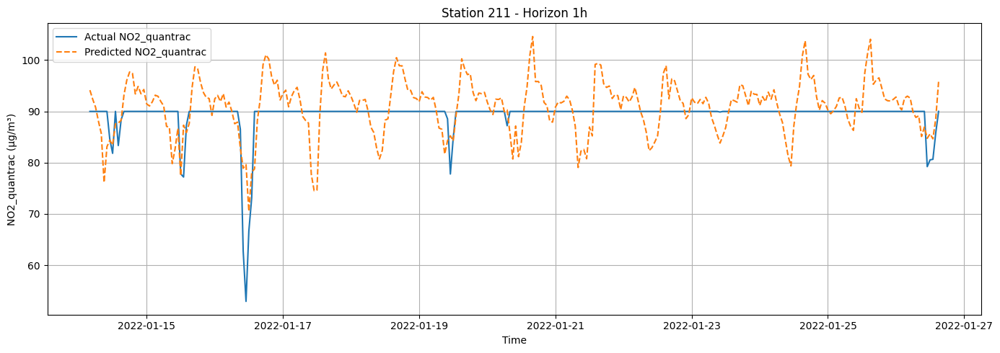

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


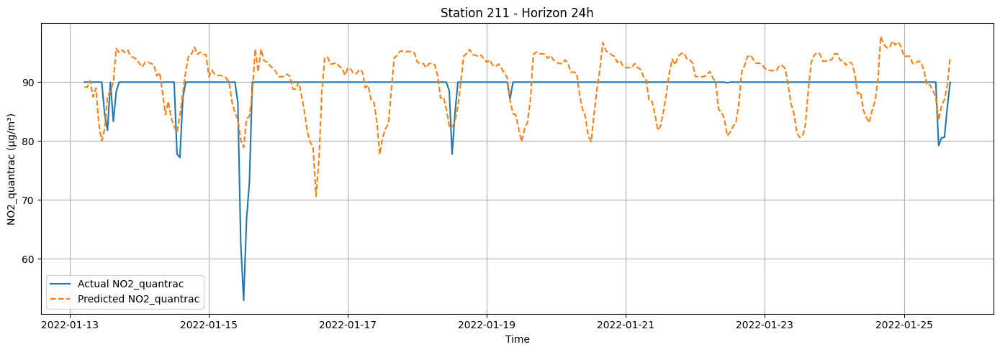

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


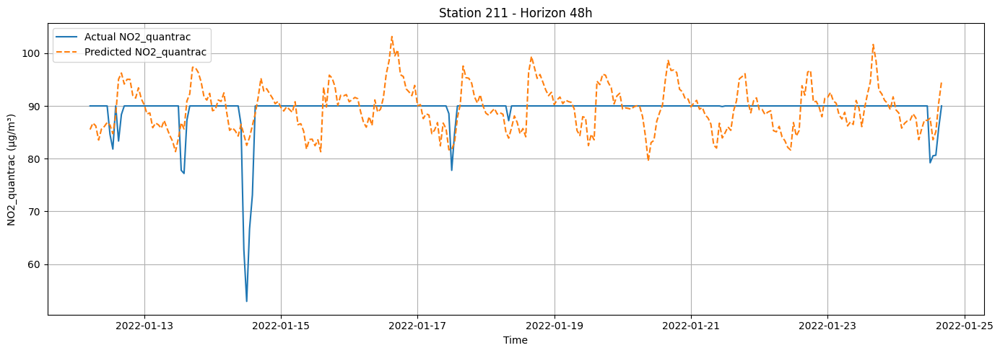

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


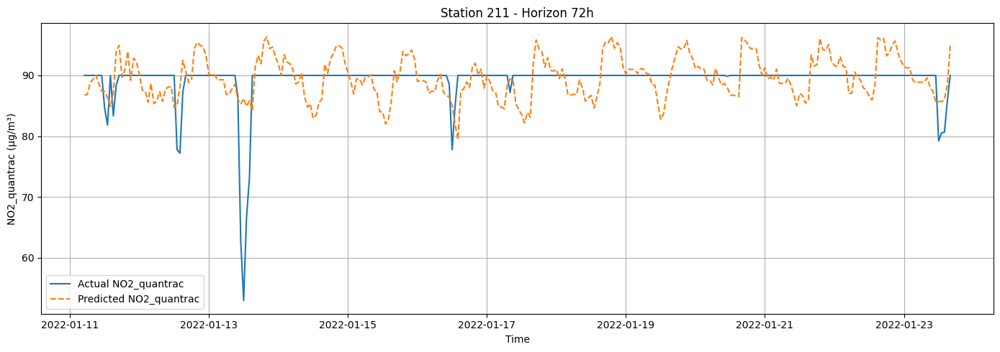

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


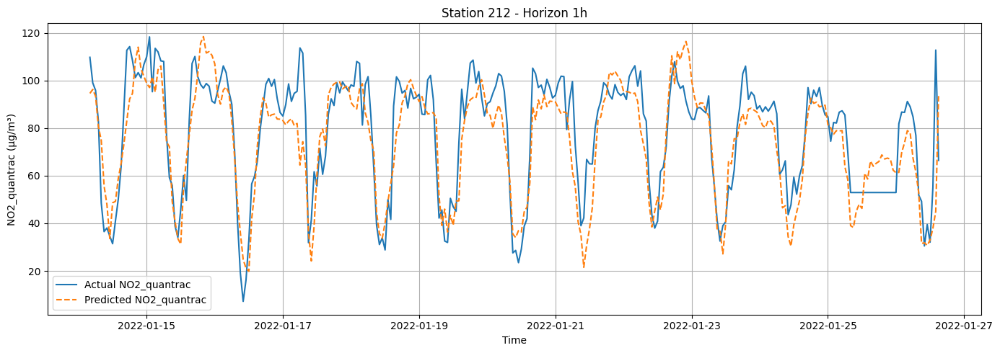

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


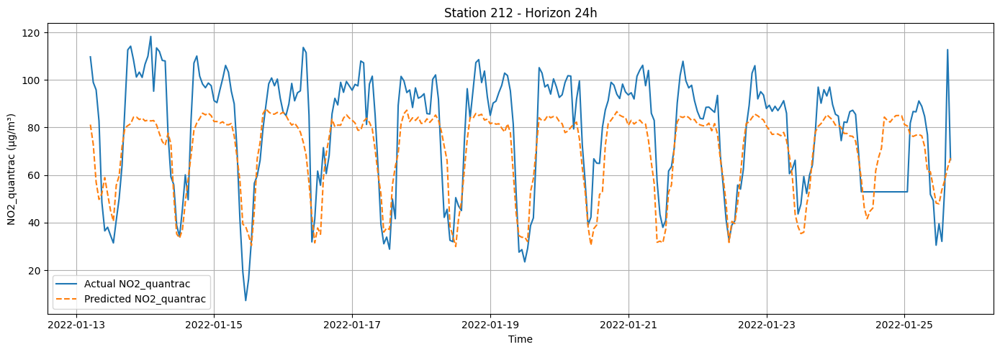

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


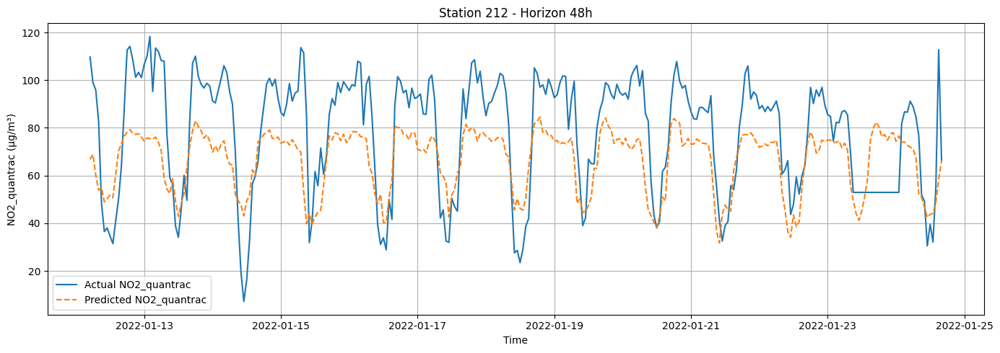

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


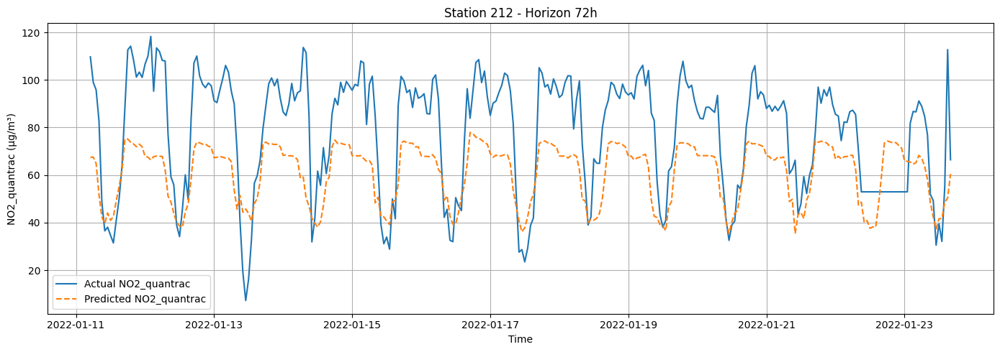

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


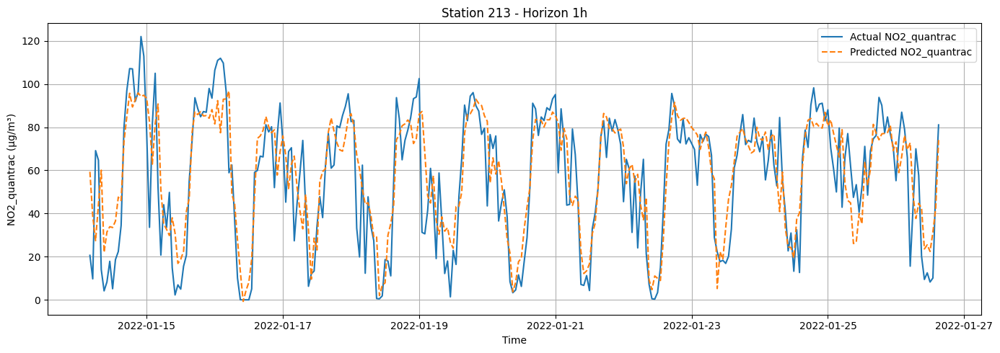

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


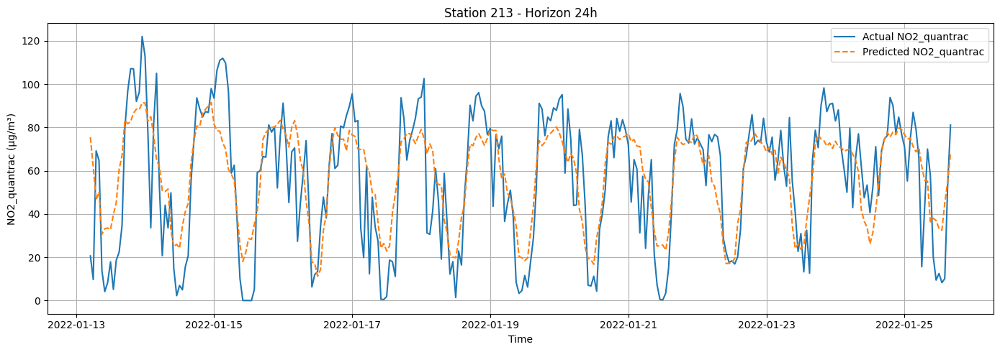

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


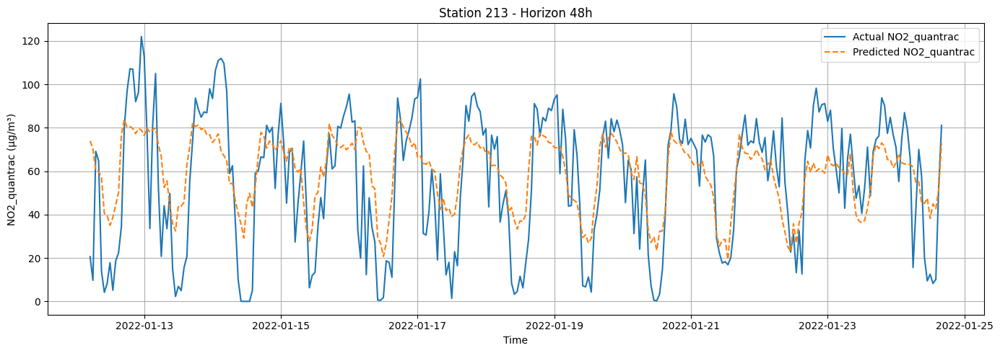

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


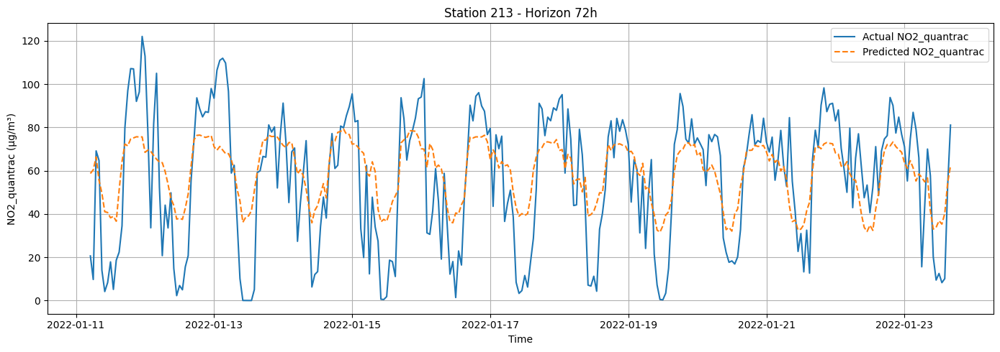

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


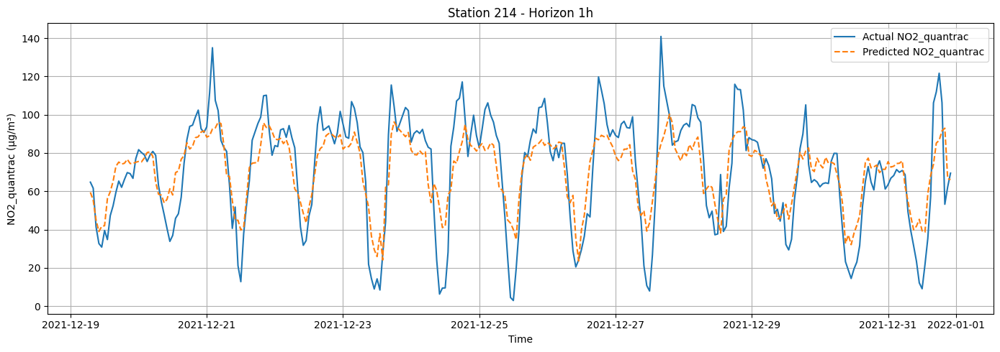

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


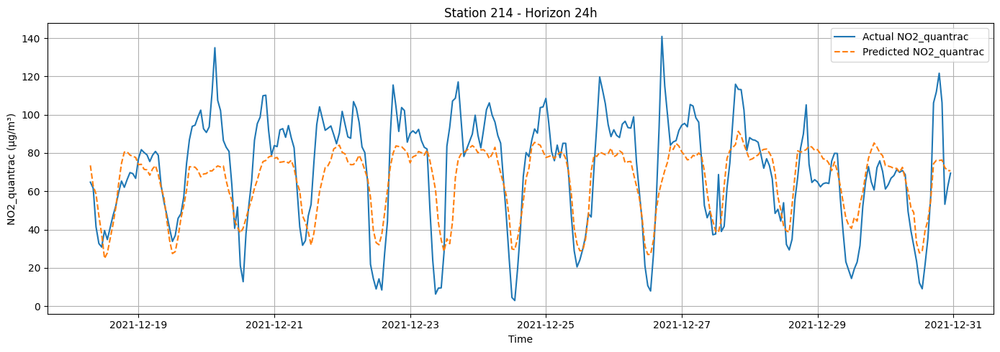

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


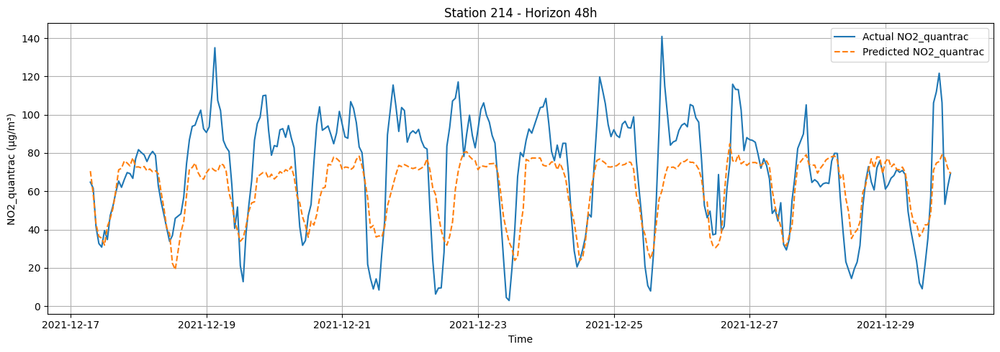

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


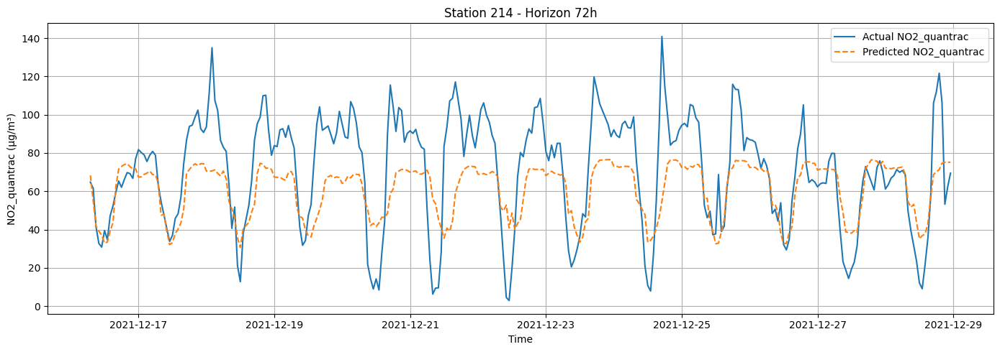

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


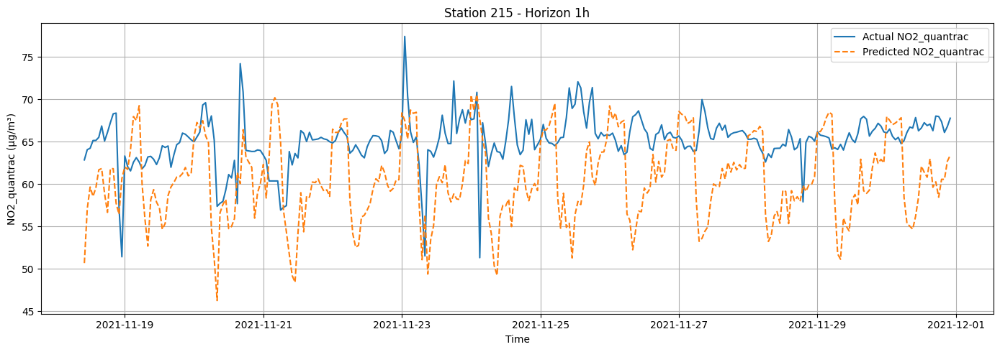

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


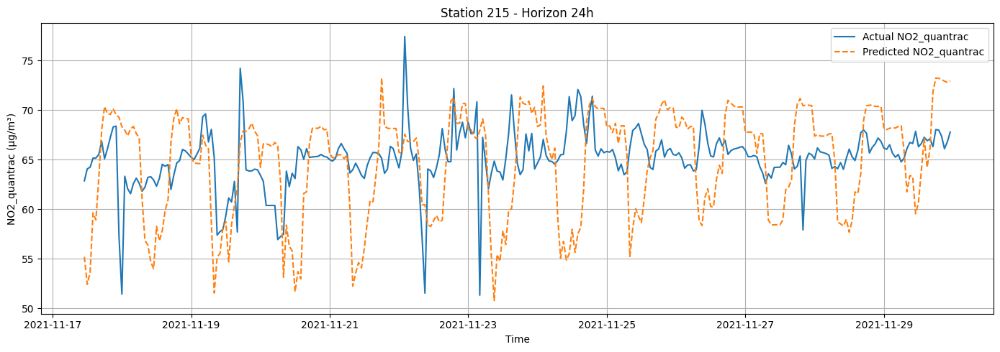

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


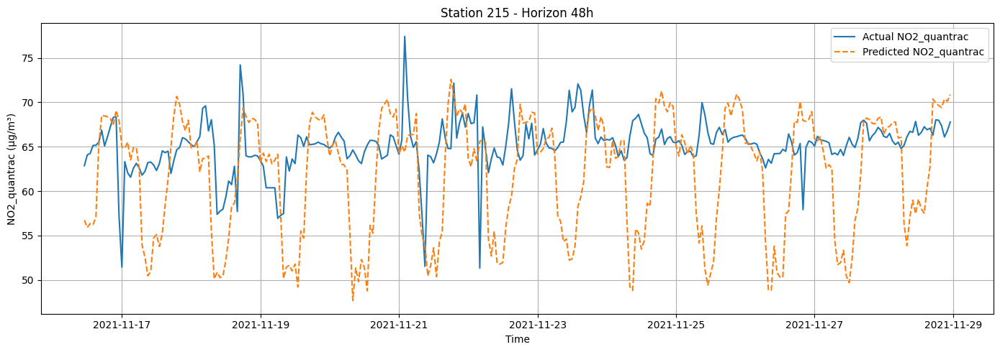

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


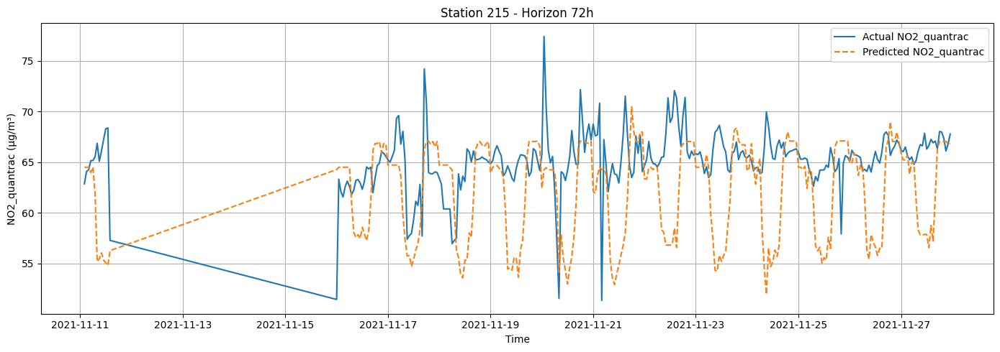

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


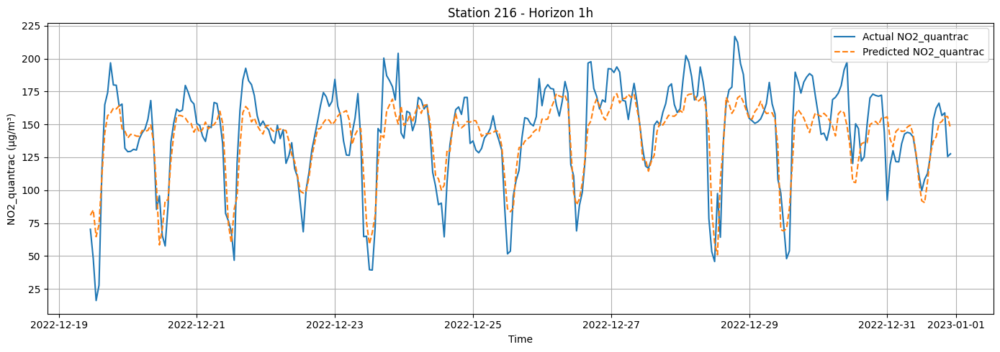

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


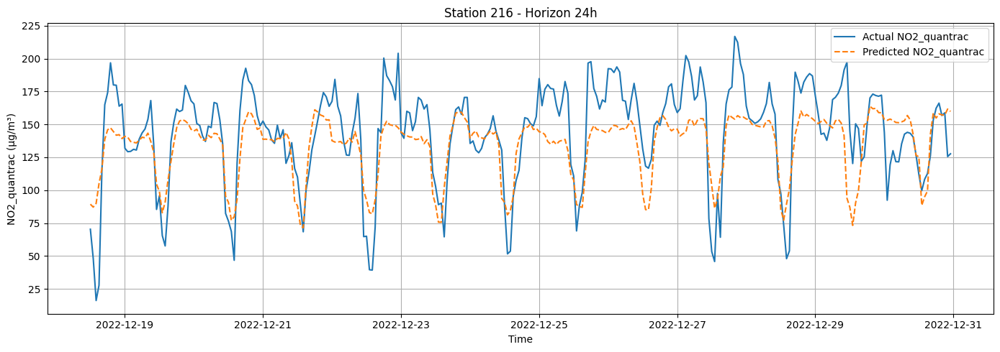

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


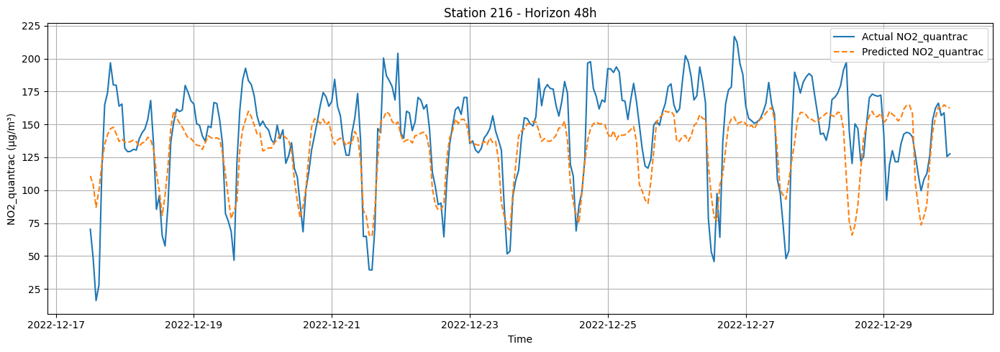

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


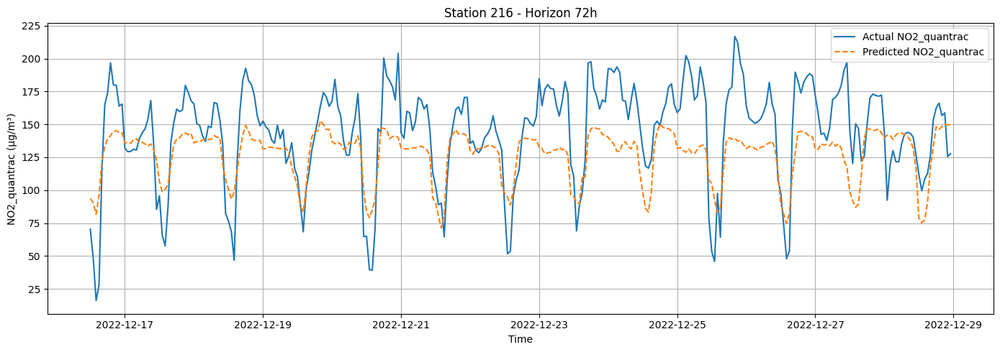

In [16]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in HORIZONS:
        print(f"hour = {hour}")
        plot_timeseries_example(df_no2, no2_models_by_h[hour], horizon_h=hour, station_id=station_id, target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for O3

In [17]:
label = "O3_quantrac"

# Add rolling features for LABEL
df_o3 = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
o3_station_to_embedding, _ = learn_station_embeddings(df_o3, target_col=label, station_col="station_id", embed_dim=4)
df_o3, _ = attach_station_embedding(df_o3, o3_station_to_embedding, station_col="station_id")
print(o3_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as o3_emb_file:
    pickle.dump(o3_station_to_embedding, o3_emb_file)

# Print dataset
display(df_o3)

# Start running model
o3_all_metrics = []
o3_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_o3, horizon_h=h, target_col=label)
    o3_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    o3_all_metrics.append(metrics_by_station)

o3_df_metrics_all = pd.concat(o3_all_metrics, ignore_index=True)
o3_df_metrics_all = o3_df_metrics_all.sort_values(["station", "horizon_h"])
o3_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
o3_df_metrics_all

[Embed] epoch 001 | train MSE=7205.8838 | val MSE=7192.1496
[Embed] epoch 010 | train MSE=4982.4207 | val MSE=4729.6205
[Embed] epoch 020 | train MSE=1154.7580 | val MSE=1087.1925
[Embed] epoch 030 | train MSE=849.5183 | val MSE=845.7694
[Embed] epoch 040 | train MSE=842.5061 | val MSE=841.4683
[Embed] epoch 050 | train MSE=842.2304 | val MSE=841.3656
{211: [6.3102427, -2.830071, -3.242811, -5.710138], 212: [5.6497054, -6.1378117, -4.827483, -6.0162816], 213: [4.3873553, -4.6534095, -4.2588835, -2.8678885], 214: [3.096077, -4.051208, -6.2767863, -3.596666], 215: [5.033126, -5.672511, -4.3594937, -5.4653296], 216: [3.4363449, -4.0281177, -4.587953, -2.7763786]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,O3_quantrac_roll24_mean,O3_quantrac_roll24_std,O3_quantrac_roll48_mean,O3_quantrac_roll48_std,O3_quantrac_roll72_mean,O3_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,55.4313809500,NaN,55.4313809500,NaN,55.4313809500,NaN,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,56.8142787100,1.9557127676,56.8142787100,1.9557127676,56.8142787100,1.9557127676,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,56.2193302500,1.7246150947,56.2193302500,1.7246150947,56.2193302500,1.7246150947,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,55.8564226875,1.5841945626,55.8564226875,1.5841945626,55.8564226875,1.5841945626,6.3102426529,-2.8300709724,-3.2428109646,-5.7101378441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,64.9380388157,15.0927718072,70.0763352689,14.5078761517,75.2320403501,17.3306904910,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,64.6470665934,14.7958230928,69.8784186022,14.3581777465,75.0463922020,17.2494537645,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,64.2442888157,14.6098932113,69.6353630467,14.3202126589,74.3403736835,16.5357222760,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,63.5192888157,14.6124020919,69.2311963800,14.4521933678,73.4371329427,15.7550163747,3.4363448620,-4.0281176567,-4.5879530907,-2.7763786316



===== Training LightGBM for horizon = 1h, target_col = O3_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
O3_quantr

,date,target
0,2022-01-02,65.8253263628
1,2022-01-03,64.1066013632
2,2022-01-04,63.3546871825
3,2022-01-05,63.4765405011
4,2022-01-06,68.2799443737
5,2022-01-07,72.1538949321
6,2022-01-08,63.3488775178
7,2022-01-09,57.5133219784
8,2022-01-10,63.0326053276
9,2022-01-11,57.2614426830


,date,target
0,2022-01-02,65.6068229343
1,2022-01-03,62.1855068715
2,2022-01-04,64.9350819159
3,2022-01-05,64.0433396283
4,2022-01-06,67.2877233176
5,2022-01-07,69.9347592070
6,2022-01-08,66.3205404958
7,2022-01-09,57.7149223557
8,2022-01-10,61.8014493063
9,2022-01-11,59.7381146352


sid = 212, grp =                     date  station_id       y_true          y_pred
8781 2021-11-19 17:00:00         212  177.6187833  136.9470266895
8782 2021-11-19 18:00:00         212  121.8041500  118.8058208453
8783 2021-11-19 19:00:00         212  126.8425167  115.0224140714
8784 2021-11-19 20:00:00         212  125.2394000  115.4513998109
8785 2021-11-19 21:00:00         212  124.4214833  110.6450906443
...                  ...         ...          ...             ...
9643 2022-01-26 11:00:00         212  157.6943333   94.1235322316
9644 2022-01-26 12:00:00         212  153.5393167  111.6466161262
9645 2022-01-26 13:00:00         212   90.0000000  117.8111885880
9646 2022-01-26 14:00:00         212   90.0000000  125.8573094422
9647 2022-01-26 15:00:00         212   90.0000000  125.1953440519

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.

,date,target
0,2021-11-20,123.1921100792
1,2021-11-21,91.9526792167
2,2021-11-23,107.6771365650
3,2021-11-24,108.8908823737
4,2021-11-25,115.8518667772
5,2021-11-26,136.1765371542
6,2021-11-27,137.6372774167
7,2021-11-28,124.0690740708
8,2021-11-29,117.9339469600
9,2021-11-30,119.6860278792


,date,target
0,2021-11-20,113.1205006065
1,2021-11-21,89.2557690150
2,2021-11-23,113.0813283244
3,2021-11-24,116.3621019947
4,2021-11-25,113.4614330743
5,2021-11-26,119.5653374546
6,2021-11-27,127.7387095029
7,2021-11-28,125.3249482138
8,2021-11-29,113.3124601095
9,2021-11-30,109.7903530718


sid = 213, grp =                      date  station_id         y_true          y_pred
14631 2021-12-20 20:00:00         213  156.974566700   96.4097636918
14632 2021-12-20 21:00:00         213  141.761316700   85.8158803542
14633 2021-12-20 22:00:00         213  130.997533300   96.6085206456
14634 2021-12-20 23:00:00         213  129.099966700  103.1104477933
14635 2021-12-21 00:00:00         213  144.629847500  103.0127395281
...                   ...         ...            ...             ...
15506 2022-01-26 11:00:00         213   98.706183330   76.4181593193
15507 2022-01-26 12:00:00         213   91.770250000   81.3928682117
15508 2022-01-26 13:00:00         213   95.074633330   91.3470995623
15509 2022-01-26 14:00:00         213   86.239958374   94.4752950193
15510 2022-01-26 15:00:00         213   90.000000000   96.2858231470

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,91.4311149525
1,2021-12-22,84.0918608962
2,2021-12-23,63.4550147250
3,2021-12-24,78.1384747489
4,2021-12-25,94.9470475775
5,2021-12-26,83.8008535404
6,2021-12-27,94.9922750987
7,2021-12-28,95.8774333104
8,2021-12-29,77.8941320146
9,2021-12-30,64.1645227771


,date,target
0,2021-12-21,92.8203844378
1,2021-12-22,91.9203709331
2,2021-12-23,73.1755225693
3,2021-12-24,72.7624666898
4,2021-12-25,87.0802503704
5,2021-12-26,89.4768752720
6,2021-12-27,88.4595330000
7,2021-12-28,95.4659280501
8,2021-12-29,89.6999287608
9,2021-12-30,74.4109845797


sid = 214, grp =                      date  station_id        y_true          y_pred
20640 2021-11-23 16:00:00         214   90.00000000  102.2224962990
20641 2021-11-23 17:00:00         214   90.00000000  107.6307177873
20642 2021-11-23 18:00:00         214   90.00000000  103.6468127869
20643 2021-11-23 19:00:00         214   90.00000000   89.1540338507
20644 2021-11-23 20:00:00         214  119.67756670  100.8020236241
...                   ...         ...           ...             ...
21541 2021-12-31 18:00:00         214  132.43706670  122.0568727131
21542 2021-12-31 19:00:00         214  107.80141670  116.7893296168
21543 2021-12-31 20:00:00         214   61.21651852  113.9167197286
21544 2021-12-31 21:00:00         214   73.80880000   99.2104946559
21545 2021-12-31 22:00:00         214   82.64230000   86.4937184267

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,93.3443932779
1,2021-11-25,91.6623921200
2,2021-11-26,102.2618008508
3,2021-11-27,101.2890797825
4,2021-11-28,91.3355579367
5,2021-11-29,84.2368115154
6,2021-11-30,81.4905561046
7,2021-12-01,95.4026808217
8,2021-12-02,113.8599750875
9,2021-12-03,112.6866467000


,date,target
0,2021-11-24,90.5917317264
1,2021-11-25,90.1951501236
2,2021-11-26,97.3052026306
3,2021-11-27,99.3569763503
4,2021-11-28,90.2729141922
5,2021-11-29,86.6547561418
6,2021-11-30,80.4138914888
7,2021-12-01,90.7621543523
8,2021-12-02,113.3846245759
9,2021-12-03,119.2951547809


sid = 215, grp =                      date  station_id  y_true         y_pred
24155 2021-11-07 08:00:00         215    90.0  92.0663350661
24156 2021-11-07 09:00:00         215    90.0  91.5112372504
24157 2021-11-07 10:00:00         215    90.0  95.1047354029
24158 2021-11-07 11:00:00         215    90.0  94.9028795079
24159 2021-11-07 12:00:00         215    90.0  93.9463341126
...                   ...         ...     ...            ...
24611 2021-11-30 18:00:00         215    90.0  84.3461950070
24612 2021-11-30 19:00:00         215    90.0  86.9735132249
24613 2021-11-30 20:00:00         215    90.0  87.9992945703
24614 2021-11-30 21:00:00         215    90.0  90.8188030567
24615 2021-11-30 22:00:00         215    90.0  91.6677864419

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2021, 11, 17), datetime.date(

,date,target
0,2021-11-07,90.0
1,2021-11-08,90.0
2,2021-11-09,90.0
3,2021-11-10,90.0
4,2021-11-11,90.0
5,2021-11-16,90.0
6,2021-11-17,90.0
7,2021-11-18,90.0
8,2021-11-19,90.0
9,2021-11-20,90.0


,date,target
0,2021-11-07,91.6996784581
1,2021-11-08,88.0854772410
2,2021-11-09,94.8737214810
3,2021-11-10,88.8608141497
4,2021-11-11,93.8933030052
5,2021-11-16,91.1472908589
6,2021-11-17,92.8756481059
7,2021-11-18,92.2079486858
8,2021-11-19,93.8643036756
9,2021-11-20,92.3196514395


sid = 216, grp =                      date  station_id         y_true         y_pred
36208 2022-09-20 19:00:00         216  60.8833333333  54.3161978801
36209 2022-09-20 20:00:00         216  71.8166666667  55.4775474225
36210 2022-09-20 21:00:00         216  57.4333333333  54.6206349835
36211 2022-09-20 22:00:00         216  45.9000000000  53.7715254128
36212 2022-09-20 23:00:00         216  40.3461538462  49.7725030362
...                   ...         ...            ...            ...
38249 2022-12-31 18:00:00         216  75.9166666667  81.4789253695
38250 2022-12-31 19:00:00         216  66.1166666667  81.3534517301
38251 2022-12-31 20:00:00         216  55.1333333333  79.0239741015
38252 2022-12-31 21:00:00         216  46.7500000000  71.6206540140
38253 2022-12-31 22:00:00         216  50.0166666667  64.1494270248

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(2022, 9, 23), datetime.date(202

,date,target
0,2022-09-21,46.4844863732
1,2022-09-22,44.4186975891
2,2022-09-23,46.1901836158
3,2022-09-24,44.8116193061
4,2022-09-25,48.7034016008
...,...,...
82,2022-12-27,75.4105341479
83,2022-12-28,78.1382022913
84,2022-12-29,80.2899782904
85,2022-12-30,72.2750483888


,date,target
0,2022-09-21,47.1251472278
1,2022-09-22,46.2602511504
2,2022-09-23,47.5902482148
3,2022-09-24,46.4762855732
4,2022-09-25,47.6321280146
...,...,...
82,2022-12-27,78.1911597560
83,2022-12-28,77.4828384658
84,2022-12-29,83.4034469999
85,2022-12-30,79.0361528286


Overall test metrics: {'rmse': 18.79, 'mae': 12.91, 'mape': 21.71, 'mnbe': -9.86, 'r': 0.82, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = O3_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3


,date,target
0,2022-01-02,63.9786230323
1,2022-01-03,63.1137688130
2,2022-01-04,63.4686794529
3,2022-01-05,67.9858535225
4,2022-01-06,72.5380178614
5,2022-01-07,63.8443269909
6,2022-01-08,57.1622116777
7,2022-01-09,63.0906289113
8,2022-01-10,57.4374054710
9,2022-01-11,54.3523164387


,date,target
0,2022-01-02,56.4434122849
1,2022-01-03,63.5878232562
2,2022-01-04,66.8740800673
3,2022-01-05,66.0766854812
4,2022-01-06,68.0383234981
5,2022-01-07,70.6087223403
6,2022-01-08,67.5113581518
7,2022-01-09,63.7699566729
8,2022-01-10,66.3284738754
9,2022-01-11,64.7306447000


sid = 212, grp =                     date  station_id       y_true          y_pred
8738 2021-11-18 21:00:00         212  125.2394000  109.8926952454
8739 2021-11-18 22:00:00         212  124.4214833  104.9831148076
8740 2021-11-18 23:00:00         212  122.7856500  108.1113489667
8741 2021-11-19 00:00:00         212  120.4627667   98.9149553373
8742 2021-11-19 01:00:00         212  115.1062586   96.4730948780
...                  ...         ...          ...             ...
9597 2022-01-25 12:00:00         212  157.6943333  112.1071551008
9598 2022-01-25 13:00:00         212  153.5393167  106.2320488347
9599 2022-01-25 14:00:00         212   90.0000000  109.6081932639
9600 2022-01-25 15:00:00         212   90.0000000  113.2700420544
9601 2022-01-25 16:00:00         212   90.0000000  118.7212469943

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.

,date,target
0,2021-11-19,123.7673781375
1,2021-11-20,91.7454736583
2,2021-11-21,108.1419858721
3,2021-11-23,108.6632289000
4,2021-11-24,115.2207077522
5,2021-11-25,135.8657288208
6,2021-11-26,137.9330906083
7,2021-11-27,124.9660560167
8,2021-11-28,117.9925643212
9,2021-11-29,118.8394841304


,date,target
0,2021-11-19,102.5458173842
1,2021-11-20,104.1143990321
2,2021-11-21,104.5534487631
3,2021-11-23,107.3280600135
4,2021-11-24,102.3525047294
5,2021-11-25,106.1165805831
6,2021-11-26,110.5384442788
7,2021-11-27,119.8518031844
8,2021-11-28,110.9093718868
9,2021-11-29,112.8935173099


sid = 213, grp =                      date  station_id         y_true          y_pred
14566 2021-12-20 01:00:00         213  144.629847500   82.5115596062
14567 2021-12-20 02:00:00         213   40.324677970   87.5501329144
14568 2021-12-20 03:00:00         213   50.808983330   78.6683088595
14569 2021-12-20 04:00:00         213   38.605666670   77.5750914352
14570 2021-12-20 05:00:00         213   66.643850000   80.5064854773
...                   ...         ...            ...             ...
15437 2022-01-25 12:00:00         213   98.706183330   76.1296985124
15438 2022-01-25 13:00:00         213   91.770250000   82.8908184296
15439 2022-01-25 14:00:00         213   95.074633330   91.0869996904
15440 2022-01-25 15:00:00         213   86.239958374  100.4503371982
15441 2022-01-25 16:00:00         213   90.000000000  104.2491585123

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-20,91.6766808200
1,2021-12-21,84.8743345075
2,2021-12-22,64.3656286138
3,2021-12-23,76.2128137177
4,2021-12-24,96.3391904745
5,2021-12-25,84.0898507629
6,2021-12-26,94.6767191917
7,2021-12-27,95.8774333104
8,2021-12-28,78.6706123922
9,2021-12-29,64.8106769438


,date,target
0,2021-12-20,85.3741022866
1,2021-12-21,88.5026734640
2,2021-12-22,92.5216642771
3,2021-12-23,84.0922074848
4,2021-12-24,76.7902105400
5,2021-12-25,78.6710909758
6,2021-12-26,90.4445473485
7,2021-12-27,95.5102736863
8,2021-12-28,98.9166198755
9,2021-12-29,99.9811029496


sid = 214, grp =                      date  station_id        y_true         y_pred
20552 2021-11-22 21:00:00         214  119.67756670  88.3134397460
20553 2021-11-22 22:00:00         214   96.03884906  82.9249328321
20554 2021-11-22 23:00:00         214   79.39633929  82.8976348199
20555 2021-11-23 00:00:00         214   71.91123333  82.3174554446
20556 2021-11-23 01:00:00         214   78.09468333  80.9224910912
...                   ...         ...           ...            ...
21449 2021-12-30 19:00:00         214  132.43706670  99.9811762002
21450 2021-12-30 20:00:00         214  107.80141670  90.3546793994
21451 2021-12-30 21:00:00         214   61.21651852  79.7761991835
21452 2021-12-30 22:00:00         214   73.80880000  79.5675245495
21453 2021-12-30 23:00:00         214   82.64230000  79.0239078883

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26

,date,target
0,2021-11-23,92.4992127221
1,2021-11-24,91.8123435092
2,2021-11-25,102.1691036283
3,2021-11-26,101.3504235325
4,2021-11-27,92.0730461312
5,2021-11-28,84.5258087375
6,2021-11-29,80.8866609658
7,2021-11-30,94.8464974883
8,2021-12-01,113.6614730042
9,2021-12-02,112.5797932279


,date,target
0,2021-11-23,85.5260409609
1,2021-11-24,89.5285219133
2,2021-11-25,87.0772749362
3,2021-11-26,95.3089282845
4,2021-11-27,99.9752585330
5,2021-11-28,95.6873511606
6,2021-11-29,94.9989374210
7,2021-11-30,86.8333552274
8,2021-12-01,87.2504827019
9,2021-12-02,100.2841406893


sid = 215, grp =                      date  station_id  y_true         y_pred
24043 2021-11-06 12:00:00         215    90.0  87.4274429358
24044 2021-11-06 13:00:00         215    90.0  86.8311133777
24045 2021-11-06 14:00:00         215    90.0  87.0770513882
24046 2021-11-06 15:00:00         215    90.0  88.3041402070
24047 2021-11-06 16:00:00         215    90.0  87.8138902145
...                   ...         ...     ...            ...
24496 2021-11-29 19:00:00         215    90.0  89.0428701887
24497 2021-11-29 20:00:00         215    90.0  86.8877662826
24498 2021-11-29 21:00:00         215    90.0  86.7133778988
24499 2021-11-29 22:00:00         215    90.0  87.7994728531
24500 2021-11-29 23:00:00         215    90.0  88.2588876927

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetime.date(2

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,86.9004321109
1,2021-11-07,87.3083147047
2,2021-11-08,88.7120243790
3,2021-11-09,91.9985378622
4,2021-11-10,90.2984655865
5,2021-11-11,91.3758836868
6,2021-11-16,91.0487057635
7,2021-11-17,91.7868063492
8,2021-11-18,91.6088596228
9,2021-11-19,90.2792951202


sid = 216, grp =                      date  station_id         y_true         y_pred
36073 2022-09-19 23:00:00         216  45.9000000000  51.9912832800
36074 2022-09-20 00:00:00         216  40.3461538462  47.7570994957
36075 2022-09-20 01:00:00         216  39.0943396226  45.4819662341
36076 2022-09-20 02:00:00         216  39.0833333333  46.0956807792
36077 2022-09-20 03:00:00         216  39.6166666667  45.6282315480
...                   ...         ...            ...            ...
38111 2022-12-30 19:00:00         216  75.9166666667  85.9535387432
38112 2022-12-30 20:00:00         216  66.1166666667  83.5137108736
38113 2022-12-30 21:00:00         216  55.1333333333  87.4530068067
38114 2022-12-30 22:00:00         216  46.7500000000  82.7769398801
38115 2022-12-30 23:00:00         216  50.0166666667  79.3490475572

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-20,46.1065483390
1,2022-09-21,44.8909198113
2,2022-09-22,45.9874058380
3,2022-09-23,44.9275915283
4,2022-09-24,48.4547904896
...,...,...
82,2022-12-26,74.8619230368
83,2022-12-27,77.9263967357
84,2022-12-28,80.4344227349
85,2022-12-29,73.5132428332


,date,target
0,2022-09-20,51.1405794861
1,2022-09-21,51.7237275106
2,2022-09-22,50.0130847301
3,2022-09-23,49.3353141518
4,2022-09-24,49.6950071146
...,...,...
82,2022-12-26,74.4675063006
83,2022-12-27,75.1626935924
84,2022-12-28,76.8186267291
85,2022-12-29,84.4247195871


Overall test metrics: {'rmse': 22.13, 'mae': 15.98, 'mape': 27.79, 'mnbe': -13.96, 'r': 0.75, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = O3_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3

,date,target
0,2022-01-01,63.9786230323
1,2022-01-02,63.1137688130
2,2022-01-03,63.4686794529
3,2022-01-04,67.9858535225
4,2022-01-05,72.5380178614
5,2022-01-06,63.8443269909
6,2022-01-07,57.1622116777
7,2022-01-08,63.0906289113
8,2022-01-09,57.4374054710
9,2022-01-10,54.3523164387


,date,target
0,2022-01-01,58.2284534560
1,2022-01-02,60.5552576675
2,2022-01-03,64.0088596849
3,2022-01-04,65.9387458547
4,2022-01-05,68.2007166345
5,2022-01-06,68.5063268300
6,2022-01-07,69.2947693587
7,2022-01-08,70.7945053248
8,2022-01-09,70.3066679984
9,2022-01-10,65.2756934278


sid = 212, grp =                     date  station_id        y_true          y_pred
8694 2021-11-18 01:00:00         212  115.10625860  101.9781162588
8695 2021-11-18 02:00:00         212  113.62498330  103.3627958518
8696 2021-11-18 03:00:00         212  104.92235000  102.5707978942
8697 2021-11-18 04:00:00         212   93.60238333   96.3957235365
8698 2021-11-18 05:00:00         212   82.67501667  102.8028968838
...                  ...         ...           ...             ...
9549 2022-01-24 12:00:00         212  157.69433330  104.4666785426
9550 2022-01-24 13:00:00         212  153.53931670  104.3961973901
9551 2022-01-24 14:00:00         212   90.00000000  123.8014891937
9552 2022-01-24 15:00:00         212   90.00000000  120.9827959446
9553 2022-01-24 16:00:00         212   90.00000000  127.7635304469

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22

,date,target
0,2021-11-18,123.9110568957
1,2021-11-19,91.7454736583
2,2021-11-20,108.1419858721
3,2021-11-21,103.9138594583
4,2021-11-23,115.2207077522
5,2021-11-24,135.8657288208
6,2021-11-25,137.9330906083
7,2021-11-26,124.9660560167
8,2021-11-27,117.9925643212
9,2021-11-28,118.8394841304


,date,target
0,2021-11-18,103.7975757049
1,2021-11-19,101.4893805640
2,2021-11-20,109.9288934436
3,2021-11-21,105.1583481242
4,2021-11-23,106.1506836712
5,2021-11-24,103.2747322419
6,2021-11-25,104.7525065565
7,2021-11-26,103.5513350255
8,2021-11-27,111.9529742614
9,2021-11-28,114.7202618302


sid = 213, grp =                      date  station_id         y_true          y_pred
14497 2021-12-19 04:00:00         213   38.605666670   78.1050195783
14498 2021-12-19 05:00:00         213   66.643850000   76.8285678868
14499 2021-12-19 06:00:00         213   51.692333330   71.5642962916
14500 2021-12-19 07:00:00         213   77.309483330   67.8914456034
14501 2021-12-19 08:00:00         213  124.977666700   68.8661268385
...                   ...         ...            ...             ...
15365 2022-01-24 12:00:00         213   98.706183330   92.6643104007
15366 2022-01-24 13:00:00         213   91.770250000   93.1107241086
15367 2022-01-24 14:00:00         213   95.074633330   95.8620143952
15368 2022-01-24 15:00:00         213   86.239958374   92.9021117552
15369 2022-01-24 16:00:00         213   90.000000000  102.8147271933

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), da

,date,target
0,2021-12-19,93.6400075030
1,2021-12-20,84.8743345075
2,2021-12-21,64.3656286138
3,2021-12-22,76.2128137177
4,2021-12-23,95.2783731425
5,2021-12-24,84.1335296968
6,2021-12-25,94.6767191917
7,2021-12-26,95.7281348887
8,2021-12-27,77.2680390070
9,2021-12-28,65.0183114487


,date,target
0,2021-12-19,83.1751395969
1,2021-12-20,82.2342735959
2,2021-12-21,88.1846406815
3,2021-12-22,92.9974911522
4,2021-12-23,79.8333096025
5,2021-12-24,75.3673732788
6,2021-12-25,82.4116193260
7,2021-12-26,93.8521211181
8,2021-12-27,91.9917632838
9,2021-12-28,100.6659578007


sid = 214, grp =                      date  station_id        y_true          y_pred
20459 2021-11-22 00:00:00         214   71.91123333   87.9941118538
20460 2021-11-22 01:00:00         214   78.09468333   89.9682772373
20461 2021-11-22 02:00:00         214   87.51708333   92.2354645244
20462 2021-11-22 03:00:00         214   88.41512245   89.1676993138
20463 2021-11-22 04:00:00         214   81.58094915   89.2114426526
...                   ...         ...           ...             ...
21353 2021-12-29 19:00:00         214  132.43706670  106.7933971350
21354 2021-12-29 20:00:00         214  107.80141670   98.8341665701
21355 2021-12-29 21:00:00         214   61.21651852   89.7573045673
21356 2021-12-29 22:00:00         214   73.80880000   87.0788701173
21357 2021-12-29 23:00:00         214   82.64230000   83.5087558884

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(

,date,target
0,2021-11-22,92.4992127221
1,2021-11-23,91.8123435092
2,2021-11-24,102.1691036283
3,2021-11-25,101.3504235325
4,2021-11-26,92.0730461312
5,2021-11-27,84.5258087375
6,2021-11-28,80.8866609658
7,2021-11-29,94.8464974883
8,2021-11-30,113.6614730042
9,2021-12-01,112.5797932279


,date,target
0,2021-11-22,86.8361488215
1,2021-11-23,83.9636693697
2,2021-11-24,89.8691608284
3,2021-11-25,86.5125849897
4,2021-11-26,88.3182788360
5,2021-11-27,88.2651909489
6,2021-11-28,91.7307969491
7,2021-11-29,94.1246054103
8,2021-11-30,89.0387886543
9,2021-12-01,87.0272900997


sid = 215, grp =                      date  station_id  y_true         y_pred
23927 2021-11-05 16:00:00         215    90.0  92.1639419527
23928 2021-11-05 17:00:00         215    90.0  93.1147524437
23929 2021-11-05 18:00:00         215    90.0  93.6010708612
23930 2021-11-05 19:00:00         215    90.0  94.6611704593
23931 2021-11-05 20:00:00         215    90.0  92.7485327358
...                   ...         ...     ...            ...
24376 2021-11-28 19:00:00         215    90.0  93.1539827758
24377 2021-11-28 20:00:00         215    90.0  93.3297834132
24378 2021-11-28 21:00:00         215    90.0  90.9761982813
24379 2021-11-28 22:00:00         215    90.0  89.1057877441
24380 2021-11-28 23:00:00         215    90.0  90.9031278688

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(20

,date,target
0,2021-11-06,90.0
1,2021-11-07,90.0
2,2021-11-08,90.0
3,2021-11-09,90.0
4,2021-11-10,90.0
5,2021-11-11,90.0
6,2021-11-16,90.0
7,2021-11-17,90.0
8,2021-11-18,90.0
9,2021-11-19,90.0


,date,target
0,2021-11-06,90.6176616877
1,2021-11-07,92.4924344809
2,2021-11-08,94.5964019984
3,2021-11-09,95.5250350055
4,2021-11-10,94.2826281210
5,2021-11-11,93.9159269167
6,2021-11-16,93.4638610078
7,2021-11-17,95.8122042576
8,2021-11-18,91.5536530172
9,2021-11-19,89.9210221260


sid = 216, grp =                      date  station_id         y_true         y_pred
35933 2022-09-19 03:00:00         216  39.6166666667  46.7001594819
35934 2022-09-19 04:00:00         216  39.5000000000  46.5674712147
35935 2022-09-19 05:00:00         216  38.9000000000  46.7047036338
35936 2022-09-19 06:00:00         216  38.8500000000  49.6219686748
35937 2022-09-19 07:00:00         216  39.6666666667  49.1729578320
...                   ...         ...            ...            ...
37967 2022-12-29 19:00:00         216  75.9166666667  95.2474566473
37968 2022-12-29 20:00:00         216  66.1166666667  92.7785357092
37969 2022-12-29 21:00:00         216  55.1333333333  89.8046195390
37970 2022-12-29 22:00:00         216  46.7500000000  83.9692093717
37971 2022-12-29 23:00:00         216  50.0166666667  84.8419265674

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22), datetime.date(202

,date,target
0,2022-09-19,47.0492063492
1,2022-09-20,44.8909198113
2,2022-09-21,45.9874058380
3,2022-09-22,44.9275915283
4,2022-09-23,48.4547904896
...,...,...
82,2022-12-25,74.8619230368
83,2022-12-26,77.9263967357
84,2022-12-27,80.4344227349
85,2022-12-28,73.5132428332


,date,target
0,2022-09-19,52.7273213465
1,2022-09-20,51.8789318995
2,2022-09-21,52.5882581352
3,2022-09-22,50.9204404980
4,2022-09-23,49.9088420529
...,...,...
82,2022-12-25,65.9351994858
83,2022-12-26,71.6677347570
84,2022-12-27,77.9976300832
85,2022-12-28,82.7167937210


Overall test metrics: {'rmse': 22.7, 'mae': 16.49, 'mape': 29.3, 'mnbe': -14.34, 'r': 0.73, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = O3_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
CO_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
H

,date,target
0,2021-11-30,63.9786230323
1,2022-01-01,63.1137688130
2,2022-01-02,63.4686794529
3,2022-01-03,67.9858535225
4,2022-01-04,72.5380178614
5,2022-01-05,63.8443269909
6,2022-01-06,57.1622116777
7,2022-01-07,63.0906289113
8,2022-01-08,57.4374054710
9,2022-01-09,54.3523164387


,date,target
0,2021-11-30,64.4496419787
1,2022-01-01,59.1148728879
2,2022-01-02,60.3851134906
3,2022-01-03,62.8718812774
4,2022-01-04,64.8281599408
5,2022-01-05,65.5829903881
6,2022-01-06,66.2627015305
7,2022-01-07,70.3731868498
8,2022-01-08,69.8503024309
9,2022-01-09,66.5133209627


sid = 212, grp =                     date  station_id        y_true          y_pred
8649 2021-11-17 04:00:00         212   93.60238333   95.6191340872
8650 2021-11-17 05:00:00         212   82.67501667   95.8265395324
8651 2021-11-17 06:00:00         212   94.58388333   97.3315374984
8652 2021-11-17 07:00:00         212  101.65068330   94.4997528704
8653 2021-11-17 08:00:00         212  136.91925000   83.8339126578
...                  ...         ...           ...             ...
9501 2022-01-23 12:00:00         212  157.69433330   97.4614408677
9502 2022-01-23 13:00:00         212  153.53931670   94.4965535921
9503 2022-01-23 14:00:00         212   90.00000000  111.0500757990
9504 2022-01-23 15:00:00         212   90.00000000  119.0831602536
9505 2022-01-23 16:00:00         212   90.00000000  113.4537194757

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21

,date,target
0,2021-11-17,125.8150358350
1,2021-11-18,91.7454736583
2,2021-11-19,108.1419858721
3,2021-11-20,103.9138594583
4,2021-11-21,118.3478758064
5,2021-11-23,135.8657288208
6,2021-11-24,137.9330906083
7,2021-11-25,124.9660560167
8,2021-11-26,117.9925643212
9,2021-11-27,118.8394841304


,date,target
0,2021-11-17,98.6362615603
1,2021-11-18,99.2800524687
2,2021-11-19,99.4103872690
3,2021-11-20,104.9941833218
4,2021-11-21,99.0980451293
5,2021-11-23,104.6818370533
6,2021-11-24,102.3966130603
7,2021-11-25,101.6329892833
8,2021-11-26,100.9214681678
9,2021-11-27,104.1918967433


sid = 213, grp =                      date  station_id         y_true         y_pred
14429 2021-12-18 08:00:00         213  124.977666700  74.5858080831
14430 2021-12-18 09:00:00         213   95.401800000  68.0023066857
14431 2021-12-18 10:00:00         213   68.181533330  62.6574095477
14432 2021-12-18 11:00:00         213   82.413283330  59.5103191889
14433 2021-12-18 12:00:00         213   77.636650000  63.1845552595
...                   ...         ...            ...            ...
15293 2022-01-23 12:00:00         213   98.706183330  75.2988355014
15294 2022-01-23 13:00:00         213   91.770250000  72.2698361285
15295 2022-01-23 14:00:00         213   95.074633330  74.6864764263
15296 2022-01-23 15:00:00         213   86.239958374  84.5194117548
15297 2022-01-23 16:00:00         213   90.000000000  86.3263653584

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,102.4093010456
1,2021-12-19,84.8743345075
2,2021-12-20,64.3656286138
3,2021-12-21,76.2128137177
4,2021-12-22,95.2783731425
5,2021-12-23,84.7948302350
6,2021-12-24,94.9137721950
7,2021-12-25,95.7281348887
8,2021-12-26,76.2832520708
9,2021-12-27,64.6224084396


,date,target
0,2021-12-18,75.8798797963
1,2021-12-19,82.5883921473
2,2021-12-20,80.9522413279
3,2021-12-21,86.2577966164
4,2021-12-22,86.1671990232
5,2021-12-23,78.9132057781
6,2021-12-24,76.5602705399
7,2021-12-25,83.4976189146
8,2021-12-26,88.5387449514
9,2021-12-27,91.9893222014


sid = 214, grp =                      date  station_id        y_true          y_pred
20367 2021-11-21 04:00:00         214   81.58094915   80.9668727250
20368 2021-11-21 05:00:00         214   69.91551667   78.8661106874
20369 2021-11-21 06:00:00         214   72.46741667   77.3930036224
20370 2021-11-21 07:00:00         214   95.82711667   83.2045209586
20371 2021-11-21 08:00:00         214  119.87386670   83.3217820813
...                   ...         ...           ...             ...
21257 2021-12-28 19:00:00         214  132.43706670  106.1493203681
21258 2021-12-28 20:00:00         214  107.80141670  109.5881240002
21259 2021-12-28 21:00:00         214   61.21651852  105.9176184287
21260 2021-12-28 22:00:00         214   73.80880000  101.2595500996
21261 2021-12-28 23:00:00         214   82.64230000   97.3821176630

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,94.7021491445
1,2021-11-22,91.8123435092
2,2021-11-23,102.1691036283
3,2021-11-24,101.3504235325
4,2021-11-25,92.0730461312
5,2021-11-26,84.5258087375
6,2021-11-27,80.8866609658
7,2021-11-28,94.8464974883
8,2021-11-29,113.6614730042
9,2021-11-30,112.5797932279


,date,target
0,2021-11-21,85.3654471947
1,2021-11-22,81.8871328578
2,2021-11-23,82.8818718287
3,2021-11-24,81.2191396133
4,2021-11-25,77.9799362007
5,2021-11-26,81.4748742949
6,2021-11-27,85.0372985084
7,2021-11-28,90.0591091037
8,2021-11-29,87.9881686945
9,2021-11-30,85.2329384956


sid = 215, grp =                      date  station_id  y_true         y_pred
23811 2021-11-04 20:00:00         215    90.0  93.8342466473
23812 2021-11-04 21:00:00         215    90.0  93.5959054440
23813 2021-11-04 22:00:00         215    90.0  92.8096054692
23814 2021-11-04 23:00:00         215    90.0  92.8096054692
23815 2021-11-05 00:00:00         215    90.0  92.6717920449
...                   ...         ...     ...            ...
24256 2021-11-27 19:00:00         215    90.0  93.7080269738
24257 2021-11-27 20:00:00         215    90.0  94.3254512483
24258 2021-11-27 21:00:00         215    90.0  93.9649182084
24259 2021-11-27 22:00:00         215    90.0  92.9647107676
24260 2021-11-27 23:00:00         215    90.0  92.9647107676

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(202

,date,target
0,2021-11-05,90.0
1,2021-11-06,90.0
2,2021-11-07,90.0
3,2021-11-08,90.0
4,2021-11-09,90.0
5,2021-11-10,90.0
6,2021-11-11,90.0
7,2021-11-16,90.0
8,2021-11-17,90.0
9,2021-11-18,90.0


,date,target
0,2021-11-05,91.5765208147
1,2021-11-06,92.2752408595
2,2021-11-07,91.7458998010
3,2021-11-08,92.2375280080
4,2021-11-09,93.1855369861
5,2021-11-10,91.5086118432
6,2021-11-11,91.8708471271
7,2021-11-16,92.9513210408
8,2021-11-17,92.5648268522
9,2021-11-18,90.9107920686


sid = 216, grp =                      date  station_id         y_true         y_pred
35792 2022-09-18 06:00:00         216  38.8500000000  55.4428342671
35793 2022-09-18 07:00:00         216  39.6666666667  55.5518653958
35794 2022-09-18 08:00:00         216  44.6666666667  56.2982618196
35795 2022-09-18 09:00:00         216  41.7500000000  56.0336198725
35796 2022-09-18 10:00:00         216  43.1000000000  56.2012510493
...                   ...         ...            ...            ...
37823 2022-12-28 19:00:00         216  75.9166666667  88.9123392359
37824 2022-12-28 20:00:00         216  66.1166666667  84.7573055871
37825 2022-12-28 21:00:00         216  55.1333333333  83.8417349943
37826 2022-12-28 22:00:00         216  46.7500000000  85.4831099896
37827 2022-12-28 23:00:00         216  50.0166666667  79.8037246855

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(202

,date,target
0,2022-09-18,48.3342592593
1,2022-09-19,44.8909198113
2,2022-09-20,45.9874058380
3,2022-09-21,44.9275915283
4,2022-09-22,48.4547904896
...,...,...
82,2022-12-24,74.8619230368
83,2022-12-25,77.9263967357
84,2022-12-26,80.4344227349
85,2022-12-27,73.5132428332


,date,target
0,2022-09-18,58.4254943715
1,2022-09-19,58.4522179830
2,2022-09-20,59.0132084219
3,2022-09-21,58.7260477975
4,2022-09-22,56.9862848455
...,...,...
82,2022-12-24,65.4464863341
83,2022-12-25,63.2611091496
84,2022-12-26,71.5879136824
85,2022-12-27,81.5202559798


Overall test metrics: {'rmse': 23.72, 'mae': 17.61, 'mape': 31.87, 'mnbe': -16.45, 'r': 0.71, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,13.43,11.29,20.62,-6.00,0.77,581,0.52
6,211,24,14.06,12.26,24.79,-12.72,0.79,577,-4.38
12,211,48,14.58,12.64,26.57,-15.76,0.80,574,-6.50
18,211,72,16.09,14.18,28.72,-15.07,0.73,570,-4.76
1,212,1,27.19,20.50,17.83,-0.66,0.35,867,3.27
7,212,24,29.30,23.59,19.79,3.61,0.22,864,7.52
13,212,48,29.69,23.93,19.96,4.25,0.20,860,8.11
19,212,72,31.07,24.85,20.14,7.63,0.19,857,11.57
2,213,1,26.94,21.30,60.47,-39.35,0.64,880,1.18
8,213,24,30.26,24.68,74.54,-54.26,0.49,876,-4.12


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


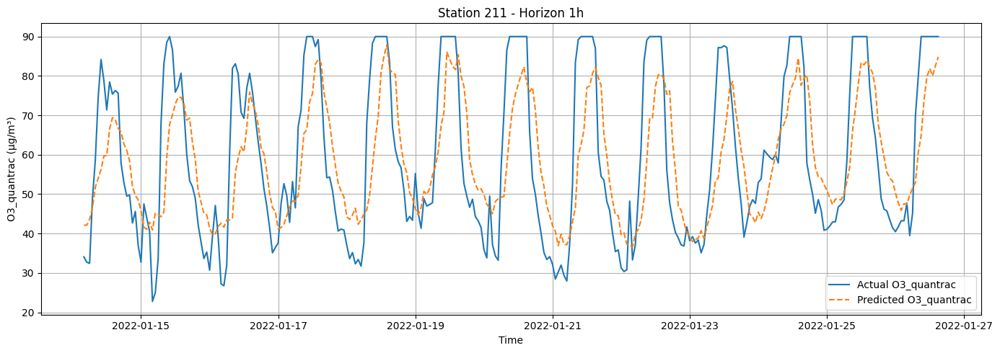

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


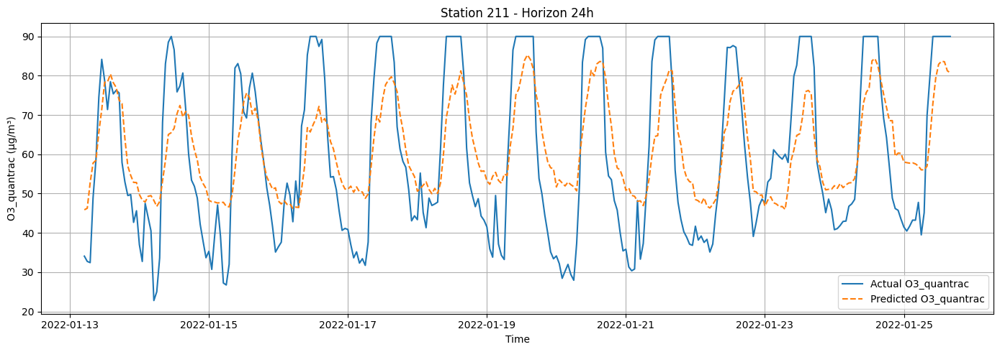

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


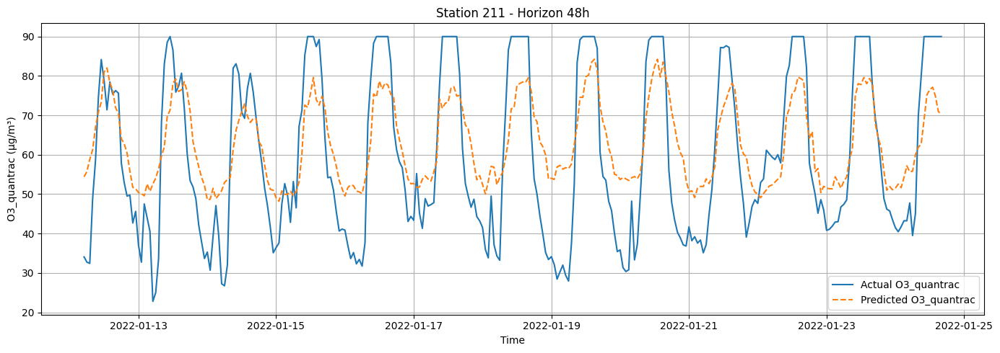

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


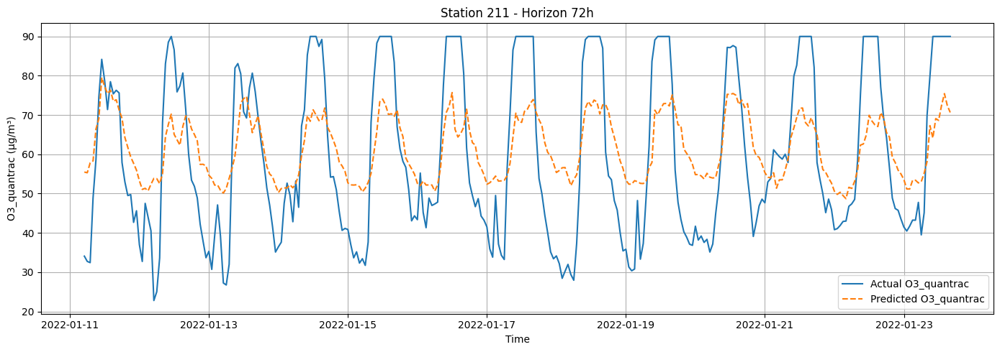

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


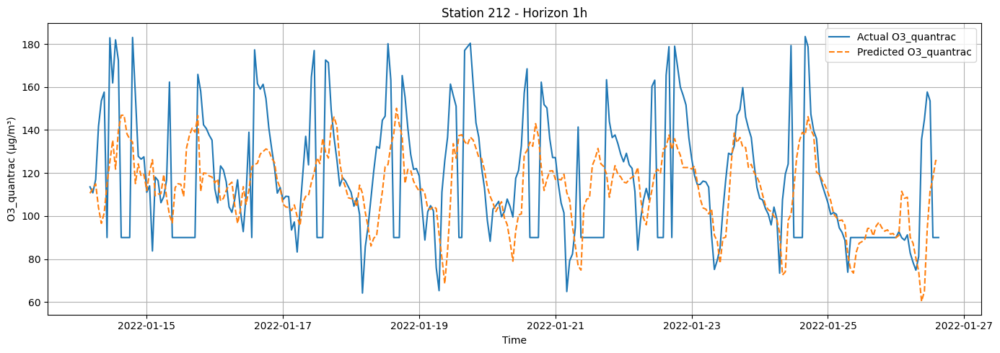

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


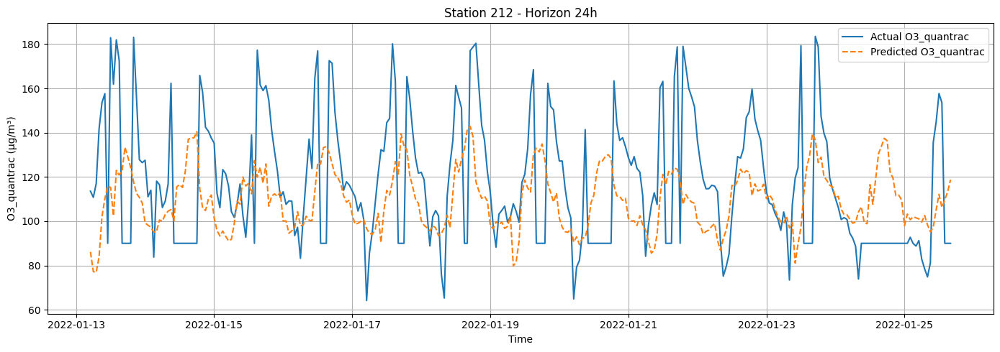

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


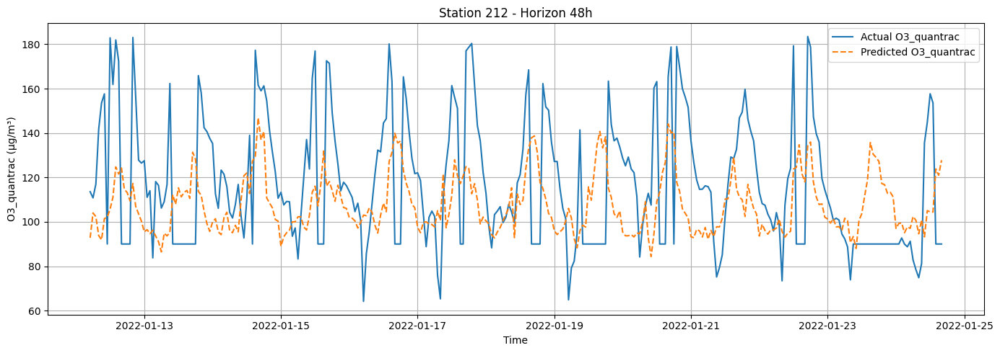

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


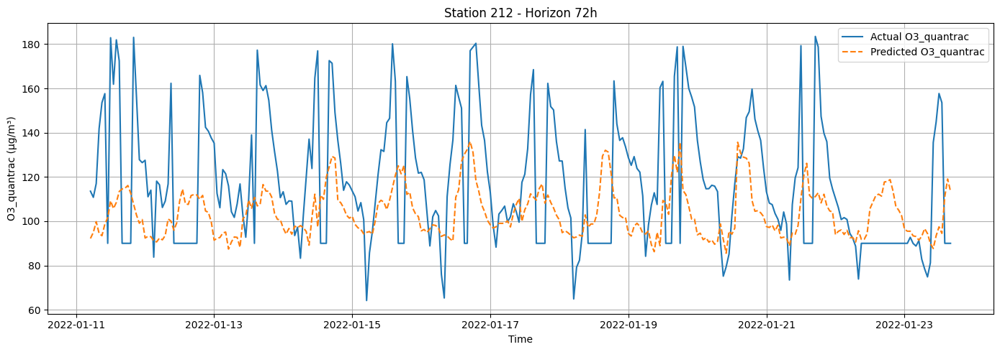

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


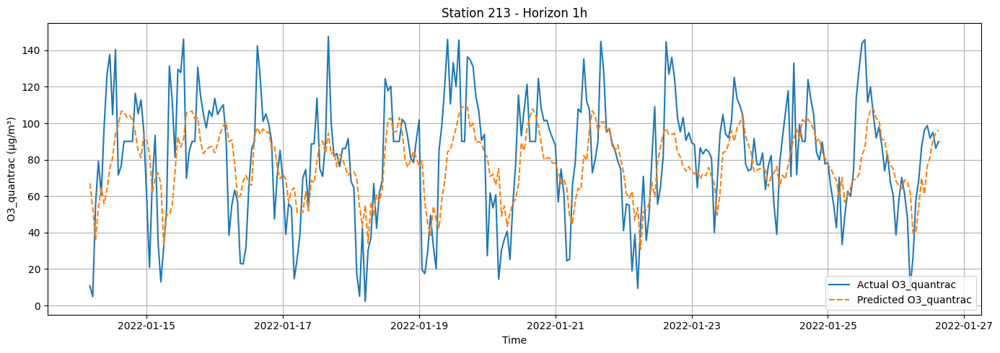

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


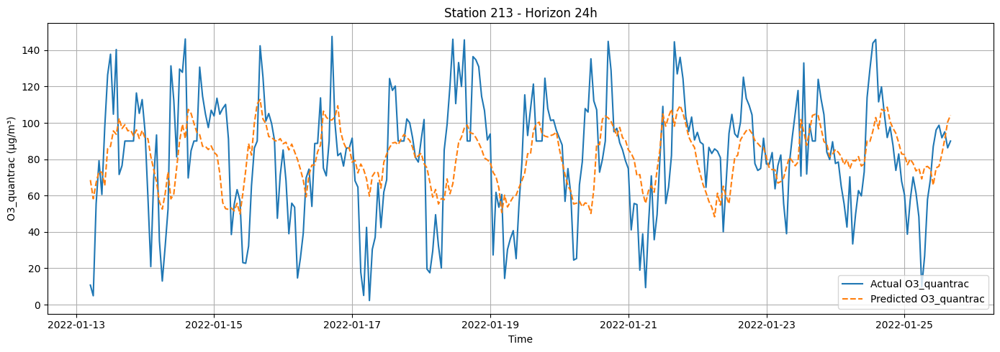

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


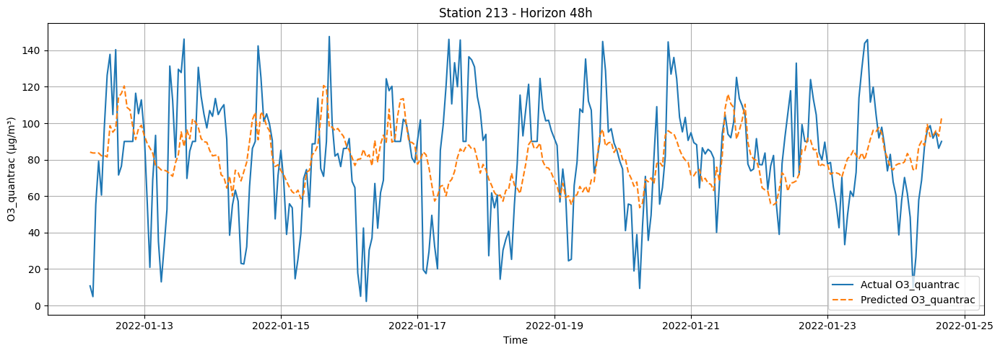

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


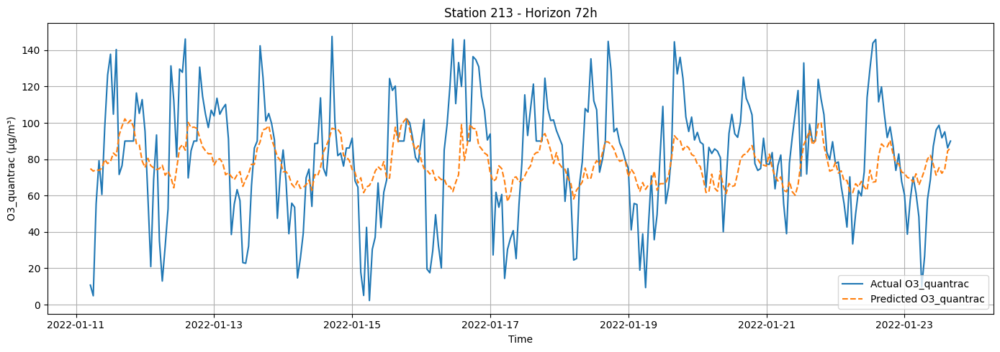

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


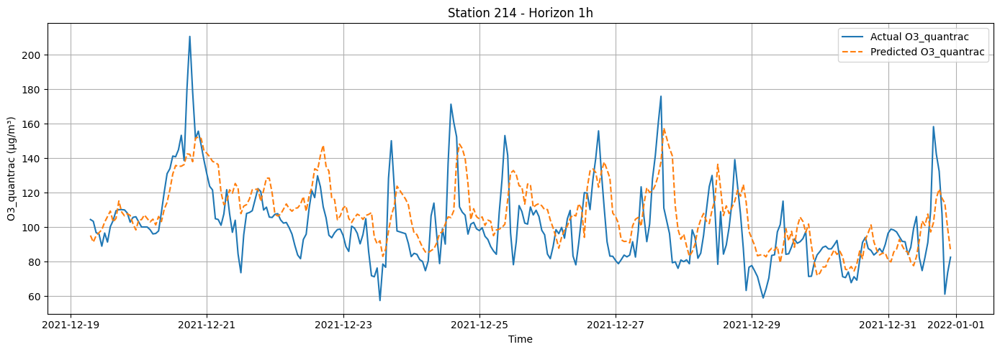

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


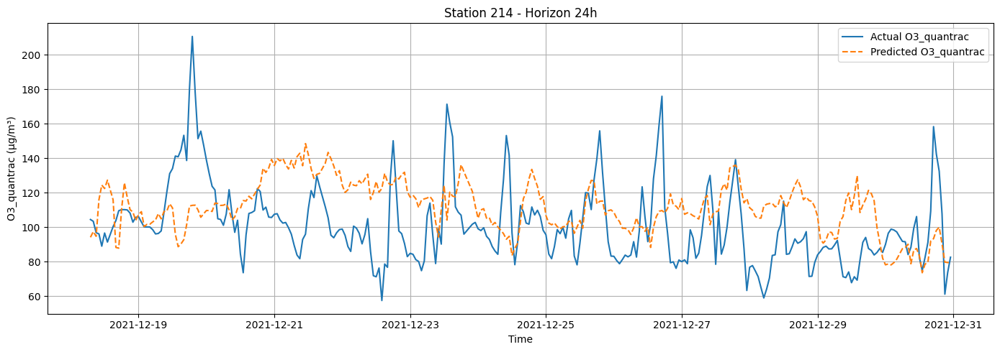

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


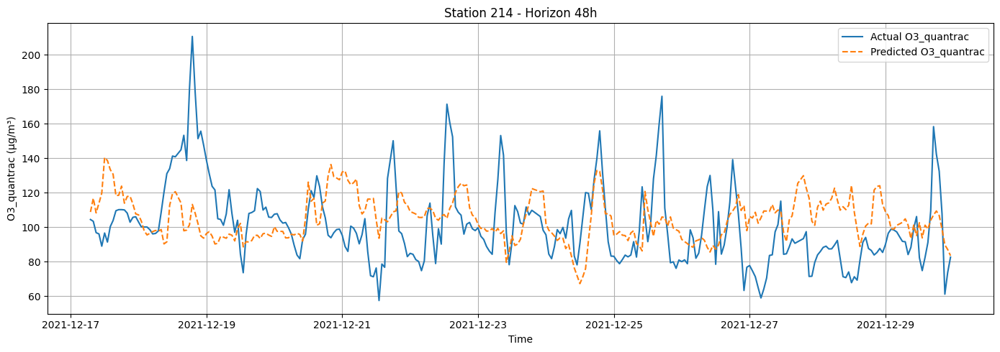

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


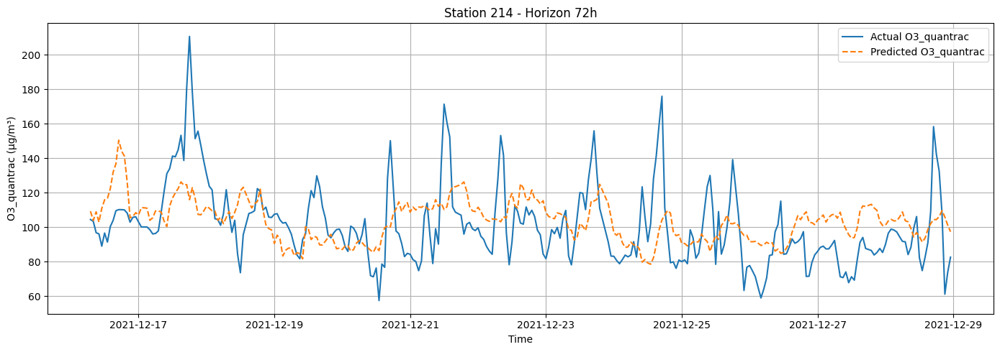

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


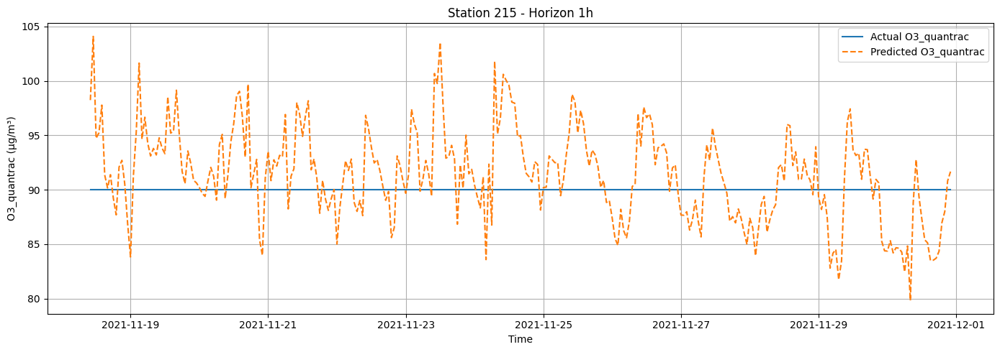

hour = 24
X_test_sid.shape: (458, 60)
y_test_sid.shape: (458, 1)
y_pred_sid.shape: (458,)


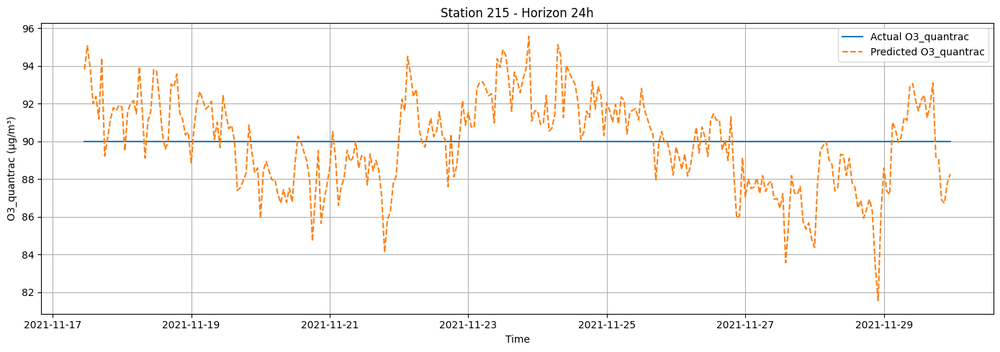

hour = 48
X_test_sid.shape: (454, 60)
y_test_sid.shape: (454, 1)
y_pred_sid.shape: (454,)


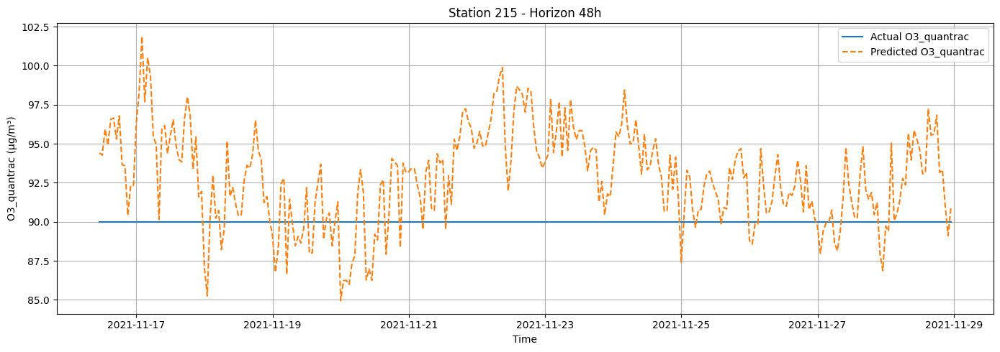

hour = 72
X_test_sid.shape: (450, 60)
y_test_sid.shape: (450, 1)
y_pred_sid.shape: (450,)


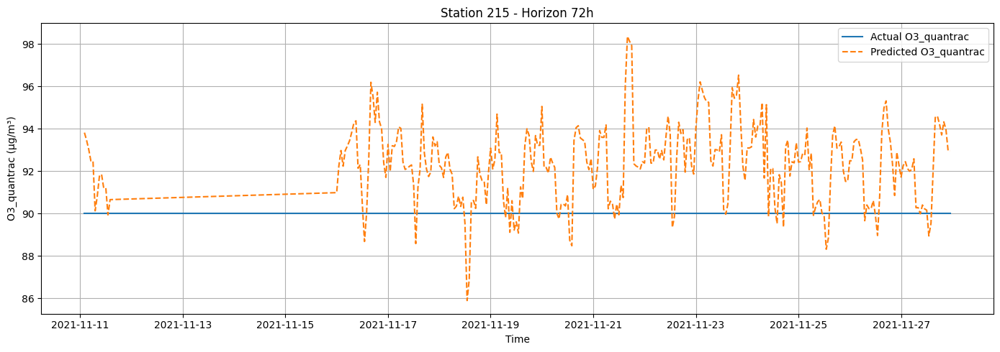

station_id = 216
hour = 1
X_test_sid.shape: (2046, 60)
y_test_sid.shape: (2046, 1)
y_pred_sid.shape: (2046,)


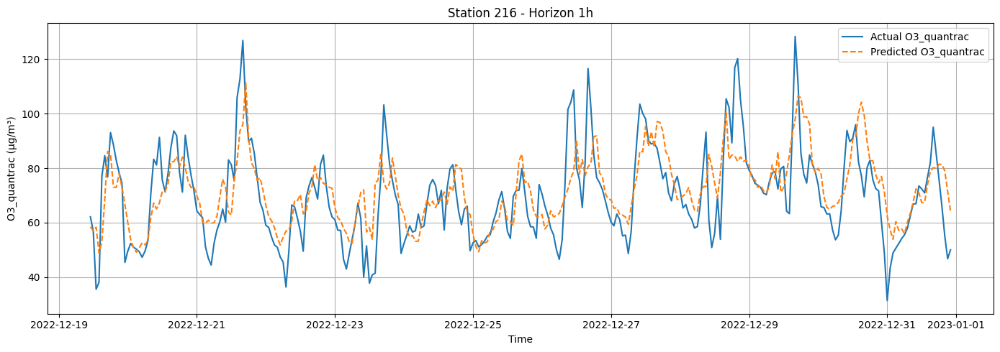

hour = 24
X_test_sid.shape: (2043, 60)
y_test_sid.shape: (2043, 1)
y_pred_sid.shape: (2043,)


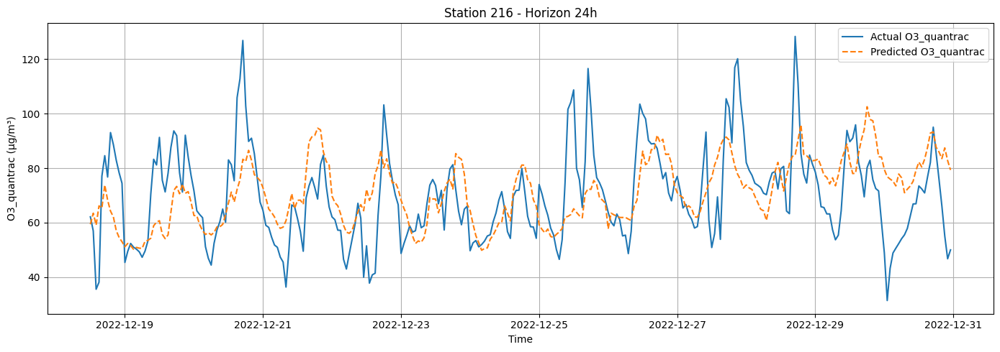

hour = 48
X_test_sid.shape: (2039, 60)
y_test_sid.shape: (2039, 1)
y_pred_sid.shape: (2039,)


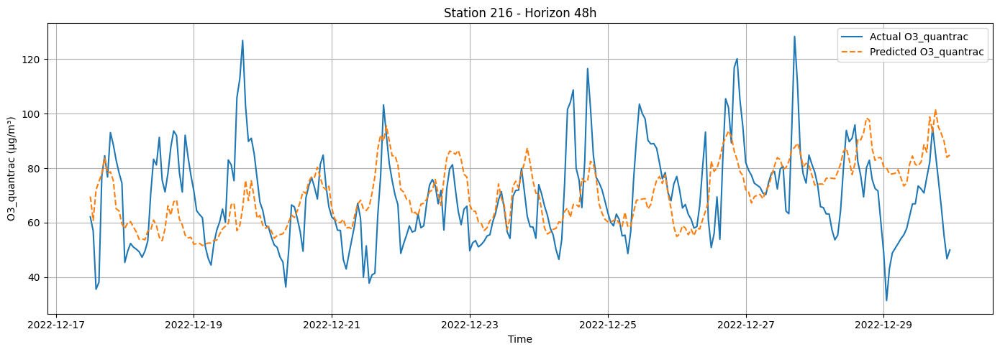

hour = 72
X_test_sid.shape: (2036, 60)
y_test_sid.shape: (2036, 1)
y_pred_sid.shape: (2036,)


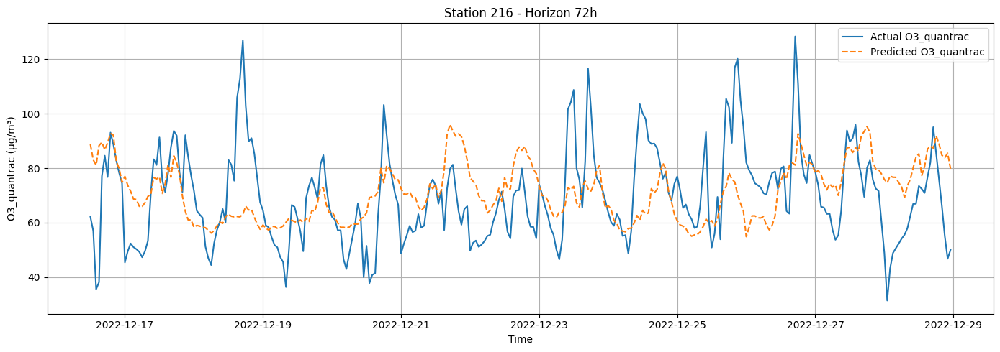

In [18]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_o3, o3_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)

## Training for CO

In [19]:
label = "CO_quantrac"

# Add rolling features for LABEL
df_co = add_rolling_features(df_lag_feats, group_col="station_id", target_cols=[label], windows=ROLL_WINDOWS)

# Station embedding
co_station_to_embedding, _ = learn_station_embeddings(df_co, target_col=label, station_col="station_id", embed_dim=4)
df_co, _ = attach_station_embedding(df_co, co_station_to_embedding, station_col="station_id")
print(co_station_to_embedding)
with open(os.path.join(LIGHTGBM_DIR, f"{label}_station_embedding.pkl"), 'wb') as co_emb_file:
    pickle.dump(co_station_to_embedding, co_emb_file)

# Print dataset
display(df_co)

# Start running model
co_all_metrics = []
co_models_by_h = {}
for h in HORIZONS:
    print(f"\n===== Training LightGBM for horizon = {h}h, target_col = {label} =====")
    model_h, metrics_overall, metrics_by_station, _ = train_lgbm_for_horizon(df_co, horizon_h=h, target_col=label)
    co_models_by_h[h] = model_h
    model_h.save_model(os.path.join(LIGHTGBM_DIR, f"{label}_lightgbm_{h}h"))
    print("Overall test metrics:", metrics_overall)
    co_all_metrics.append(metrics_by_station)

co_df_metrics_all = pd.concat(co_all_metrics, ignore_index=True)
co_df_metrics_all = co_df_metrics_all.sort_values(["station", "horizon_h"])
co_df_metrics_all.to_csv(os.path.join(LIGHTGBM_DIR, f"{label}_metrics.csv"), index=False)
co_df_metrics_all

[Embed] epoch 001 | train MSE=1166936.2412 | val MSE=1140335.4564
[Embed] epoch 010 | train MSE=1133271.6681 | val MSE=1102984.0626
[Embed] epoch 020 | train MSE=1012663.1579 | val MSE=979906.9911
[Embed] epoch 030 | train MSE=839978.6087 | val MSE=808127.9540
[Embed] epoch 040 | train MSE=657308.5678 | val MSE=629350.8762
[Embed] epoch 050 | train MSE=502019.6377 | val MSE=479894.8422
{211: [-9.1424675, -9.570723, -10.159096, 8.830111], 212: [-1.9979348, -4.0776124, -2.5172603, 1.1684203], 213: [-10.647095, -11.673682, -11.487389, 11.10486], 214: [-12.096144, -10.875263, -13.295887, 10.625471], 215: [-11.388142, -11.457361, -10.267969, 10.315793], 216: [-12.22883, -11.686434, -12.453338, 11.830644]}


,date,NO2_quantrac,PM25_quantrac,O3_quantrac,CO_quantrac,Temperature_quantrac,Humid_quantrac,station_id,hour,dayofweek,...,CO_quantrac_roll24_mean,CO_quantrac_roll24_std,CO_quantrac_roll48_mean,CO_quantrac_roll48_std,CO_quantrac_roll72_mean,CO_quantrac_roll72_std,station_emb_0,station_emb_1,station_emb_2,station_emb_3
0,2021-02-23 21:00:00,112.7407619000,15.6047619000,55.4313809500,90.0000000000,28.3619047600,63.1880952400,211,21,1,...,NaN,NaN,NaN,NaN,NaN,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
1,2021-02-23 22:00:00,112.3664706000,14.5941176500,58.1971764700,1200.6035290000,28.3205882400,63.7735294100,211,22,1,...,90.0000000000,NaN,90.0000000000,NaN,90.0000000000,NaN,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
2,2021-02-23 23:00:00,112.7004333000,13.4366666700,55.0294333300,1177.8970000000,28.3366666700,64.2050000000,211,23,1,...,645.3017645000,785.3152865656,645.3017645000,785.3152865656,645.3017645000,785.3152865656,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
3,2021-02-24 00:00:00,112.4808667000,12.3650000000,54.7677000000,90.0000000000,28.3050000000,64.7350000000,211,0,2,...,822.8335096667,634.7539769726,822.8335096667,634.7539769726,822.8335096667,634.7539769726,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
4,2021-02-24 01:00:00,114.3315000000,11.6366666700,53.7862000000,90.0000000000,28.3000000000,65.1883333300,211,1,2,...,639.6251322500,634.7201318253,639.6251322500,634.7201318253,639.6251322500,634.7201318253,-9.1424674988,-9.5707225800,-10.1590957642,8.8301105499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38687,2022-12-31 19:00:00,166.1610133333,41.4500000000,75.9166666667,2393.5627333333,27.6900000000,67.2900000000,216,19,5,...,1472.2937525476,516.9231499153,1674.4435738753,871.0825423549,1638.9403672351,846.4231143401,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38688,2022-12-31 20:00:00,156.7136266667,50.5300000000,66.1166666667,2301.0542000000,27.4016666667,68.0266666667,216,20,5,...,1485.6014108809,536.8199439348,1683.6060280420,876.3799781822,1637.2015848277,844.7171508487,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38689,2022-12-31 21:00:00,158.7537600000,55.0550000000,55.1333333333,2773.9180666667,27.6033333333,66.9650000000,216,21,5,...,1491.7654608809,545.5955779660,1679.6041738753,873.0368958297,1634.0107200129,841.7227222007,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539
38690,2022-12-31 22:00:00,125.5152800000,26.0783333333,46.7500000000,1698.9842000000,27.0366666667,63.3616666667,216,22,5,...,1526.4720886587,599.2656943825,1683.4985155420,877.5756900124,1644.8973561240,851.4061847858,-12.2288303375,-11.6864337921,-12.4533376694,11.8306436539



===== Training LightGBM for horizon = 1h, target_col = CO_quantrac =====

X.shape = (38254, 62)
y.shape = (38254, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_lag3
Humid_quantrac_lag6
Humid_quantrac_lag12
Humid_quantrac_lag24
Humid_quantrac_lag48
Humid_quantrac_lag72
CO_quantr

,date,target
0,2022-01-02,727.0914538462
1,2022-01-03,756.2255041667
2,2022-01-04,753.0859416667
3,2022-01-05,749.9758250000
4,2022-01-06,767.3655791667
5,2022-01-07,756.1483083333
6,2022-01-08,759.4446500000
7,2022-01-09,727.0470708333
8,2022-01-10,735.6006875000
9,2022-01-11,731.8793708333


,date,target
0,2022-01-02,703.8438577582
1,2022-01-03,742.1727947189
2,2022-01-04,739.0871538283
3,2022-01-05,743.9532425859
4,2022-01-06,736.9611133478
5,2022-01-07,750.6618799867
6,2022-01-08,723.5338634635
7,2022-01-09,701.1270818102
8,2022-01-10,723.1138934821
9,2022-01-11,722.3303596783


sid = 212, grp =                     date  station_id  y_true          y_pred
8781 2021-11-19 17:00:00         212    90.0   97.6622996704
8782 2021-11-19 18:00:00         212    90.0   79.7888584529
8783 2021-11-19 19:00:00         212    90.0   81.7515488869
8784 2021-11-19 20:00:00         212    90.0   80.5286950260
8785 2021-11-19 21:00:00         212    90.0  105.2047744010
...                  ...         ...     ...             ...
9643 2022-01-26 11:00:00         212     0.0   57.7558739022
9644 2022-01-26 12:00:00         212     0.0   44.9787168455
9645 2022-01-26 13:00:00         212    90.0   40.3337291196
9646 2022-01-26 14:00:00         212    90.0   78.3796146828
9647 2022-01-26 15:00:00         212    90.0   79.8045735942

[867 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.da

,date,target
0,2021-11-20,82.5000000000
1,2021-11-21,90.0000000000
2,2021-11-23,82.5000000000
3,2021-11-24,75.0000000000
4,2021-11-25,82.5000000000
5,2021-11-26,73.4045672647
6,2021-11-27,90.0000000000
7,2021-11-28,78.7500000000
8,2021-11-29,86.2500000000
9,2021-11-30,90.0000000000


,date,target
0,2021-11-20,93.7272567796
1,2021-11-21,79.0604428216
2,2021-11-23,91.1553815994
3,2021-11-24,78.0991554224
4,2021-11-25,84.8694526291
5,2021-11-26,88.2476196238
6,2021-11-27,96.2664783768
7,2021-11-28,88.1593652129
8,2021-11-29,83.2114417502
9,2021-11-30,99.1310954934


sid = 213, grp =                      date  station_id        y_true           y_pred
14631 2021-12-20 20:00:00         213  1601.1530000  1371.6590751381
14632 2021-12-20 21:00:00         213  1306.4400000  1218.4310256654
14633 2021-12-20 22:00:00         213   992.8180000  1142.5794770742
14634 2021-12-20 23:00:00         213   957.6740000   933.1366246709
14635 2021-12-21 00:00:00         213   938.9430508   944.6118199976
...                   ...         ...           ...              ...
15506 2022-01-26 11:00:00         213   829.5130000  1028.1889610305
15507 2022-01-26 12:00:00         213   732.4850000   972.8508179631
15508 2022-01-26 13:00:00         213   747.0010000   883.2906709313
15509 2022-01-26 14:00:00         213  1143.5170000   851.9531261481
15510 2022-01-26 15:00:00         213  1573.2942860  1010.3648060580

[880 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), da

,date,target
0,2021-12-21,1255.2726377000
1,2021-12-22,1226.0980621458
2,2021-12-23,1124.3997344708
3,2021-12-24,1388.4261791773
4,2021-12-25,1471.1421595833
5,2021-12-26,793.1582542333
6,2021-12-27,1182.8786234348
7,2021-12-28,1278.5494959478
8,2021-12-29,1033.0129788333
9,2021-12-30,788.3413043792


,date,target
0,2021-12-21,1134.0040522219
1,2021-12-22,1017.9532072170
2,2021-12-23,1164.7059341972
3,2021-12-24,1074.0242520659
4,2021-12-25,1353.6432171340
5,2021-12-26,979.8459248833
6,2021-12-27,1056.7011216173
7,2021-12-28,1172.8972686055
8,2021-12-29,1126.6009063362
9,2021-12-30,907.2495265979


sid = 214, grp =                      date  station_id       y_true           y_pred
20640 2021-11-23 16:00:00         214    90.000000   760.5671084358
20641 2021-11-23 17:00:00         214    90.000000   652.1616956363
20642 2021-11-23 18:00:00         214    90.000000   696.6652328955
20643 2021-11-23 19:00:00         214    90.000000   775.3665586185
20644 2021-11-23 20:00:00         214    90.000000   868.1195532031
...                   ...         ...          ...              ...
21541 2021-12-31 18:00:00         214  2896.897000   988.7906044538
21542 2021-12-31 19:00:00         214  2935.670000  1029.7798405621
21543 2021-12-31 20:00:00         214  1193.962222  1230.3891623969
21544 2021-12-31 21:00:00         214  1136.068000  1139.2914783378
21545 2021-12-31 22:00:00         214   957.101000  1025.9455325595

[906 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(2021, 11, 26), datetime.date(

,date,target
0,2021-11-24,1165.0799075542
1,2021-11-25,924.4349433917
2,2021-11-26,839.7307195375
3,2021-11-27,934.1588303542
4,2021-11-28,968.3780071917
5,2021-11-29,890.8086436167
6,2021-11-30,941.4998904292
7,2021-12-01,959.7216568125
8,2021-12-02,1142.7490615042
9,2021-12-03,937.3608743167


,date,target
0,2021-11-24,896.1072070135
1,2021-11-25,1003.4566309783
2,2021-11-26,875.3528113928
3,2021-11-27,867.8348323159
4,2021-11-28,891.7490934892
5,2021-11-29,878.5066010767
6,2021-11-30,877.0790671358
7,2021-12-01,977.3740387653
8,2021-12-02,963.3874254041
9,2021-12-03,927.5656733555


sid = 215, grp =                      date  station_id    y_true          y_pred
24155 2021-11-07 08:00:00         215  720.7385  789.3702442412
24156 2021-11-07 09:00:00         215  726.4876  758.1846913495
24157 2021-11-07 10:00:00         215  752.3108  756.3327353841
24158 2021-11-07 11:00:00         215  765.1460  782.3169814886
24159 2021-11-07 12:00:00         215  754.2972  793.3800064662
...                   ...         ...       ...             ...
24611 2021-11-30 18:00:00         215  816.5250  824.2577866151
24612 2021-11-30 19:00:00         215  787.7604  787.1132784827
24613 2021-11-30 20:00:00         215  783.7112  752.8791847552
24614 2021-11-30 21:00:00         215  739.8194  702.2265981759
24615 2021-11-30 22:00:00         215  754.7174  668.8519705486

[461 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime.date(2021, 11, 16), datetim

,date,target
0,2021-11-07,738.6053562500
1,2021-11-08,723.7769916667
2,2021-11-09,798.0499281250
3,2021-11-10,744.9222833333
4,2021-11-11,787.2166866667
5,2021-11-16,770.7351375000
6,2021-11-17,827.5321708333
7,2021-11-18,839.7792500000
8,2021-11-19,791.3257333333
9,2021-11-20,840.2953652174


,date,target
0,2021-11-07,749.4685108878
1,2021-11-08,746.9168356354
2,2021-11-09,808.0573223763
3,2021-11-10,779.7421358561
4,2021-11-11,787.2282033184
5,2021-11-16,781.8918673509
6,2021-11-17,815.2541153748
7,2021-11-18,824.2915171762
8,2021-11-19,828.6242870711
9,2021-11-20,810.6571682284


sid = 216, grp =                      date  station_id           y_true           y_pred
36208 2022-09-20 19:00:00         216  1619.0904666667  1831.7078333050
36209 2022-09-20 20:00:00         216  1787.0966666667  1647.5824487121
36210 2022-09-20 21:00:00         216  2523.3422666667  1537.5215741161
36211 2022-09-20 22:00:00         216  1585.6421333333  1264.2711636501
36212 2022-09-20 23:00:00         216   789.5276923077  1262.8915077235
...                   ...         ...              ...              ...
38249 2022-12-31 18:00:00         216  2393.5627333333  1866.7186929594
38250 2022-12-31 19:00:00         216  2301.0542000000  1769.6888150773
38251 2022-12-31 20:00:00         216  2773.9180666667  1914.5894996774
38252 2022-12-31 21:00:00         216  1698.9842000000  1711.5608026767
38253 2022-12-31 22:00:00         216  1492.1779333333  1341.2969644903

[2046 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 20), datetime.date(2022, 9, 21), datetime.date(2022, 9, 22

,date,target
0,2022-09-21,1000.3263524109
1,2022-09-22,1112.2177892034
2,2022-09-23,1497.8803327422
3,2022-09-24,1459.5626654960
4,2022-09-25,1405.2064474786
...,...,...
82,2022-12-27,2316.5350419382
83,2022-12-28,2149.8431217671
84,2022-12-29,1551.6000178437
85,2022-12-30,1930.1186924252


,date,target
0,2022-09-21,1166.3481862450
1,2022-09-22,1230.4980193862
2,2022-09-23,1297.0566139348
3,2022-09-24,1233.0902124885
4,2022-09-25,1419.7220114505
...,...,...
82,2022-12-27,2150.2631551281
83,2022-12-28,2287.0055726863
84,2022-12-29,1986.6483547943
85,2022-12-30,1978.0889072904


Overall test metrics: {'rmse': 396.41, 'mae': 239.07, 'mape': 30.71, 'mnbe': -10.94, 'r': 0.84, 'n_samples': 5741}

===== Training LightGBM for horizon = 24h, target_col = CO_quantrac =====

X.shape = (38116, 62)
y.shape = (38116, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2022-01-02,755.2617500000
1,2022-01-03,753.2976333333
2,2022-01-04,750.2822208333
3,2022-01-05,767.1594583333
4,2022-01-06,756.0671333333
5,2022-01-07,760.1601041667
6,2022-01-08,727.2762708333
7,2022-01-09,735.5497541667
8,2022-01-10,730.7214333333
9,2022-01-11,744.8777166667


,date,target
0,2022-01-02,713.7341919734
1,2022-01-03,773.2996806092
2,2022-01-04,777.0250254897
3,2022-01-05,712.1676517865
4,2022-01-06,719.2727706552
5,2022-01-07,718.7047523060
6,2022-01-08,718.5860189679
7,2022-01-09,719.2563139480
8,2022-01-10,779.9172760831
9,2022-01-11,783.3407416021


sid = 212, grp =                     date  station_id  y_true          y_pred
8738 2021-11-18 21:00:00         212    90.0  114.5395007909
8739 2021-11-18 22:00:00         212    90.0  114.5395007909
8740 2021-11-18 23:00:00         212    90.0  114.5395007909
8741 2021-11-19 00:00:00         212    90.0  114.5395007909
8742 2021-11-19 01:00:00         212    90.0  114.5395007909
...                  ...         ...     ...             ...
9597 2022-01-25 12:00:00         212     0.0  140.9486721802
9598 2022-01-25 13:00:00         212     0.0  140.9486721802
9599 2022-01-25 14:00:00         212    90.0  140.9486721802
9600 2022-01-25 15:00:00         212    90.0  131.6966118924
9601 2022-01-25 16:00:00         212    90.0  131.6966118924

[864 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-19,82.5000000000
1,2021-11-20,90.0000000000
2,2021-11-21,82.5000000000
3,2021-11-23,75.0000000000
4,2021-11-24,82.5000000000
5,2021-11-25,73.4045672647
6,2021-11-26,90.0000000000
7,2021-11-27,78.7500000000
8,2021-11-28,86.2500000000
9,2021-11-29,90.0000000000


,date,target
0,2021-11-19,111.0105126674
1,2021-11-20,113.1733848475
2,2021-11-21,116.0791646158
3,2021-11-23,118.8643920223
4,2021-11-24,111.6519201719
5,2021-11-25,112.7746657086
6,2021-11-26,111.2337292178
7,2021-11-27,115.4179141442
8,2021-11-28,113.9042832125
9,2021-11-29,113.1272840205


sid = 213, grp =                      date  station_id        y_true          y_pred
14566 2021-12-20 01:00:00         213   938.9430508  792.9230811298
14567 2021-12-20 02:00:00         213  1497.3752540  768.0252956605
14568 2021-12-20 03:00:00         213  1953.3570000  776.7079342099
14569 2021-12-20 04:00:00         213  1948.7730000  820.5441411087
14570 2021-12-20 05:00:00         213  2270.0350000  853.9139653170
...                   ...         ...           ...             ...
15437 2022-01-25 12:00:00         213   829.5130000  977.5173609231
15438 2022-01-25 13:00:00         213   732.4850000  979.7084426167
15439 2022-01-25 14:00:00         213   747.0010000  927.3980063894
15440 2022-01-25 15:00:00         213  1143.5170000  904.9419000276
15441 2022-01-25 16:00:00         213  1573.2942860  919.3320809686

[876 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23), datetime.date(

,date,target
0,2021-12-20,1284.8370132522
1,2021-12-21,1195.2436038125
2,2021-12-22,1144.2716928042
3,2021-12-23,1405.1436501208
4,2021-12-24,1443.5384167727
5,2021-12-25,818.6249209000
6,2021-12-26,1158.5573057917
7,2021-12-27,1278.5494959478
8,2021-12-28,1058.9677605217
9,2021-12-29,785.7946377125


,date,target
0,2021-12-20,886.1196325446
1,2021-12-21,1044.0208662422
2,2021-12-22,989.4561365470
3,2021-12-23,937.2234137988
4,2021-12-24,1035.2281506200
5,2021-12-25,944.1613177835
6,2021-12-26,834.0361247341
7,2021-12-27,944.5586924876
8,2021-12-28,1170.1224264676
9,2021-12-29,960.4346337735


sid = 214, grp =                      date  station_id        y_true           y_pred
20552 2021-11-22 21:00:00         214    90.0000000   774.1172433119
20553 2021-11-22 22:00:00         214  1624.7252830   927.7776731741
20554 2021-11-22 23:00:00         214   954.2496429   826.8237424120
20555 2021-11-23 00:00:00         214   650.3550000   734.6988608535
20556 2021-11-23 01:00:00         214   625.9070000   690.4539994902
...                   ...         ...           ...              ...
21449 2021-12-30 19:00:00         214  2896.8970000  1189.8195735459
21450 2021-12-30 20:00:00         214  2935.6700000  1159.7689342118
21451 2021-12-30 21:00:00         214  1193.9622220  1056.4061317990
21452 2021-12-30 22:00:00         214  1136.0680000   910.9762357816
21453 2021-12-30 23:00:00         214   957.1010000   906.8665407651

[902 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), da

,date,target
0,2021-11-23,1145.2795742208
1,2021-11-24,949.0102767250
2,2021-11-25,834.8522612042
3,2021-11-26,926.0970386875
4,2021-11-27,972.0149655250
5,2021-11-28,900.5416852833
6,2021-11-29,927.0953070958
7,2021-11-30,959.1088651458
8,2021-12-01,1143.2871672750
9,2021-12-02,946.0703518792


,date,target
0,2021-11-23,850.5851551502
1,2021-11-24,831.0616604145
2,2021-11-25,866.4126400681
3,2021-11-26,846.8278745730
4,2021-11-27,818.1139854311
5,2021-11-28,819.4495765525
6,2021-11-29,870.6291955641
7,2021-11-30,872.8785721766
8,2021-12-01,824.2628144866
9,2021-12-02,859.1935445996


sid = 215, grp =                      date  station_id    y_true          y_pred
24043 2021-11-06 12:00:00         215  765.1460  718.1864392352
24044 2021-11-06 13:00:00         215  754.2972  718.1864392352
24045 2021-11-06 14:00:00         215  739.5329  720.1344326792
24046 2021-11-06 15:00:00         215  733.9939  722.3223120916
24047 2021-11-06 16:00:00         215  734.9489  728.1512343227
...                   ...         ...       ...             ...
24496 2021-11-29 19:00:00         215  816.5250  837.7117178492
24497 2021-11-29 20:00:00         215  787.7604  784.7328857631
24498 2021-11-29 21:00:00         215  783.7112  775.2292090656
24499 2021-11-29 22:00:00         215  739.8194  787.6381751736
24500 2021-11-29 23:00:00         215  754.7174  778.6190518165

[458 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.date(2021, 11, 11), datetime

,date,target
0,2021-11-06,744.1773833333
1,2021-11-07,723.1013291667
2,2021-11-08,797.6798656250
3,2021-11-09,744.9732166667
4,2021-11-10,776.1213375000
5,2021-11-11,776.8784933333
6,2021-11-16,827.4358750000
7,2021-11-17,835.3440708333
8,2021-11-18,796.6140458333
9,2021-11-19,835.2636916667


,date,target
0,2021-11-06,725.7147609649
1,2021-11-07,717.9390183025
2,2021-11-08,775.3612786712
3,2021-11-09,773.3286928994
4,2021-11-10,724.8673230300
5,2021-11-11,726.3612742107
6,2021-11-16,796.5212257002
7,2021-11-17,732.1024194226
8,2021-11-18,752.1306316899
9,2021-11-19,754.2165464755


sid = 216, grp =                      date  station_id           y_true           y_pred
36073 2022-09-19 23:00:00         216  1585.6421333333  1545.0225047084
36074 2022-09-20 00:00:00         216   789.5276923077  1029.3598686143
36075 2022-09-20 01:00:00         216   623.8159245283   925.4108500003
36076 2022-09-20 02:00:00         216   529.0570666667   869.8452105069
36077 2022-09-20 03:00:00         216   574.7379333333   796.0987532171
...                   ...         ...              ...              ...
38111 2022-12-30 19:00:00         216  2393.5627333333  1674.4354742616
38112 2022-12-30 20:00:00         216  2301.0542000000  1825.5207695525
38113 2022-12-30 21:00:00         216  2773.9180666667  1867.5403186761
38114 2022-12-30 22:00:00         216  1698.9842000000  1668.3457103425
38115 2022-12-30 23:00:00         216  1492.1779333333  1689.2623737205

[2043 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-20,1004.9674618126
1,2022-09-21,1110.1471780922
2,2022-09-22,1428.8971271866
3,2022-09-23,1517.5716321626
4,2022-09-24,1382.7482808119
...,...,...
82,2022-12-26,2373.7316919382
83,2022-12-27,2158.1972412116
84,2022-12-28,1552.5238289548
85,2022-12-29,1900.4054229807


,date,target
0,2022-09-20,1334.6902361001
1,2022-09-21,1387.9315769613
2,2022-09-22,1313.3726744990
3,2022-09-23,1266.3737606090
4,2022-09-24,1318.7333230168
...,...,...
82,2022-12-26,1856.3072532161
83,2022-12-27,1958.0433536899
84,2022-12-28,1944.0613868977
85,2022-12-29,1771.8083114014


Overall test metrics: {'rmse': 475.64, 'mae': 286.33, 'mape': 34.85, 'mnbe': -16.17, 'r': 0.77, 'n_samples': 5720}

===== Training LightGBM for horizon = 48h, target_col = CO_quantrac =====

X.shape = (37972, 62)
y.shape = (37972, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2022-01-01,755.2617500000
1,2022-01-02,753.2976333333
2,2022-01-03,750.2822208333
3,2022-01-04,767.1594583333
4,2022-01-05,756.0671333333
5,2022-01-06,760.1601041667
6,2022-01-07,727.2762708333
7,2022-01-08,735.5497541667
8,2022-01-09,730.7214333333
9,2022-01-10,744.8777166667


,date,target
0,2022-01-01,711.3228800898
1,2022-01-02,741.2526220868
2,2022-01-03,729.6957068108
3,2022-01-04,685.8953190926
4,2022-01-05,687.2623879181
5,2022-01-06,687.8869876610
6,2022-01-07,685.6963769387
7,2022-01-08,696.9439311905
8,2022-01-09,751.5328769819
9,2022-01-10,749.6653159931


sid = 212, grp =                     date  station_id  y_true          y_pred
8694 2021-11-18 01:00:00         212    90.0  104.5580208512
8695 2021-11-18 02:00:00         212    90.0  106.0403866556
8696 2021-11-18 03:00:00         212    90.0  102.8000308878
8697 2021-11-18 04:00:00         212    90.0   96.6132745991
8698 2021-11-18 05:00:00         212    90.0   96.6132745991
...                  ...         ...     ...             ...
9549 2022-01-24 12:00:00         212     0.0  178.2094167726
9550 2022-01-24 13:00:00         212     0.0  180.0084936636
9551 2022-01-24 14:00:00         212    90.0  187.1687527288
9552 2022-01-24 15:00:00         212    90.0  183.3778459579
9553 2022-01-24 16:00:00         212    90.0  183.3778459579

[860 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.da

,date,target
0,2021-11-18,82.1739130435
1,2021-11-19,90.0000000000
2,2021-11-20,82.5000000000
3,2021-11-21,75.0000000000
4,2021-11-23,82.5000000000
5,2021-11-24,73.4045672647
6,2021-11-25,90.0000000000
7,2021-11-26,78.7500000000
8,2021-11-27,86.2500000000
9,2021-11-28,90.0000000000


,date,target
0,2021-11-18,100.9438242394
1,2021-11-19,98.3949159820
2,2021-11-20,100.1120533360
3,2021-11-21,102.6883645565
4,2021-11-23,117.5549627914
5,2021-11-24,105.8102928114
6,2021-11-25,103.7903261443
7,2021-11-26,98.3685324224
8,2021-11-27,98.4021085118
9,2021-11-28,99.9689390662


sid = 213, grp =                      date  station_id       y_true          y_pred
14497 2021-12-19 04:00:00         213  1948.773000  755.8338052654
14498 2021-12-19 05:00:00         213  2270.035000  881.8549215671
14499 2021-12-19 06:00:00         213  2631.598000  951.7179682091
14500 2021-12-19 07:00:00         213  3180.341000  953.0639735989
14501 2021-12-19 08:00:00         213  2380.433000  921.2670347321
...                   ...         ...          ...             ...
15365 2022-01-24 12:00:00         213   829.513000  987.0735967253
15366 2022-01-24 13:00:00         213   732.485000  984.6066713803
15367 2022-01-24 14:00:00         213   747.001000  916.1296718435
15368 2022-01-24 15:00:00         213  1143.517000  947.9040414677
15369 2022-01-24 16:00:00         213  1573.294286  940.6884671718

[873 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(2021, 12, 22), datetime.date(2021, 12, 23

,date,target
0,2021-12-19,1258.0788000000
1,2021-12-20,1195.2436038125
2,2021-12-21,1144.2716928042
3,2021-12-22,1405.1436501208
4,2021-12-23,1423.3112273750
5,2021-12-24,783.8806278909
6,2021-12-25,1158.5573057917
7,2021-12-26,1272.0877867417
8,2021-12-27,1029.0801311739
9,2021-12-28,801.0007958739


,date,target
0,2021-12-19,878.9666161746
1,2021-12-20,848.9755473519
2,2021-12-21,961.8238798422
3,2021-12-22,950.9000014131
4,2021-12-23,965.6013834347
5,2021-12-24,959.3884008117
6,2021-12-25,1086.3848843789
7,2021-12-26,994.6214712243
8,2021-12-27,961.2341205675
9,2021-12-28,1142.0789172355


sid = 214, grp =                      date  station_id       y_true           y_pred
20459 2021-11-22 00:00:00         214   650.355000   724.4835984394
20460 2021-11-22 01:00:00         214   625.907000   703.3754328327
20461 2021-11-22 02:00:00         214   774.887000   695.0641346236
20462 2021-11-22 03:00:00         214  1242.123673   734.4563327408
20463 2021-11-22 04:00:00         214  1351.114576   692.0675172761
...                   ...         ...          ...              ...
21353 2021-12-29 19:00:00         214  2896.897000  1169.5893252550
21354 2021-12-29 20:00:00         214  2935.670000  1139.3850421733
21355 2021-12-29 21:00:00         214  1193.962222  1130.6364405681
21356 2021-12-29 22:00:00         214  1136.068000   928.2088673801
21357 2021-12-29 23:00:00         214   957.101000   883.2587568391

[899 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(2021, 11, 25), datetime.date(

,date,target
0,2021-11-22,1145.2795742208
1,2021-11-23,949.0102767250
2,2021-11-24,834.8522612042
3,2021-11-25,926.0970386875
4,2021-11-26,972.0149655250
5,2021-11-27,900.5416852833
6,2021-11-28,927.0953070958
7,2021-11-29,959.1088651458
8,2021-11-30,1143.2871672750
9,2021-12-01,946.0703518792


,date,target
0,2021-11-22,818.3097781804
1,2021-11-23,777.4718981339
2,2021-11-24,807.4355386352
3,2021-11-25,824.4518895103
4,2021-11-26,829.4615653904
5,2021-11-27,785.7037609232
6,2021-11-28,824.6089020002
7,2021-11-29,871.5717834383
8,2021-11-30,822.8328260431
9,2021-12-01,794.5300940023


sid = 215, grp =                      date  station_id    y_true          y_pred
23927 2021-11-05 16:00:00         215  734.9489  747.7222239563
23928 2021-11-05 17:00:00         215  768.0301  754.6263032050
23929 2021-11-05 18:00:00         215  770.3030  756.6686964303
23930 2021-11-05 19:00:00         215  780.8080  739.9567770648
23931 2021-11-05 20:00:00         215  757.5824  758.1100624659
...                   ...         ...       ...             ...
24376 2021-11-28 19:00:00         215  816.5250  797.4466797019
24377 2021-11-28 20:00:00         215  787.7604  761.1075634744
24378 2021-11-28 21:00:00         215  783.7112  752.4163734893
24379 2021-11-28 22:00:00         215  739.8194  742.1661647105
24380 2021-11-28 23:00:00         215  754.7174  735.0302396540

[454 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.date(2021, 11, 10), datetime.

,date,target
0,2021-11-06,723.1013291667
1,2021-11-07,797.6798656250
2,2021-11-08,744.9732166667
3,2021-11-09,776.1213375000
4,2021-11-10,788.1575208333
5,2021-11-11,839.7238600000
6,2021-11-16,835.3440708333
7,2021-11-17,796.6140458333
8,2021-11-18,835.2636916667
9,2021-11-19,677.3822844583


,date,target
0,2021-11-06,742.7487384729
1,2021-11-07,773.4179310351
2,2021-11-08,755.9166645683
3,2021-11-09,730.0465986320
4,2021-11-10,736.8666512492
5,2021-11-11,758.5297305090
6,2021-11-16,748.2300641916
7,2021-11-17,753.8482041574
8,2021-11-18,758.6458666598
9,2021-11-19,763.4888227468


sid = 216, grp =                      date  station_id           y_true           y_pred
35933 2022-09-19 03:00:00         216   574.7379333333   963.4206156096
35934 2022-09-19 04:00:00         216   592.5133333333   939.5129563844
35935 2022-09-19 05:00:00         216   684.2573333333  1093.2261358112
35936 2022-09-19 06:00:00         216   847.8674666667  1357.5316819342
35937 2022-09-19 07:00:00         216  1299.8978000000  1765.9547320561
...                   ...         ...              ...              ...
37967 2022-12-29 19:00:00         216  2393.5627333333  1678.9201298027
37968 2022-12-29 20:00:00         216  2301.0542000000  1923.6935566926
37969 2022-12-29 21:00:00         216  2773.9180666667  1956.7104402801
37970 2022-12-29 22:00:00         216  1698.9842000000  1863.2913472699
37971 2022-12-29 23:00:00         216  1492.1779333333  1582.7092945327

[2039 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 19), datetime.date(2022, 9, 20), datetime.date(2022, 9, 21

,date,target
0,2022-09-19,1056.0389714286
1,2022-09-20,1110.1471780922
2,2022-09-21,1428.8971271866
3,2022-09-22,1517.5716321626
4,2022-09-23,1382.7482808119
...,...,...
82,2022-12-25,2373.7316919382
83,2022-12-26,2158.1972412116
84,2022-12-27,1552.5238289548
85,2022-12-28,1900.4054229807


,date,target
0,2022-09-19,1533.0172239973
1,2022-09-20,1385.2976963547
2,2022-09-21,1342.1456934702
3,2022-09-22,1289.1096105196
4,2022-09-23,1391.2241005752
...,...,...
82,2022-12-25,1711.8333814126
83,2022-12-26,1791.1418056197
84,2022-12-27,1868.2881501184
85,2022-12-28,1746.3090222665


Overall test metrics: {'rmse': 484.03, 'mae': 294.49, 'mape': 35.09, 'mnbe': -14.49, 'r': 0.77, 'n_samples': 5699}

===== Training LightGBM for horizon = 72h, target_col = CO_quantrac =====

X.shape = (37828, 62)
y.shape = (37828, 3)

Number of features: 62

Features:
date
station_id
NO2_quantrac
PM25_quantrac
O3_quantrac
Temperature_quantrac
Humid_quantrac
hour
dayofweek
month
NO2_quantrac_lag3
NO2_quantrac_lag6
NO2_quantrac_lag12
NO2_quantrac_lag24
NO2_quantrac_lag48
NO2_quantrac_lag72
PM25_quantrac_lag3
PM25_quantrac_lag6
PM25_quantrac_lag12
PM25_quantrac_lag24
PM25_quantrac_lag48
PM25_quantrac_lag72
O3_quantrac_lag3
O3_quantrac_lag6
O3_quantrac_lag12
O3_quantrac_lag24
O3_quantrac_lag48
O3_quantrac_lag72
CO_quantrac_lag3
CO_quantrac_lag6
CO_quantrac_lag12
CO_quantrac_lag24
CO_quantrac_lag48
CO_quantrac_lag72
Temperature_quantrac_lag3
Temperature_quantrac_lag6
Temperature_quantrac_lag12
Temperature_quantrac_lag24
Temperature_quantrac_lag48
Temperature_quantrac_lag72
Humid_quantrac_la

,date,target
0,2021-11-30,755.2617500000
1,2022-01-01,753.2976333333
2,2022-01-02,750.2822208333
3,2022-01-03,767.1594583333
4,2022-01-04,756.0671333333
5,2022-01-05,760.1601041667
6,2022-01-06,727.2762708333
7,2022-01-07,735.5497541667
8,2022-01-08,730.7214333333
9,2022-01-09,744.8777166667


,date,target
0,2021-11-30,738.5362097806
1,2022-01-01,784.4859929997
2,2022-01-02,799.1450443929
3,2022-01-03,767.7983685380
4,2022-01-04,762.4190561739
5,2022-01-05,752.6446674170
6,2022-01-06,754.8690347319
7,2022-01-07,776.6956048144
8,2022-01-08,776.9427633645
9,2022-01-09,760.7501133814


sid = 212, grp =                     date  station_id  y_true          y_pred
8649 2021-11-17 04:00:00         212    90.0  187.5999186257
8650 2021-11-17 05:00:00         212    90.0  198.3834115929
8651 2021-11-17 06:00:00         212    90.0  191.0806725629
8652 2021-11-17 07:00:00         212    90.0  205.9477954646
8653 2021-11-17 08:00:00         212    90.0  209.1770349800
...                  ...         ...     ...             ...
9501 2022-01-23 12:00:00         212     0.0  281.2451730751
9502 2022-01-23 13:00:00         212     0.0  275.8389762908
9503 2022-01-23 14:00:00         212    90.0  278.7644555120
9504 2022-01-23 15:00:00         212    90.0  298.9788600934
9505 2022-01-23 16:00:00         212    90.0  295.2523872619

[857 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 17), datetime.date(2021, 11, 18), datetime.date(2021, 11, 19), datetime.date(2021, 11, 20), datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.da

,date,target
0,2021-11-17,81.0000000000
1,2021-11-18,90.0000000000
2,2021-11-19,82.5000000000
3,2021-11-20,75.0000000000
4,2021-11-21,82.5000000000
5,2021-11-23,73.4045672647
6,2021-11-24,90.0000000000
7,2021-11-25,78.7500000000
8,2021-11-26,86.2500000000
9,2021-11-27,90.0000000000


,date,target
0,2021-11-17,116.7292855530
1,2021-11-18,94.0804160508
2,2021-11-19,95.5558086113
3,2021-11-20,94.9322929094
4,2021-11-21,97.0394563946
5,2021-11-23,170.3992555521
6,2021-11-24,135.6431879538
7,2021-11-25,88.8795810823
8,2021-11-26,83.8610345464
9,2021-11-27,94.6426230659


sid = 213, grp =                      date  station_id       y_true           y_pred
14429 2021-12-18 08:00:00         213  2380.433000  1148.8516928950
14430 2021-12-18 09:00:00         213  1467.071000  1080.0927996088
14431 2021-12-18 10:00:00         213   838.872000  1006.2576948375
14432 2021-12-18 11:00:00         213   810.795000   974.3712074560
14433 2021-12-18 12:00:00         213   546.451000  1105.2019880440
...                   ...         ...          ...              ...
15293 2022-01-23 12:00:00         213   829.513000   981.7908842762
15294 2022-01-23 13:00:00         213   732.485000   953.6743008903
15295 2022-01-23 14:00:00         213   747.001000   867.5229340354
15296 2022-01-23 15:00:00         213  1143.517000   919.8580445332
15297 2022-01-23 16:00:00         213  1573.294286   942.9682675845

[869 rows x 4 columns]
uniq_date = [datetime.date(2021, 12, 18), datetime.date(2021, 12, 19), datetime.date(2021, 12, 20), datetime.date(2021, 12, 21), datetime.date(

,date,target
0,2021-12-18,945.6768125000
1,2021-12-19,1195.2436038125
2,2021-12-20,1144.2716928042
3,2021-12-21,1405.1436501208
4,2021-12-22,1423.3112273750
5,2021-12-23,766.1835508500
6,2021-12-24,1211.9247241909
7,2021-12-25,1272.0877867417
8,2021-12-26,1005.2127669500
9,2021-12-27,802.7794745783


,date,target
0,2021-12-18,960.5343402156
1,2021-12-19,811.8397799582
2,2021-12-20,811.9833957337
3,2021-12-21,942.3061435579
4,2021-12-22,903.1609726824
5,2021-12-23,979.3554045277
6,2021-12-24,1031.1153591095
7,2021-12-25,1151.1774904455
8,2021-12-26,1012.4563897357
9,2021-12-27,1109.0991849031


sid = 214, grp =                      date  station_id       y_true           y_pred
20367 2021-11-21 04:00:00         214  1351.114576   827.3802493188
20368 2021-11-21 05:00:00         214  1330.888000  1015.1366211829
20369 2021-11-21 06:00:00         214  1201.008000  1050.1107493609
20370 2021-11-21 07:00:00         214  1462.105000  1055.6800685723
20371 2021-11-21 08:00:00         214  1564.099000   950.4666617565
...                   ...         ...          ...              ...
21257 2021-12-28 19:00:00         214  2896.897000  1496.0541510670
21258 2021-12-28 20:00:00         214  2935.670000  1251.7500698151
21259 2021-12-28 21:00:00         214  1193.962222  1189.6708281266
21260 2021-12-28 22:00:00         214  1136.068000  1053.6318092019
21261 2021-12-28 23:00:00         214   957.101000  1043.8394852386

[895 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 21), datetime.date(2021, 11, 22), datetime.date(2021, 11, 23), datetime.date(2021, 11, 24), datetime.date(

,date,target
0,2021-11-21,1209.6718554150
1,2021-11-22,949.0102767250
2,2021-11-23,834.8522612042
3,2021-11-24,926.0970386875
4,2021-11-25,972.0149655250
5,2021-11-26,900.5416852833
6,2021-11-27,927.0953070958
7,2021-11-28,959.1088651458
8,2021-11-29,1143.2871672750
9,2021-11-30,946.0703518792


,date,target
0,2021-11-21,917.1936504634
1,2021-11-22,761.9771174432
2,2021-11-23,795.8683281358
3,2021-11-24,815.6415419626
4,2021-11-25,816.4007000815
5,2021-11-26,801.5409685972
6,2021-11-27,851.2860287138
7,2021-11-28,833.6771135793
8,2021-11-29,788.7035356252
9,2021-11-30,786.2777923788


sid = 215, grp =                      date  station_id    y_true          y_pred
23811 2021-11-04 20:00:00         215  757.5824  684.8455905854
23812 2021-11-04 21:00:00         215  721.3115  678.7558956187
23813 2021-11-04 22:00:00         215  712.3918  679.7742412662
23814 2021-11-04 23:00:00         215  691.7829  652.9952766672
23815 2021-11-05 00:00:00         215  688.0202  682.4973601813
...                   ...         ...       ...             ...
24256 2021-11-27 19:00:00         215  816.5250  778.6471267476
24257 2021-11-27 20:00:00         215  787.7604  761.3961531881
24258 2021-11-27 21:00:00         215  783.7112  758.6681414988
24259 2021-11-27 22:00:00         215  739.8194  757.1535725532
24260 2021-11-27 23:00:00         215  754.7174  743.0938943760

[450 rows x 4 columns]
uniq_date = [datetime.date(2021, 11, 4), datetime.date(2021, 11, 5), datetime.date(2021, 11, 6), datetime.date(2021, 11, 7), datetime.date(2021, 11, 8), datetime.date(2021, 11, 9), datetime.d

,date,target
0,2021-11-05,723.1013291667
1,2021-11-06,797.6798656250
2,2021-11-07,744.9732166667
3,2021-11-08,776.1213375000
4,2021-11-09,788.1575208333
5,2021-11-10,808.5388125000
6,2021-11-11,882.6122733333
7,2021-11-16,796.6140458333
8,2021-11-17,835.2636916667
9,2021-11-18,677.3822844583


,date,target
0,2021-11-05,700.5557186374
1,2021-11-06,747.8047897877
2,2021-11-07,743.5447050694
3,2021-11-08,685.0564905170
4,2021-11-09,668.4311874430
5,2021-11-10,683.9564851908
6,2021-11-11,687.9764970020
7,2021-11-16,664.6197428668
8,2021-11-17,683.4179226453
9,2021-11-18,724.5948467059


sid = 216, grp =                      date  station_id           y_true           y_pred
35792 2022-09-18 06:00:00         216   847.8674666667  1376.4151602836
35793 2022-09-18 07:00:00         216  1299.8978000000  1719.1674713126
35794 2022-09-18 08:00:00         216  1441.7187333333  1646.9430981759
35795 2022-09-18 09:00:00         216  1350.5481333333  1673.6802486578
35796 2022-09-18 10:00:00         216  1094.8117333333  1361.0583609566
...                   ...         ...              ...              ...
37823 2022-12-28 19:00:00         216  2393.5627333333  1792.2682901710
37824 2022-12-28 20:00:00         216  2301.0542000000  1937.3536260076
37825 2022-12-28 21:00:00         216  2773.9180666667  1890.1091992782
37826 2022-12-28 22:00:00         216  1698.9842000000  1480.1539680500
37827 2022-12-28 23:00:00         216  1492.1779333333  1262.0610753526

[2036 rows x 4 columns]
uniq_date = [datetime.date(2022, 9, 18), datetime.date(2022, 9, 19), datetime.date(2022, 9, 20

,date,target
0,2022-09-18,1129.1838777778
1,2022-09-19,1110.1471780922
2,2022-09-20,1428.8971271866
3,2022-09-21,1517.5716321626
4,2022-09-22,1382.7482808119
...,...,...
82,2022-12-24,2373.7316919382
83,2022-12-25,2158.1972412116
84,2022-12-26,1552.5238289548
85,2022-12-27,1900.4054229807


,date,target
0,2022-09-18,1399.2930648671
1,2022-09-19,1359.6257157741
2,2022-09-20,1442.9246330341
3,2022-09-21,1465.7122584722
4,2022-09-22,1498.6243856834
...,...,...
82,2022-12-24,1703.9934882731
83,2022-12-25,1690.3984869560
84,2022-12-26,1908.9768889637
85,2022-12-27,1915.1723546820


Overall test metrics: {'rmse': 498.09, 'mae': 314.36, 'mape': 46.45, 'mnbe': -26.79, 'r': 0.74, 'n_samples': 5677}


,station,horizon_h,rmse,mae,mape,mnbe,r,n_samples,avg_mnbe
0,211,1,45.98,37.14,4.98,1.96,0.52,581,1.95
6,211,24,45.90,35.19,4.63,1.07,0.08,577,1.10
12,211,48,58.68,47.99,6.31,4.97,0.10,574,5.04
18,211,72,51.53,40.56,5.39,-1.89,-0.06,570,-1.78
1,212,1,28.83,23.41,25.31,14.88,0.34,867,12.39
7,212,24,46.00,38.30,38.68,-38.68,0.12,864,-47.62
13,212,48,51.88,37.56,37.23,-36.33,-0.09,860,-46.16
19,212,72,129.56,94.90,103.44,-101.87,0.06,857,-115.69
2,213,1,402.14,292.67,69.65,-45.89,0.49,880,4.54
8,213,24,479.55,352.93,71.69,-38.50,0.13,876,11.04


station_id = 211
hour = 1
X_test_sid.shape: (581, 60)
y_test_sid.shape: (581, 1)
y_pred_sid.shape: (581,)


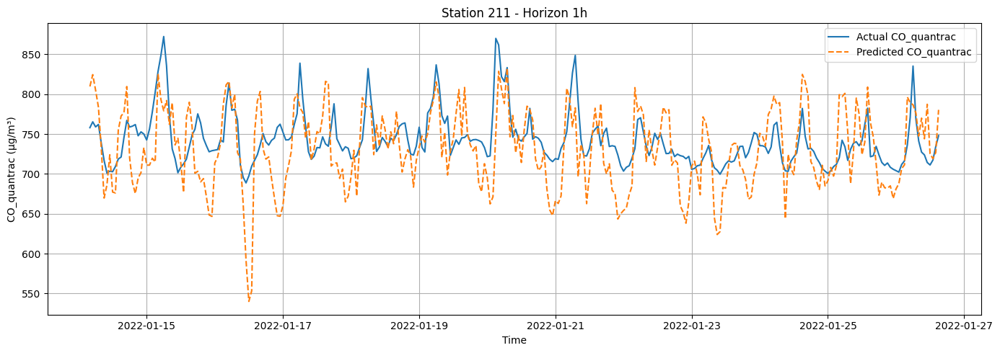

hour = 24
X_test_sid.shape: (577, 60)
y_test_sid.shape: (577, 1)
y_pred_sid.shape: (577,)


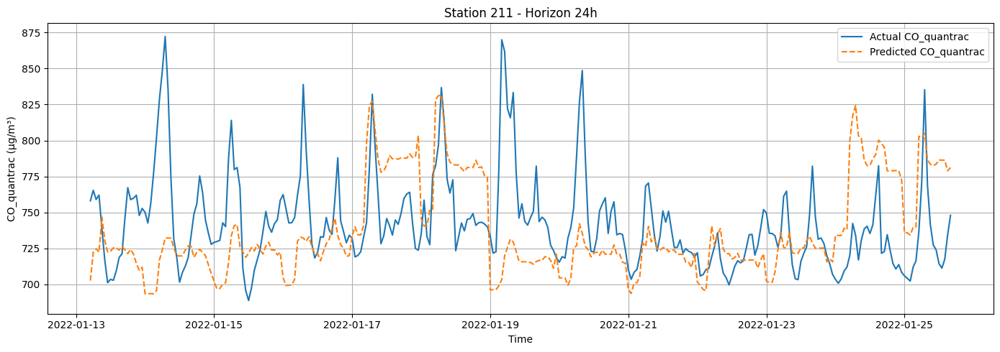

hour = 48
X_test_sid.shape: (574, 60)
y_test_sid.shape: (574, 1)
y_pred_sid.shape: (574,)


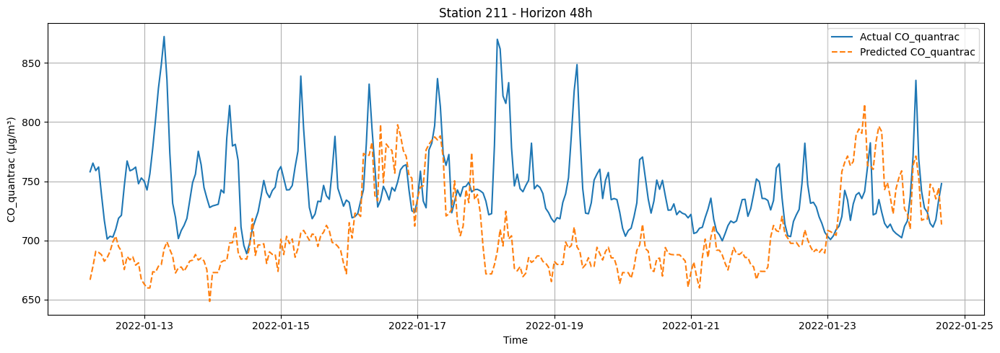

hour = 72
X_test_sid.shape: (570, 60)
y_test_sid.shape: (570, 1)
y_pred_sid.shape: (570,)


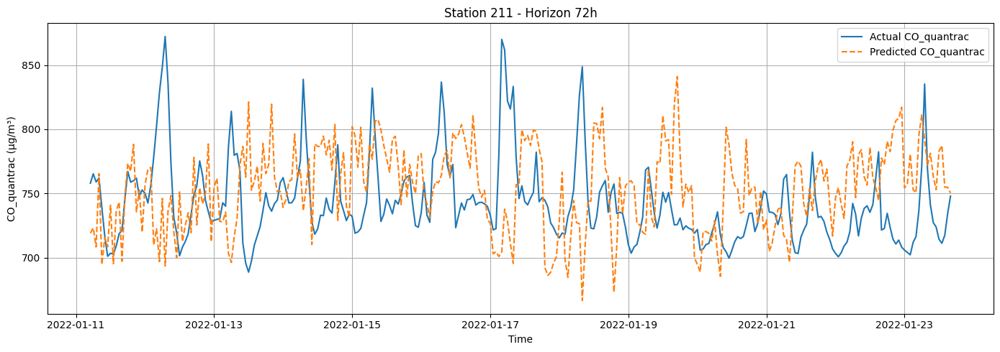

station_id = 212
hour = 1
X_test_sid.shape: (867, 60)
y_test_sid.shape: (867, 1)
y_pred_sid.shape: (867,)


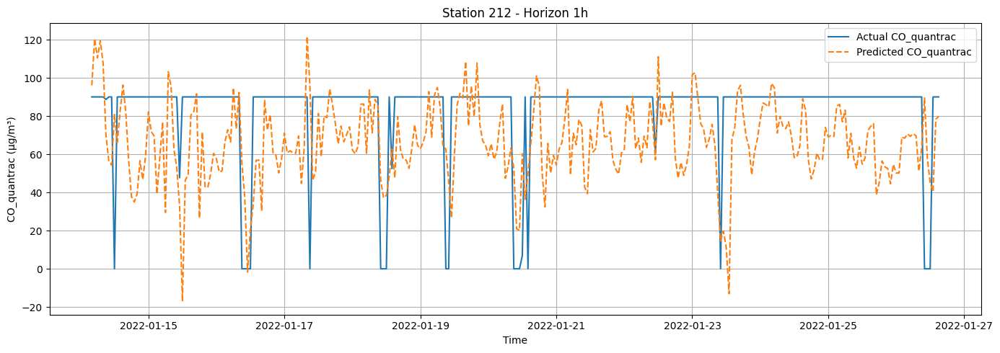

hour = 24
X_test_sid.shape: (864, 60)
y_test_sid.shape: (864, 1)
y_pred_sid.shape: (864,)


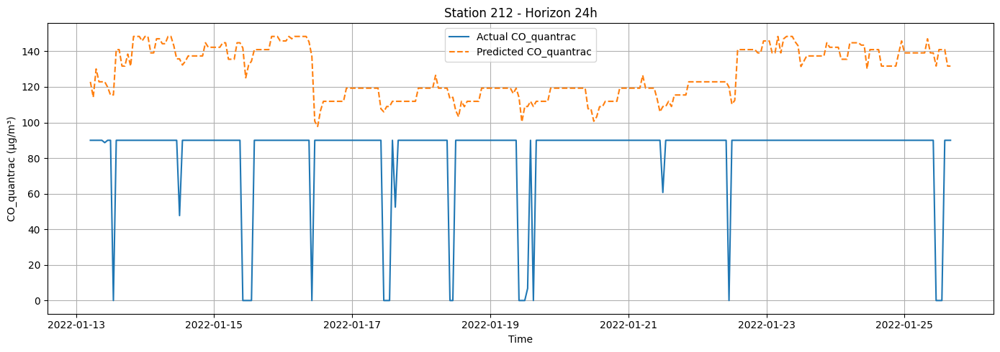

hour = 48
X_test_sid.shape: (860, 60)
y_test_sid.shape: (860, 1)
y_pred_sid.shape: (860,)


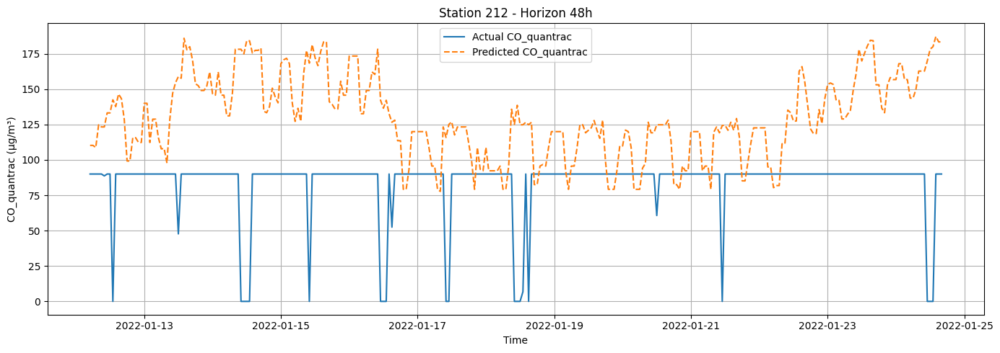

hour = 72
X_test_sid.shape: (857, 60)
y_test_sid.shape: (857, 1)
y_pred_sid.shape: (857,)


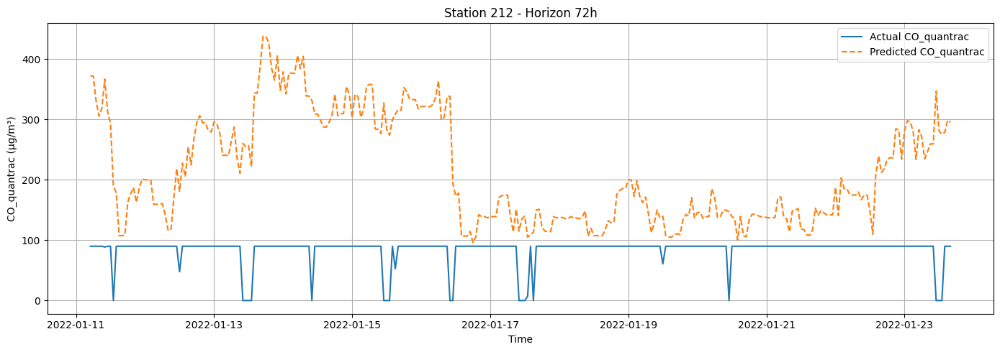

station_id = 213
hour = 1
X_test_sid.shape: (880, 60)
y_test_sid.shape: (880, 1)
y_pred_sid.shape: (880,)


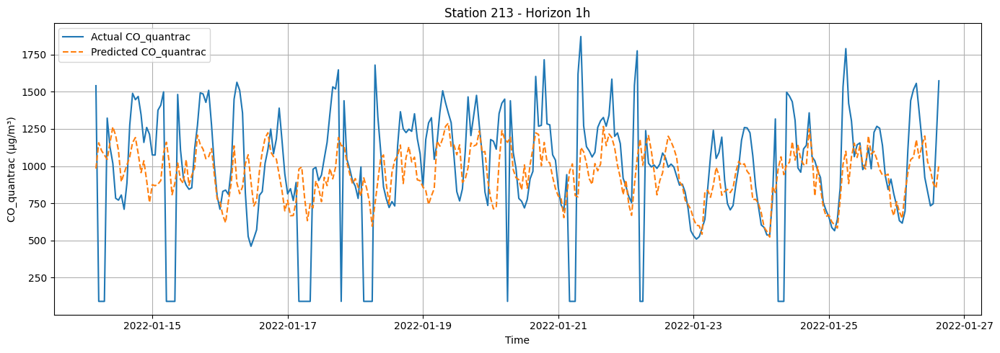

hour = 24
X_test_sid.shape: (876, 60)
y_test_sid.shape: (876, 1)
y_pred_sid.shape: (876,)


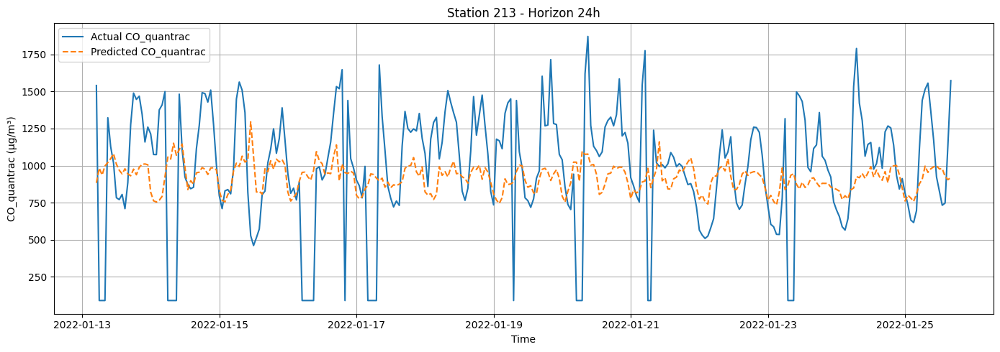

hour = 48
X_test_sid.shape: (873, 60)
y_test_sid.shape: (873, 1)
y_pred_sid.shape: (873,)


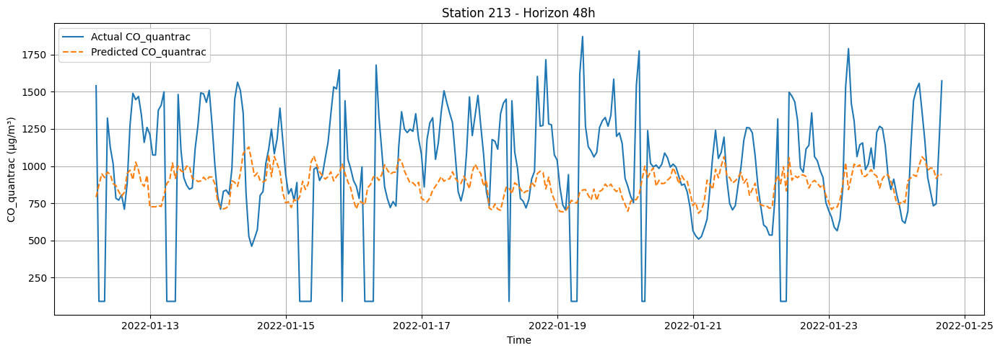

hour = 72
X_test_sid.shape: (869, 60)
y_test_sid.shape: (869, 1)
y_pred_sid.shape: (869,)


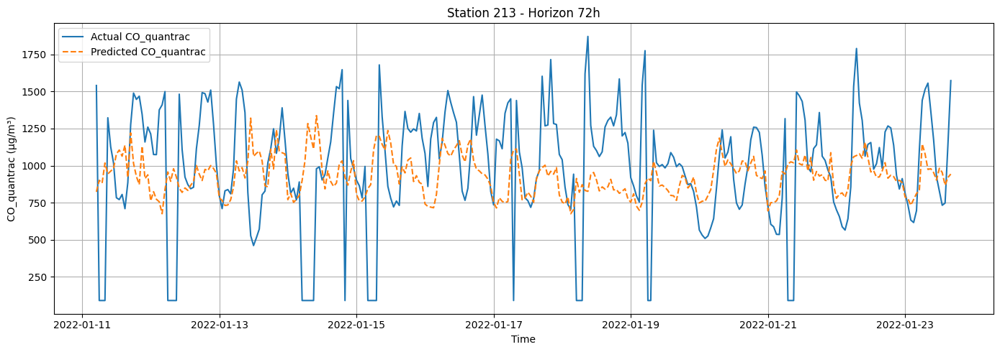

station_id = 214
hour = 1
X_test_sid.shape: (906, 60)
y_test_sid.shape: (906, 1)
y_pred_sid.shape: (906,)


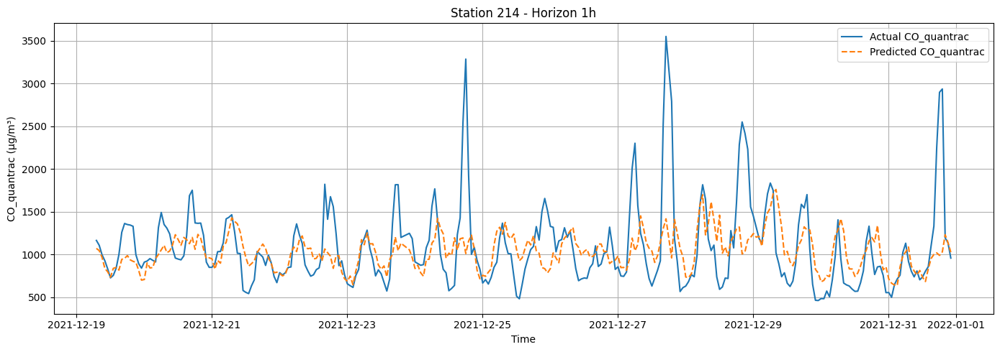

hour = 24
X_test_sid.shape: (902, 60)
y_test_sid.shape: (902, 1)
y_pred_sid.shape: (902,)


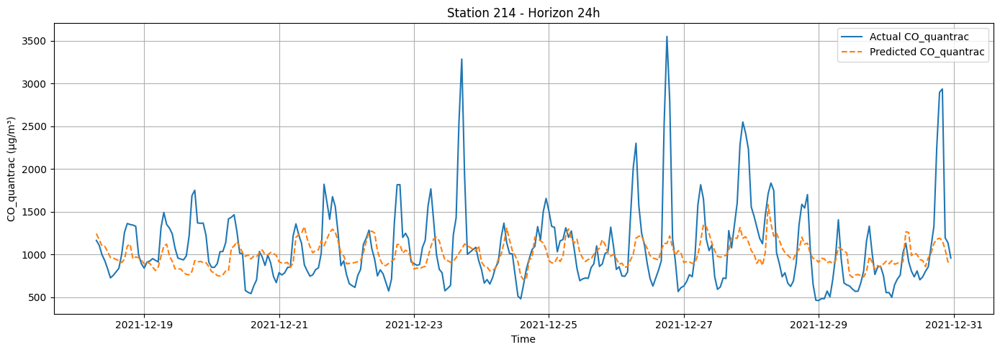

hour = 48
X_test_sid.shape: (899, 60)
y_test_sid.shape: (899, 1)
y_pred_sid.shape: (899,)


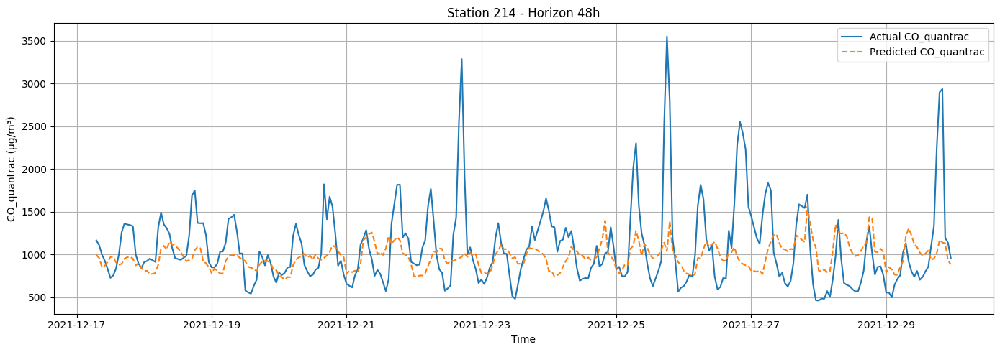

hour = 72
X_test_sid.shape: (895, 60)
y_test_sid.shape: (895, 1)
y_pred_sid.shape: (895,)


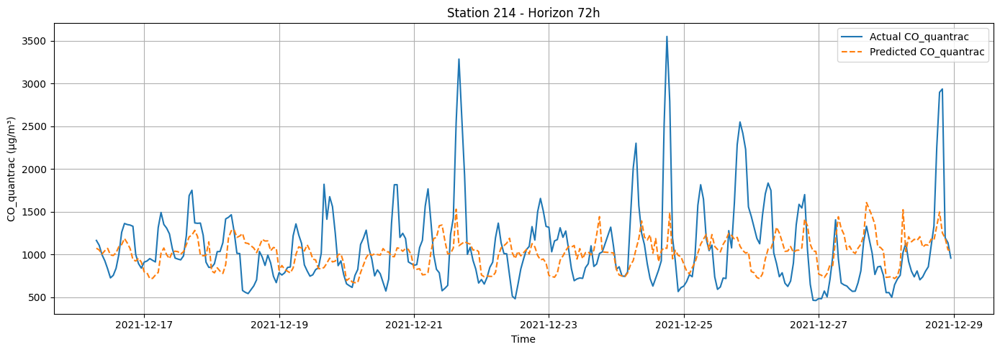

station_id = 215
hour = 1
X_test_sid.shape: (461, 60)
y_test_sid.shape: (461, 1)
y_pred_sid.shape: (461,)


In [ ]:
# Reference
for station_id in STATION_IDS:
    print(f"station_id = {station_id}")
    for hour in [1, 24, 48, 72]:
        print(f"hour = {hour}")
        plot_timeseries_example(df_co, co_models_by_h[hour], horizon_h=hour, station_id=int(station_id), target_col=label, LIGHTGBM_DIR=LIGHTGBM_DIR)